In [1]:
# For tracking changes in data generated through script and GEE attribution dataset
Dataset_version = 1
GEE_data_version = 0
Python_script_version = 0
Year = '(2001-2022)'

home_folder = '/home/chandra/backup/Chalmers/'
Simulation_version = 'DeDuCE v'+str(Dataset_version)+'.'+str(GEE_data_version)+'.'+str(Python_script_version)+' ' + Year

In [2]:
import pandas as pd
import numpy as np
import matplotlib.patches as mpatches
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [3]:
Singh_et_al_TCL = pd.read_excel(f'{home_folder}{Simulation_version}/Generated_results/DeDuCE_Aggregated_TCL_statistics.xlsx')

Total_tree_cover_loss 470978112.4107996 
Forestloss_and_deforestation: 341357411.2015873 ( 72.5 ) 
Forest_fire: 116943619.59387743 ( 24.8 ) 
Agriculture_and_forestry_deforestation: 161353373.8603196 ( 34.3 ) 
Agriculture_and_forestry_deforestation_production: 130474907.63381043 ( 27.7 )


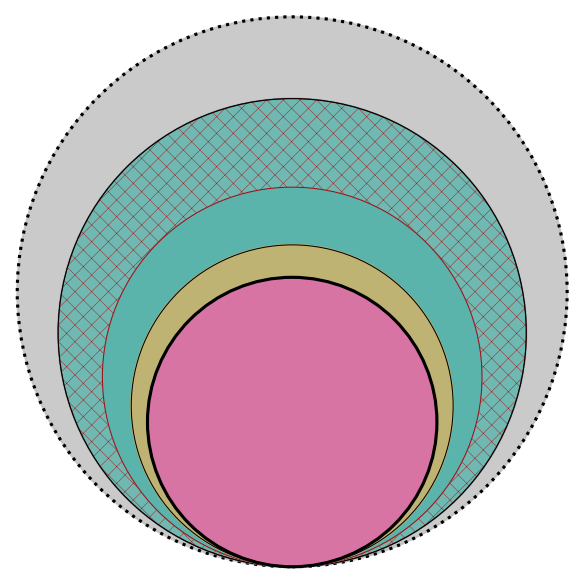

In [4]:
Singh_et_al_TCL

import matplotlib.pyplot as plt
import math


# Example area values for each circle, replace these with actual values
Total_tree_cover_loss = Singh_et_al_TCL.sum()['Treecover loss']
Forestloss_and_deforestation = Singh_et_al_TCL.sum()['Forestloss and deforestation']
Agriculture_and_forestry_deforestation = Singh_et_al_TCL.sum()['Agriculture and forestry deforestation']
Agriculture_and_forestry_deforestation_production = Singh_et_al_TCL.sum()['Agriculture and forestry deforestation (Production)']
Forest_fire = Singh_et_al_TCL.sum()['Forest fire']

print('Total_tree_cover_loss', Total_tree_cover_loss, 
      '\nForestloss_and_deforestation:', Forestloss_and_deforestation, '(',round(Forestloss_and_deforestation*100/Total_tree_cover_loss, 1),')', 
      '\nForest_fire:',  Forest_fire, '(',round(Forest_fire*100/Total_tree_cover_loss, 1),')',
      '\nAgriculture_and_forestry_deforestation:', Agriculture_and_forestry_deforestation,'(', round(Agriculture_and_forestry_deforestation*100/Total_tree_cover_loss, 1),')',
      '\nAgriculture_and_forestry_deforestation_production:', Agriculture_and_forestry_deforestation_production, '(', round(Agriculture_and_forestry_deforestation_production*100/Total_tree_cover_loss, 1),')',)
# Create a figure and a single subplot
fig, ax = plt.subplots(dpi = 150)

# Calculate the radius from the area and draw each circle
# Adjusting the y-coordinate so the circles touch at the bottom
y_offset = math.sqrt(Total_tree_cover_loss / math.pi)
radius = math.sqrt(Total_tree_cover_loss / math.pi)
circle1 = plt.Circle((0, -y_offset + radius), radius, color='#bdbdbd', fill=True, alpha = 0.8)
ax.add_artist(circle1)
circle1 = plt.Circle((0, -y_offset + radius), radius, color='black', fill=False, lw = 1.5, ls = 'dotted')
ax.add_artist(circle1)

radius = math.sqrt(Forestloss_and_deforestation / math.pi)
circle2 = plt.Circle((0, -y_offset + radius), radius, color='#5ab4ac', fill=True, alpha = 0.8)
ax.add_artist(circle2)
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 0.2 
circle2 = plt.Circle((0, -y_offset + radius), radius, color='#a50f15', fill=False, lw = 0.5, hatch = 'xxx')
ax.add_artist(circle2)
circle2 = plt.Circle((0, -y_offset + radius), radius, color='black', fill=False, lw = 0.5)
ax.add_artist(circle2)

radius = math.sqrt((Forestloss_and_deforestation - Forest_fire)/ math.pi)
circle2_1 = plt.Circle((0, -y_offset + radius), radius, color='#5ab4ac', fill=True, lw = 0.5)
ax.add_artist(circle2_1)
circle2_1 = plt.Circle((0, -y_offset + radius), radius, color='#a50f15', fill=False, lw = 0.5)
ax.add_artist(circle2_1)


radius = math.sqrt(Agriculture_and_forestry_deforestation / math.pi)
circle3 = plt.Circle((0, -y_offset + radius), radius, color='#d8b365', fill=True, alpha = 0.8)
ax.add_artist(circle3)
circle3 = plt.Circle((0, -y_offset + radius), radius, color='black', fill=False, lw = 0.5)
ax.add_artist(circle3)

radius = math.sqrt(Agriculture_and_forestry_deforestation_production / math.pi)
circle4 = plt.Circle((0, -y_offset + radius), radius, color='#df65b0', fill=True, alpha = 0.8)
ax.add_artist(circle4)
circle4 = plt.Circle((0, -y_offset + radius), radius, color='black', fill=False, lw = 1.5, ls = '-')
ax.add_artist(circle4)

# Set limits to include all circles
ax.set_xlim(-y_offset-100, y_offset+100)
ax.set_ylim(-y_offset-100, y_offset+100)

# Set aspect of the plot to be equal, so the circles aren't distorted
ax.set_aspect('equal', adjustable='box')
ax.axis('off')

# Show the plot
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure2_a.svg')

In [5]:
Forest_fire

116943619.59387743

In [6]:
# Contains Ecoregion group for GADM countries
Country_lookup_codes_ecoregion = pd.read_excel(home_folder+Simulation_version+'/Supplementary_data-DeDuCE v1.xlsx', 'Lookup-Country (GADM)')  

In [7]:
Singh_et_al_TCL['Ecoregion'] = Singh_et_al_TCL['Country'].map(Country_lookup_codes_ecoregion.set_index('COUNTRY')['ECOREGION GROUP'])

Total_tree_cover_loss 235413293.44852304 
Forestloss_and_deforestation: 154911308.2433548 ( 65.8 ) 
Forest_fire: 11253033.895580957 ( 4.8 ) 
Agriculture_and_forestry_deforestation: 133902130.35923958 ( 56.9 ) 
Agriculture_and_forestry_deforestation_production: 106199277.15543959 ( 45.1 )
---------------
Total_tree_cover_loss 235564818.9622766 
Forestloss_and_deforestation: 186446102.95823243 ( 79.1 ) 
Forest_fire: 105690585.69829649 ( 44.9 ) 
Agriculture_and_forestry_deforestation: 27451243.501080062 ( 11.7 ) 
Agriculture_and_forestry_deforestation_production: 24275630.47837084 ( 10.3 )


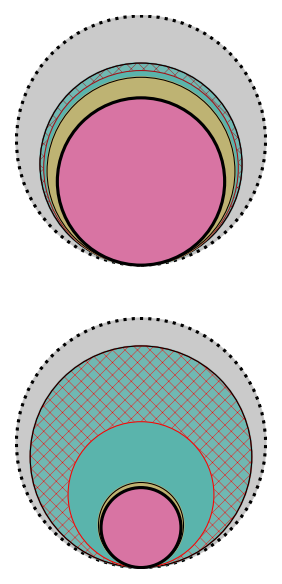

In [8]:

Singh_et_al_TCL_tropical = Singh_et_al_TCL.loc[Singh_et_al_TCL['Ecoregion'] == 'Tropical']
Singh_et_al_TCL_nottropical = Singh_et_al_TCL.loc[Singh_et_al_TCL['Ecoregion'] != 'Tropical']

import matplotlib.pyplot as plt
import math


# Example area values for each circle, replace these with actual values
Total_tree_cover_loss = Singh_et_al_TCL_tropical.sum()['Treecover loss']
Forestloss_and_deforestation = Singh_et_al_TCL_tropical.sum()['Forestloss and deforestation']
Agriculture_and_forestry_deforestation = Singh_et_al_TCL_tropical.sum()['Agriculture and forestry deforestation']
Agriculture_and_forestry_deforestation_production = Singh_et_al_TCL_tropical.sum()['Agriculture and forestry deforestation (Production)']
Forest_fire = Singh_et_al_TCL_tropical.sum()['Forest fire']

print('Total_tree_cover_loss', Total_tree_cover_loss, 
      '\nForestloss_and_deforestation:', Forestloss_and_deforestation, '(',round(Forestloss_and_deforestation*100/Total_tree_cover_loss, 1),')', 
      '\nForest_fire:',  Forest_fire, '(',round(Forest_fire*100/Total_tree_cover_loss, 1),')',
      '\nAgriculture_and_forestry_deforestation:', Agriculture_and_forestry_deforestation,'(', round(Agriculture_and_forestry_deforestation*100/Total_tree_cover_loss, 1),')',
      '\nAgriculture_and_forestry_deforestation_production:', Agriculture_and_forestry_deforestation_production, '(', round(Agriculture_and_forestry_deforestation_production*100/Total_tree_cover_loss, 1),')',)

# Create a figure and a single subplot
fig, ax = plt.subplots(2, 1, dpi = 150)

# Calculate the radius from the area and draw each circle
# Adjusting the y-coordinate so the circles touch at the bottom
y_offset = math.sqrt(Total_tree_cover_loss / math.pi)
radius = math.sqrt(Total_tree_cover_loss / math.pi)
circle1 = plt.Circle((0, -y_offset + radius), radius, color='#bdbdbd', fill=True, alpha = 0.8)
ax[0].add_artist(circle1)
circle1 = plt.Circle((0, -y_offset + radius), radius, color='black', fill=False, lw = 1.5, ls = 'dotted')
ax[0].add_artist(circle1)

radius = math.sqrt(Forestloss_and_deforestation / math.pi)
circle2 = plt.Circle((0, -y_offset + radius), radius, color='#5ab4ac', fill=True, alpha = 0.8)
ax[0].add_artist(circle2)
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 0.2 
circle2 = plt.Circle((0, -y_offset + radius), radius, color='#a50f15', fill=False, lw = 0.5, hatch = 'xxxx')
ax[0].add_artist(circle2)
circle2 = plt.Circle((0, -y_offset + radius), radius, color='black', fill=False, lw = 0.5)
ax[0].add_artist(circle2)

radius = math.sqrt((Forestloss_and_deforestation - Forest_fire)/ math.pi)
circle2_1 = plt.Circle((0, -y_offset + radius), radius, color='#5ab4ac', fill=True, lw = 0.5)
ax[0].add_artist(circle2_1)
circle2_1 = plt.Circle((0, -y_offset + radius), radius, color='#a50f15', fill=False, lw = 0.5)
ax[0].add_artist(circle2_1)

radius = math.sqrt(Agriculture_and_forestry_deforestation / math.pi)
circle3 = plt.Circle((0, -y_offset + radius), radius, color='#d8b365', fill=True, alpha = 0.8)
ax[0].add_artist(circle3)
circle3 = plt.Circle((0, -y_offset + radius), radius, color='black', fill=False, lw = 0.5)
ax[0].add_artist(circle3)

radius = math.sqrt(Agriculture_and_forestry_deforestation_production / math.pi)
circle4 = plt.Circle((0, -y_offset + radius), radius, color='#df65b0', fill=True, alpha = 0.8)
ax[0].add_artist(circle4)
circle4 = plt.Circle((0, -y_offset + radius), radius, color='black', fill=False, lw = 1.5, ls = '-')
ax[0].add_artist(circle4)

# Set limits to include all circles
ax[0].set_xlim(-y_offset-100, y_offset+100)
ax[0].set_ylim(-y_offset-100, y_offset+100)

# Set aspect of the plot to be equal, so the circles aren't distorted
ax[0].set_aspect('equal', adjustable='box')
ax[0].axis('off')



print('---------------')
# Example area values for each circle, replace these with actual values
Total_tree_cover_loss = Singh_et_al_TCL_nottropical.sum()['Treecover loss']
Forestloss_and_deforestation = Singh_et_al_TCL_nottropical.sum()['Forestloss and deforestation']
Agriculture_and_forestry_deforestation = Singh_et_al_TCL_nottropical.sum()['Agriculture and forestry deforestation']
Agriculture_and_forestry_deforestation_production = Singh_et_al_TCL_nottropical.sum()['Agriculture and forestry deforestation (Production)']
Forest_fire = Singh_et_al_TCL_nottropical.sum()['Forest fire']

print('Total_tree_cover_loss', Total_tree_cover_loss, 
      '\nForestloss_and_deforestation:', Forestloss_and_deforestation, '(',round(Forestloss_and_deforestation*100/Total_tree_cover_loss, 1),')', 
      '\nForest_fire:',  Forest_fire, '(',round(Forest_fire*100/Total_tree_cover_loss, 1),')',
      '\nAgriculture_and_forestry_deforestation:', Agriculture_and_forestry_deforestation,'(', round(Agriculture_and_forestry_deforestation*100/Total_tree_cover_loss, 1),')',
      '\nAgriculture_and_forestry_deforestation_production:', Agriculture_and_forestry_deforestation_production, '(', round(Agriculture_and_forestry_deforestation_production*100/Total_tree_cover_loss, 1),')',)

# Calculate the radius from the area and draw each circle
# Adjusting the y-coordinate so the circles touch at the bottom
y_offset = math.sqrt(Total_tree_cover_loss / math.pi)
radius = math.sqrt(Total_tree_cover_loss / math.pi)
circle1 = plt.Circle((0, -y_offset + radius), radius, color='#bdbdbd', fill=True, alpha = 0.8)
ax[1].add_artist(circle1)
circle1 = plt.Circle((0, -y_offset + radius), radius, color='black', fill=False, lw = 1.5, ls = 'dotted')
ax[1].add_artist(circle1)

radius = math.sqrt(Forestloss_and_deforestation / math.pi)
circle2 = plt.Circle((0, -y_offset + radius), radius, color='#5ab4ac', fill=True, alpha = 0.8)
ax[1].add_artist(circle2)
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 0.2 
circle2 = plt.Circle((0, -y_offset + radius), radius, color='red', fill=False, lw = 0.5, hatch = 'xxxx')
ax[1].add_artist(circle2)
circle2 = plt.Circle((0, -y_offset + radius), radius, color='black', fill=False, lw = 0.5)
ax[1].add_artist(circle2)

radius = math.sqrt((Forestloss_and_deforestation - Forest_fire)/ math.pi)
circle2_1 = plt.Circle((0, -y_offset + radius), radius, color='#5ab4ac', fill=True, lw = 0.5)
ax[1].add_artist(circle2_1)
circle2_1 = plt.Circle((0, -y_offset + radius), radius, color='red', fill=False, lw = 0.5)
ax[1].add_artist(circle2_1)

radius = math.sqrt(Agriculture_and_forestry_deforestation / math.pi)
circle3 = plt.Circle((0, -y_offset + radius), radius, color='#d8b365', fill=True, alpha = 0.8)
ax[1].add_artist(circle3)
circle3 = plt.Circle((0, -y_offset + radius), radius, color='black', fill=False, lw = 0.5)
ax[1].add_artist(circle3)

radius = math.sqrt(Agriculture_and_forestry_deforestation_production / math.pi)
circle4 = plt.Circle((0, -y_offset + radius), radius, color='#df65b0', fill=True, alpha = 0.8)
ax[1].add_artist(circle4)
circle4 = plt.Circle((0, -y_offset + radius), radius, color='black', fill=False, lw = 1.5, ls = '-')
ax[1].add_artist(circle4)

# Set limits to include all circles
ax[1].set_xlim(-y_offset-100, y_offset+100)
ax[1].set_ylim(-y_offset-100, y_offset+100)

# Set aspect of the plot to be equal, so the circles aren't distorted
ax[1].set_aspect('equal', adjustable='box')
ax[1].axis('off')

# Show the plot
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure2_bc.svg')

In [9]:
Singh_et_al = pd.read_excel(f'{home_folder}{Simulation_version}/Generated_results/DeDuCE_Deforestation_attribution_v{Dataset_version}.{GEE_data_version}.{Python_script_version} {Year}.xlsx', sheet_name = 'Deforestation attribution')

In [10]:
len(Singh_et_al['Commodity'].unique())

184

In [11]:
len(Singh_et_al['Producer country'].unique())

176

In [12]:
Singh_et_al.groupby(['Commodity', 'Producer country']).size().reset_index(name='Counts')

,Commodity,Producer country,Counts
0,"Abaca, manila hemp, raw",Costa Rica,22
1,"Abaca, manila hemp, raw",Ecuador,22
2,"Abaca, manila hemp, raw",Equatorial Guinea,22
3,"Abaca, manila hemp, raw",Indonesia,22
4,"Abaca, manila hemp, raw",Philippines,22
...,...,...,...
9101,Yautia,Peru,22
9102,Yautia,Puerto Rico,22
9103,Yautia,Saint Lucia,22
9104,Yautia,Trinidad and Tobago,22


In [13]:
Singh_et_al.groupby(['Commodity', 'Commodity group']).size().reset_index().to_csv('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Supplementary_Table_2.csv')

In [14]:
Singh_et_al.groupby(['Producer country', 'Continent/Country group']).size().reset_index().to_csv('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Supplementary_Table_1.csv')

In [15]:
Crop_category = pd.read_excel(home_folder+Simulation_version+'/Supplementary_data-DeDuCE v1.xlsx', 'Lookup-FAO commodity')  
Continent = pd.read_excel(home_folder+Simulation_version+'/Supplementary_data-DeDuCE v1.xlsx', 'Lookup-Country (GADM)')        


In [16]:
Singh_et_al_grouped = Singh_et_al.groupby(['Continent/Country group', 'Producer country', 'Commodity group', 'Commodity', 'Year']).sum().reset_index()[['Continent/Country group',
                                                                                         'Deforestation attribution, unamortized (ha)', 
                                                                                         'Deforestation emissions excl. peat drainage, unamortized (MtCO2)',
                                                                                                             'Peatland drainage emissions (MtCO2)']]

In [8]:
Country_group_color = {
    'Continent/Country group': ['Africa', 'Europe', 'North and Central America', 'Oceania', 'South America', 'North Asia', 'Southeast Asia', 'Rest of Asia'],
    'Color': ['#DD7271', '#FBD440', '#CDDC21', '#A1A8DC', '#CA93DA', '#64D0E2', '#B7B7B7', '#3197A8']
}

Country_group_color = pd.DataFrame(Country_group_color)
Country_group_color

,Continent/Country group,Color
0,Africa,#DD7271
1,Europe,#FBD440
2,North and Central America,#CDDC21
3,Oceania,#A1A8DC
4,South America,#CA93DA
5,North Asia,#64D0E2
6,Southeast Asia,#B7B7B7
7,Rest of Asia,#3197A8


In [18]:
Country_group = Singh_et_al_grouped.groupby(['Continent/Country group']).sum().reset_index()
Country_group['Color'] = Country_group['Continent/Country group'].map(Country_group_color.set_index('Continent/Country group')['Color'])
Country_group = Country_group.set_index('Continent/Country group').reindex(index=Country_group_color['Continent/Country group']).reset_index()
#Country_group = Country_group.rename(columns = {'Country': 'Continent/Country group'})

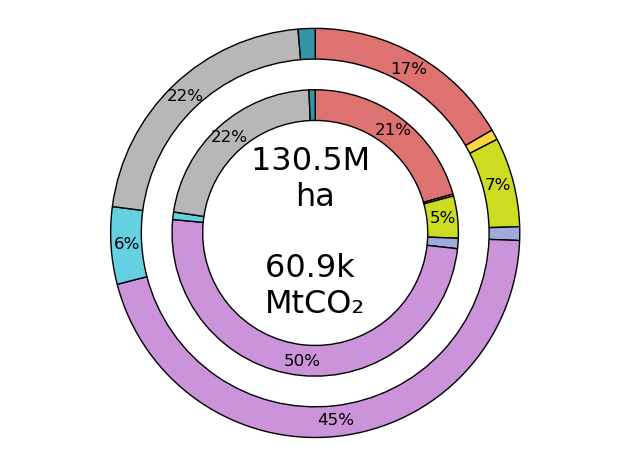

In [19]:
## Plotting pie charts

colors = Country_group['Color'].values[0:]

v1 = Country_group['Deforestation attribution, unamortized (ha)'].values
labels1 = Country_group['Continent/Country group'].values
v2 = Country_group['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'].values
labels2 = Country_group['Continent/Country group'].values

width = 0.15
wedge_properties_1 = {"width": width, "edgecolor": "black", 'linewidth': 1, 'antialiased': True}
wedge_properties_2 = {"width": width, "edgecolor": "black", 'linewidth': 1, 'antialiased': True}

fig, ax1 = plt.subplots()

_, _, autotexts = ax1.pie(v1, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.92,
                        wedgeprops=wedge_properties_1, startangle=90, counterclock = False)
for autotext in autotexts:
    autotext.set(size=12)
    if float(autotext.get_text().replace('%', '')) <= 2:  # Hide labels for values <= 1%
        autotext.set_text('')

_, _, autotexts = ax1.pie(v2, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.90,
                        radius=0.85-width, wedgeprops=wedge_properties_2, startangle=90, counterclock = False)
for autotext in autotexts:
    autotext.set(size=12)
    if float(autotext.get_text().replace('%', '')) <= 2:  # Hide labels for values <= 1%
        autotext.set_text('')

# Example data for Country_group.sum()
total_deforestation = Country_group.sum()[['Deforestation attribution, unamortized (ha)']].values[0]
total_emissions = Country_group.sum()[['Deforestation emissions excl. peat drainage, unamortized (MtCO2)']].values[0]
# Convert to more readable numbers, M for million, k for thousand
readable_deforestation = total_deforestation / 1e6  # Convert to millions
readable_emissions = total_emissions / 1e3  # Convert to thousands

plt.text(0, 0, f"{readable_deforestation:.1f}M \nha\n\n{readable_emissions:.1f}k \nMtCO₂", ha='center', va='center', fontsize = 23)



ax1.axis('equal')
plt.tight_layout()

plt.show()


In [20]:
Selected_data = Singh_et_al.groupby(['Continent/Country group', 'Producer country']).sum().reset_index()[['Continent/Country group', 'Producer country',
                                                                                                            'Deforestation attribution, unamortized (ha)', 
                                                                                                            'Deforestation emissions excl. peat drainage, unamortized (MtCO2)']]

In [21]:
Selected_data

,Continent/Country group,Producer country,"Deforestation attribution, unamortized (ha)","Deforestation emissions excl. peat drainage, unamortized (MtCO2)"
0,Africa,Algeria,7.477619e+03,1.952677
1,Africa,Angola,1.229576e+06,704.970744
2,Africa,Benin,2.983711e+04,16.847317
3,Africa,Botswana,9.535810e+02,0.247597
4,Africa,Burkina Faso,3.253890e+02,0.153756
...,...,...,...,...
171,Southeast Asia,Philippines,8.800433e+05,491.868591
172,Southeast Asia,Singapore,1.788834e+02,0.079652
173,Southeast Asia,Thailand,1.735943e+06,678.250325
174,Southeast Asia,Timor-Leste,4.767726e+03,2.339191


In [22]:
# Here's how you'd transform the 'Commodity' column:
Countries_to_keep = ['Brazil', 'Indonesia', 'Democratic Republic of the Congo', 'Côte d\'Ivoire', 'China', 'United States']

# Replace all other commodity names with 'Other commodities'
Selected_data['Selected_Countries'] = Selected_data['Producer country'].apply(lambda x: x if x in Countries_to_keep else 'Other countries')
# Assign colors based on the 'Country' column
Selected_data['Color'] = Selected_data['Selected_Countries'].apply(lambda x: 'white' if x == 'Other countries' else 'black')
Selected_data.loc[Selected_data['Producer country'] == 'Côte d\'Ivoire', 'Color'] = 'grey'

In [23]:
# Create an ordered CategoricalDtype based on the order in df2
continent_order = pd.CategoricalDtype(Country_group_color['Continent/Country group'], ordered=True)
# Convert 'Continent/Country group' in df1 to this categorical type
Selected_data['Continent/Country group'] = pd.Categorical(Selected_data['Continent/Country group'], categories=continent_order.categories, ordered=True)
# Now you can sort df1 by 'Continent/Country group'
# Creating a color order, with 'black' before 'white'
color_order = pd.CategoricalDtype(['black', 'grey', 'white'], ordered=True)

# Assigning the color order to the 'Color' column in df1
Selected_data['Color'] = pd.Categorical(Selected_data['Color'], categories=color_order.categories, ordered=True)

# Sorting df1 by 'Continent/Country group' first, then by 'Color'
Selected_data = Selected_data.sort_values(by=['Continent/Country group', 'Color'])
Selected_data.loc[Selected_data['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] < 0, 'Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] = 0

In [24]:
Selected_data

,Continent/Country group,Producer country,"Deforestation attribution, unamortized (ha)","Deforestation emissions excl. peat drainage, unamortized (MtCO2)",Selected_Countries,Color
12,Africa,Democratic Republic of the Congo,7.307966e+06,5779.232190,Democratic Republic of the Congo,black
11,Africa,Côte d'Ivoire,3.012392e+06,1008.529271,Côte d'Ivoire,grey
0,Africa,Algeria,7.477619e+03,1.952677,Other countries,white
1,Africa,Angola,1.229576e+06,704.970744,Other countries,white
2,Africa,Benin,2.983711e+04,16.847317,Other countries,white
...,...,...,...,...,...,...
146,Rest of Asia,Tajikistan,2.744513e+02,0.224059,Other countries,white
147,Rest of Asia,Turkey,6.968590e+04,7.475378,Other countries,white
148,Rest of Asia,Turkmenistan,2.072832e+02,0.088249,Other countries,white
149,Rest of Asia,Uzbekistan,8.710074e+02,0.474307,Other countries,white


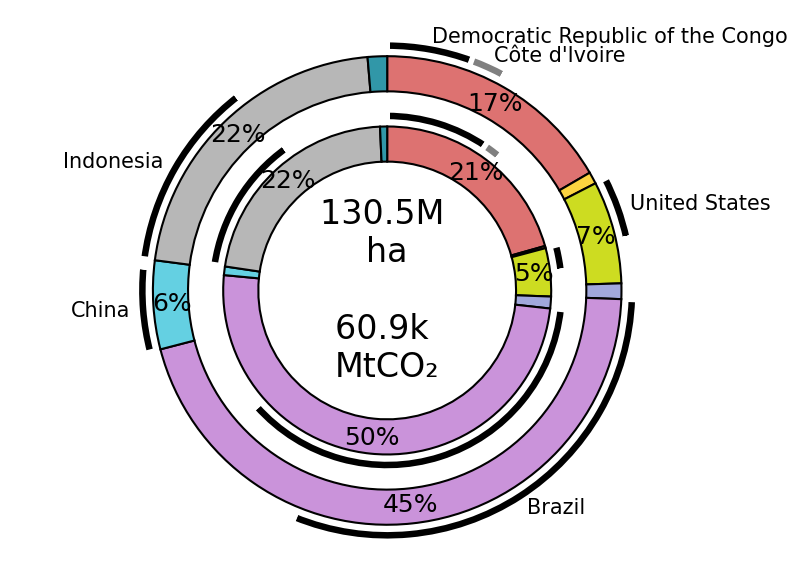

In [25]:
## Plotting pie charts
colors = Country_group['Color'].values[0:]

v1 = Country_group['Deforestation attribution, unamortized (ha)'].values
labels1 = Country_group['Continent/Country group'].values
v2 = Country_group['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'].values
labels2 = Country_group['Continent/Country group'].values

width = 0.15
wedge_properties_1 = {"width": width, "edgecolor": "black", 'linewidth': 1, 'antialiased': True}
wedge_properties_2 = {"width": width, "edgecolor": "black", 'linewidth': 1, 'antialiased': True}

fig, ax1 = plt.subplots(dpi = 150)

_, _, autotexts = ax1.pie(v1, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.92,
                        wedgeprops=wedge_properties_1, startangle=90, counterclock = False)
for autotext in autotexts:
    autotext.set(size=12)
    if float(autotext.get_text().replace('%', '')) <= 2:  # Hide labels for values <= 1%
        autotext.set_text('')

_, _, autotexts = ax1.pie(v2, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.90,
                        radius=0.85-width, wedgeprops=wedge_properties_2, startangle=90, counterclock = False)
for autotext in autotexts:
    autotext.set(size=12)
    if float(autotext.get_text().replace('%', '')) <= 2:  # Hide labels for values <= 1%
        autotext.set_text('')

# Example data for Country_group.sum()
total_deforestation = Country_group.sum()[['Deforestation attribution, unamortized (ha)']].values[0]
total_emissions = Country_group.sum()[['Deforestation emissions excl. peat drainage, unamortized (MtCO2)']].values[0]
# Convert to more readable numbers, M for million, k for thousand
readable_deforestation = total_deforestation / 1e6  # Convert to millions
readable_emissions = total_emissions / 1e3  # Convert to thousands

plt.text(0, 0, f"{readable_deforestation:.1f}M \nha\n\n{readable_emissions:.1f}k \nMtCO₂", ha='center', va='center', fontsize = 16)


################################
colors = Selected_data['Color'].values
Selected_data.loc[Selected_data['Producer country'] == 'Democratic Republic of the Congo', 'Producer country'] = 'DR Congo'

v1 = Selected_data['Deforestation attribution, unamortized (ha)'].values
labels1 = Selected_data['Selected_Countries'].values
labels1= [label if label != 'Other countries' else '' for label in labels1]

v2 = Selected_data['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'].values
labels2 = Selected_data['Selected_Countries'].values

width = 0.05
wedge_properties_1 = {"width": width, "edgecolor": "white", 'linewidth': 2.5, 'antialiased': True}
wedge_properties_2 = {"width": width, "edgecolor": "white", 'linewidth': 2.5, 'antialiased': True}

_, _, autotexts = ax1.pie(v1, colors=colors, labeldistance=1.03, autopct='%1.0f%%', pctdistance = 0.92,
                        radius = 1.12-width, wedgeprops=wedge_properties_1, startangle=90, counterclock = False, labels=labels1)
for autotext in autotexts:
    autotext.set(size=0)
    if float(autotext.get_text().replace('%', '')) >= 0:  # Hide labels for values <= 1%
        autotext.set_text('')

_, _, autotexts = ax1.pie(v2, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.90,
                        radius=0.82-width, wedgeprops=wedge_properties_2, startangle=90, counterclock = False)
for autotext in autotexts:
    autotext.set(size=-0)
    if float(autotext.get_text().replace('%', '')) >= 0:  # Hide labels for values <= 1%
        autotext.set_text('')

# Example data for Country_group.sum()
total_deforestation = Selected_data.sum()[['Deforestation attribution, unamortized (ha)']].values[0]
total_emissions = Selected_data.sum()[['Deforestation emissions excl. peat drainage, unamortized (MtCO2)']].values[0]


ax1.axis('equal')
#plt.tight_layout()
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure3_a.svg')

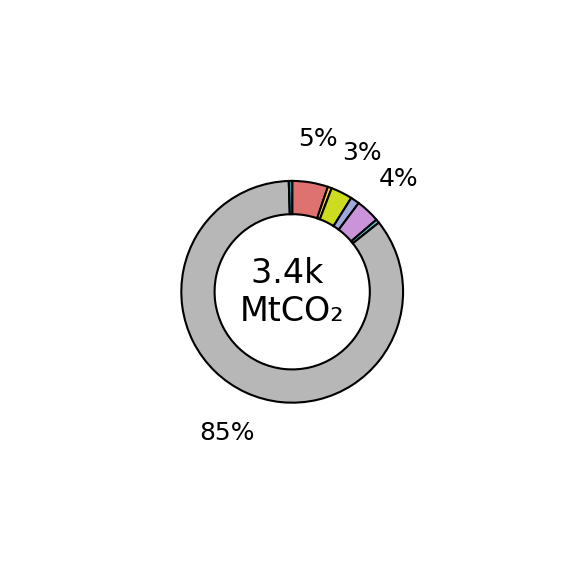

In [26]:
## Plotting pie charts
colors = Country_group['Color'].values[0:]

v2 = Country_group['Peatland drainage emissions (MtCO2)'].values
labels2 = Country_group['Continent/Country group'].values

width = 0.15
wedge_properties_2 = {"width": width, "edgecolor": "black", 'linewidth': 1, 'antialiased': True}

fig, ax1 = plt.subplots(dpi = 150)

_, _, autotexts = ax1.pie(v2, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 1.4,
                        radius=0.65-width, wedgeprops=wedge_properties_2, startangle=90, counterclock = False)
for autotext in autotexts:
    autotext.set(size=12)
    if float(autotext.get_text().replace('%', '')) <= 2:  # Hide labels for values <= 1%
        autotext.set_text('')

# Example data for Country_group.sum()
total_emissions = Country_group.sum()[['Peatland drainage emissions (MtCO2)']].values[0]
# Convert to more readable numbers, M for million, k for thousand
readable_emissions = total_emissions / 1e3  # Convert to thousands

plt.text(0, 0, f"{readable_emissions:.1f}k \nMtCO₂", ha='center', va='center', fontsize = 16)
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure3_a1.svg')

In [27]:
Singh_et_al_grouped = Singh_et_al.groupby(['Continent/Country group', 'Producer country', 'Commodity group', 'Commodity', 'Year']).sum().reset_index()[['Commodity group',
                                                                                         'Deforestation attribution, unamortized (ha)', 
                                                                                         'Deforestation emissions excl. peat drainage, unamortized (MtCO2)',
                                                                                        'Peatland drainage emissions (MtCO2)']]

In [67]:
Commodity_group_color = {
    'Commodity group': ['Cereals', 'Edible roots and tubers with high starch or inulin content', 'Fibre crops', 'Forest plantation', 'Fruit and nuts', 'Oilseeds and oleaginous fruits', 'Pasture', 'Pulses (dried leguminous vegetables)', 'Stimulant, spice and aromatic crops', 'Sugar crops', 'Vegetables'],
    'Color': ['#d8b365', '#999999', '#fc8d59', '#4ce600', '#2b8cbe', '#810f7c', '#d4b9da', '#081d58', '#e7298a', '#ffff33', '#00a844']
}

Commodity_group_color = pd.DataFrame(Commodity_group_color)
Commodity_group_color

,Commodity group,Color
0,Cereals,#d8b365
1,Edible roots and tubers with high starch or in...,#999999
2,Fibre crops,#fc8d59
3,Forest plantation,#4ce600
4,Fruit and nuts,#2b8cbe
5,Oilseeds and oleaginous fruits,#810f7c
6,Pasture,#d4b9da
7,Pulses (dried leguminous vegetables),#081d58
8,"Stimulant, spice and aromatic crops",#e7298a
9,Sugar crops,#ffff33


In [29]:
Commodity_group = Singh_et_al_grouped.groupby(['Commodity group']).sum().reset_index()
Commodity_group['Color'] = Commodity_group['Commodity group'].map(Commodity_group_color.set_index('Commodity group')['Color'])
Commodity_group = Commodity_group.set_index('Commodity group').reindex(index=Commodity_group_color['Commodity group']).reset_index()

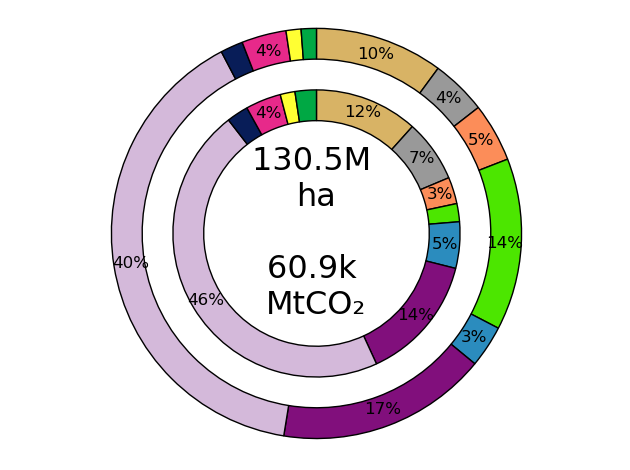

In [30]:
## Plotting pie charts

colors = Commodity_group['Color'].values

v1 = Commodity_group['Deforestation attribution, unamortized (ha)'].values
labels1 = Commodity_group['Commodity group'].values
v2 = Commodity_group['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'].values
labels2 = Commodity_group['Commodity group'].values

width = 0.15
wedge_properties_1 = {"width": width, "edgecolor": "black", 'linewidth': 1, 'antialiased': True}
wedge_properties_2 = {"width": width, "edgecolor": "black", 'linewidth': 1, 'antialiased': True}

fig, ax1 = plt.subplots()

_, _, autotexts = ax1.pie(v1, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.92,
                        wedgeprops=wedge_properties_1, startangle=90, counterclock = False)
for autotext in autotexts:
    autotext.set(size=12)
    if float(autotext.get_text().replace('%', '')) <= 2:  # Hide labels for values <= 1%
        autotext.set_text('')

_, _, autotexts = ax1.pie(v2, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.90,
                        radius=0.85-width, wedgeprops=wedge_properties_2, startangle=90, counterclock = False)
for autotext in autotexts:
    autotext.set(size=12)
    if float(autotext.get_text().replace('%', '')) <= 2:  # Hide labels for values <= 1%
        autotext.set_text('')

# Example data for Country_group.sum()
total_deforestation = Country_group.sum()[['Deforestation attribution, unamortized (ha)']].values[0]
total_emissions = Country_group.sum()[['Deforestation emissions excl. peat drainage, unamortized (MtCO2)']].values[0]
# Convert to more readable numbers, M for million, k for thousand
readable_deforestation = total_deforestation / 1e6  # Convert to millions
readable_emissions = total_emissions / 1e3  # Convert to thousands

plt.text(0, 0, f"{readable_deforestation:.1f}M \nha\n\n{readable_emissions:.1f}k \nMtCO₂", ha='center', va='center', fontsize = 23)



ax1.axis('equal')
plt.tight_layout()

plt.show()


In [31]:
Selected_data = Singh_et_al.groupby(['Commodity group', 'Commodity']).sum().reset_index()[['Commodity group', 'Commodity',
                                                                                                            'Deforestation attribution, unamortized (ha)', 
                                                                                                            'Deforestation emissions excl. peat drainage, unamortized (MtCO2)']]

In [32]:
Selected_data

,Commodity group,Commodity,"Deforestation attribution, unamortized (ha)","Deforestation emissions excl. peat drainage, unamortized (MtCO2)"
0,Cereals,Barley,316017.350115,138.764105
1,Cereals,Buckwheat,13227.032502,6.263088
2,Cereals,Canary seed,9776.218651,6.049374
3,Cereals,Cereals n.e.c.,48949.404097,31.821363
4,Cereals,Fonio,19645.698738,11.535896
...,...,...,...,...
179,Vegetables,"Pumpkins, squash and gourds",48322.256417,41.968884
180,Vegetables,Spinach,31631.886096,45.879877
181,Vegetables,String beans,3779.717341,2.748314
182,Vegetables,Tomatoes,101113.359817,74.564363


In [33]:
# Here's how you'd transform the 'Commodity' column:
Commodities_to_keep = ['Cocoa beans', 'Coffee, green', 'Natural rubber in primary forms', 'Oil palm fruit', 'Soya beans', 'Cassava, fresh', 'Maize (corn)', 'Rice']

# Replace all other commodity names with 'Other commodities'
Selected_data['Selected_Commodities'] = Selected_data['Commodity'].apply(lambda x: x if x in Commodities_to_keep else 'Other commodities')
# Assign colors based on the 'Country' column
Selected_data['Color'] = Selected_data['Selected_Commodities'].apply(lambda x: 'white' if x == 'Other commodities' else 'black')

Selected_data.loc[Selected_data['Commodity'] == 'Coffee, green', 'Color'] = 'grey'
Selected_data.loc[Selected_data['Commodity'] == 'Soya beans', 'Color'] = 'grey'
Selected_data.loc[Selected_data['Commodity'] == 'Rice', 'Color'] = 'grey'

In [34]:
# Create an ordered CategoricalDtype based on the order in df2
commodity_order = pd.CategoricalDtype(Commodity_group_color['Commodity group'], ordered=True)
# Convert 'Continent/Country group' in df1 to this categorical type
Selected_data['Commodity group'] = pd.Categorical(Selected_data['Commodity group'], categories=commodity_order.categories, ordered=True)
# Now you can sort df1 by 'Continent/Country group'
# Creating a color order, with 'black' before 'white'
color_order = pd.CategoricalDtype(['black', 'grey', 'white'], ordered=True)

# Assigning the color order to the 'Color' column in df1
Selected_data['Color'] = pd.Categorical(Selected_data['Color'], categories=color_order.categories, ordered=True)

# Sorting df1 by 'Continent/Country group' first, then by 'Color'
Selected_data = Selected_data.sort_values(by=['Commodity group', 'Color'])
Selected_data.loc[Selected_data['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] < 0, 'Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] = 0

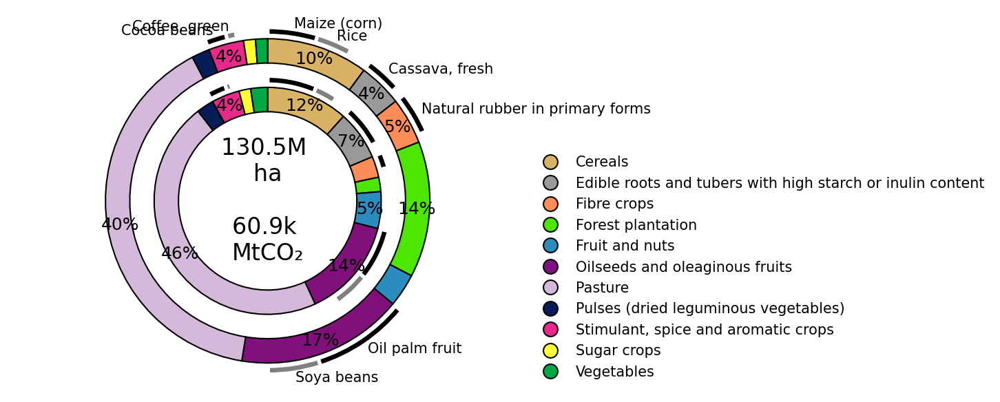

In [35]:
## Plotting pie charts

colors = Commodity_group['Color'].values

v1 = Commodity_group['Deforestation attribution, unamortized (ha)'].values
labels1 = Commodity_group['Commodity group'].values
v2 = Commodity_group['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'].values
labels2 = Commodity_group['Commodity group'].values

width = 0.15
wedge_properties_1 = {"width": width, "edgecolor": "black", 'linewidth': 1, 'antialiased': True}
wedge_properties_2 = {"width": width, "edgecolor": "black", 'linewidth': 1, 'antialiased': True}

fig, ax1 = plt.subplots(dpi = 150)

patches, _, autotexts = ax1.pie(v1, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.92,
                        wedgeprops=wedge_properties_1, startangle=90, counterclock = False)
for autotext in autotexts:
    autotext.set(size=12)
    if float(autotext.get_text().replace('%', '')) < 4:  # Hide labels for values <= 1%
        autotext.set_text('')

_, _, autotexts = ax1.pie(v2, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.90,
                        radius=0.85-width, wedgeprops=wedge_properties_2, startangle=90, counterclock = False)
for autotext in autotexts:
    autotext.set(size=12)
    if float(autotext.get_text().replace('%', '')) < 4:  # Hide labels for values <= 1%
        autotext.set_text('')

# Example data for Country_group.sum()
total_deforestation = Country_group.sum()[['Deforestation attribution, unamortized (ha)']].values[0]
total_emissions = Country_group.sum()[['Deforestation emissions excl. peat drainage, unamortized (MtCO2)']].values[0]
# Convert to more readable numbers, M for million, k for thousand
readable_deforestation = total_deforestation / 1e6  # Convert to millions
readable_emissions = total_emissions / 1e3  # Convert to thousands

plt.text(0, 0, f"{readable_deforestation:.1f}M \nha\n\n{readable_emissions:.1f}k \nMtCO₂", ha='center', va='center', fontsize = 16)

# Custom legend with circular markers
from matplotlib.lines import Line2D  # For custom legend
legend_elements = [Line2D([0], [0], marker='o', color='w', label=label, markeredgewidth=1, markeredgecolor='black',
                          markerfacecolor=color, markersize=10) for label, color in zip(labels1, colors)]
ax1.legend(handles=legend_elements, loc="lower left", bbox_to_anchor=(1, 0, 0.5, 1), frameon=False)



################################
colors = Selected_data['Color'].values

v1 = Selected_data['Deforestation attribution, unamortized (ha)'].values
labels1 = Selected_data['Selected_Commodities'].values
labels1= [label if label != 'Other commodities' else '' for label in labels1]

v2 = Selected_data['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'].values
labels2 = Selected_data['Selected_Commodities'].values

width = 0.05
wedge_properties_1 = {"width": width, "edgecolor": "white", 'linewidth': 2.5, 'antialiased': True}
wedge_properties_2 = {"width": width, "edgecolor": "white", 'linewidth': 2.5, 'antialiased': True}

_, _, autotexts = ax1.pie(v1, colors=colors, labeldistance=1.03, autopct='%1.0f%%', pctdistance = 0.92,
                        radius = 1.12-width, wedgeprops=wedge_properties_1, startangle=90, counterclock = False, labels=labels1)
for autotext in autotexts:
    autotext.set(size=0)
    if float(autotext.get_text().replace('%', '')) >= 0:  # Hide labels for values <= 1%
        autotext.set_text('')

_, _, autotexts = ax1.pie(v2, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.90,
                        radius=0.82-width, wedgeprops=wedge_properties_2, startangle=90, counterclock = False)
for autotext in autotexts:
    autotext.set(size=-0)
    if float(autotext.get_text().replace('%', '')) >= 0:  # Hide labels for values <= 1%
        autotext.set_text('')

# Example data for Country_group.sum()
total_deforestation = Selected_data.sum()[['Deforestation attribution, unamortized (ha)']].values[0]
total_emissions = Selected_data.sum()[['Deforestation emissions excl. peat drainage, unamortized (MtCO2)']].values[0]


ax1.axis('equal')
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure3_b.svg')

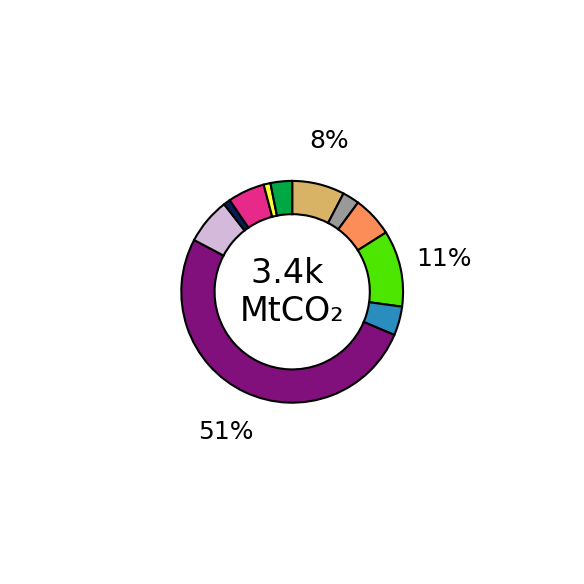

In [36]:
## Plotting pie charts
colors = Commodity_group['Color'].values[0:]

v2 = Commodity_group['Peatland drainage emissions (MtCO2)'].values
labels2 = Commodity_group['Commodity group'].values

width = 0.15
wedge_properties_2 = {"width": width, "edgecolor": "black", 'linewidth': 1, 'antialiased': True}

fig, ax1 = plt.subplots(dpi = 150)

_, _, autotexts = ax1.pie(v2, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 1.4,
                        radius=0.65-width, wedgeprops=wedge_properties_2, startangle=90, counterclock = False)
for autotext in autotexts:
    autotext.set(size=12)
    if float(autotext.get_text().replace('%', '')) < 8:  # Hide labels for values <= 1%
        autotext.set_text('')

# Example data for Country_group.sum()
total_emissions = Country_group.sum()[['Peatland drainage emissions (MtCO2)']].values[0]
# Convert to more readable numbers, M for million, k for thousand
readable_emissions = total_emissions / 1e3  # Convert to thousands

plt.text(0, 0, f"{readable_emissions:.1f}k \nMtCO₂", ha='center', va='center', fontsize = 16)
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure3_b1.svg')

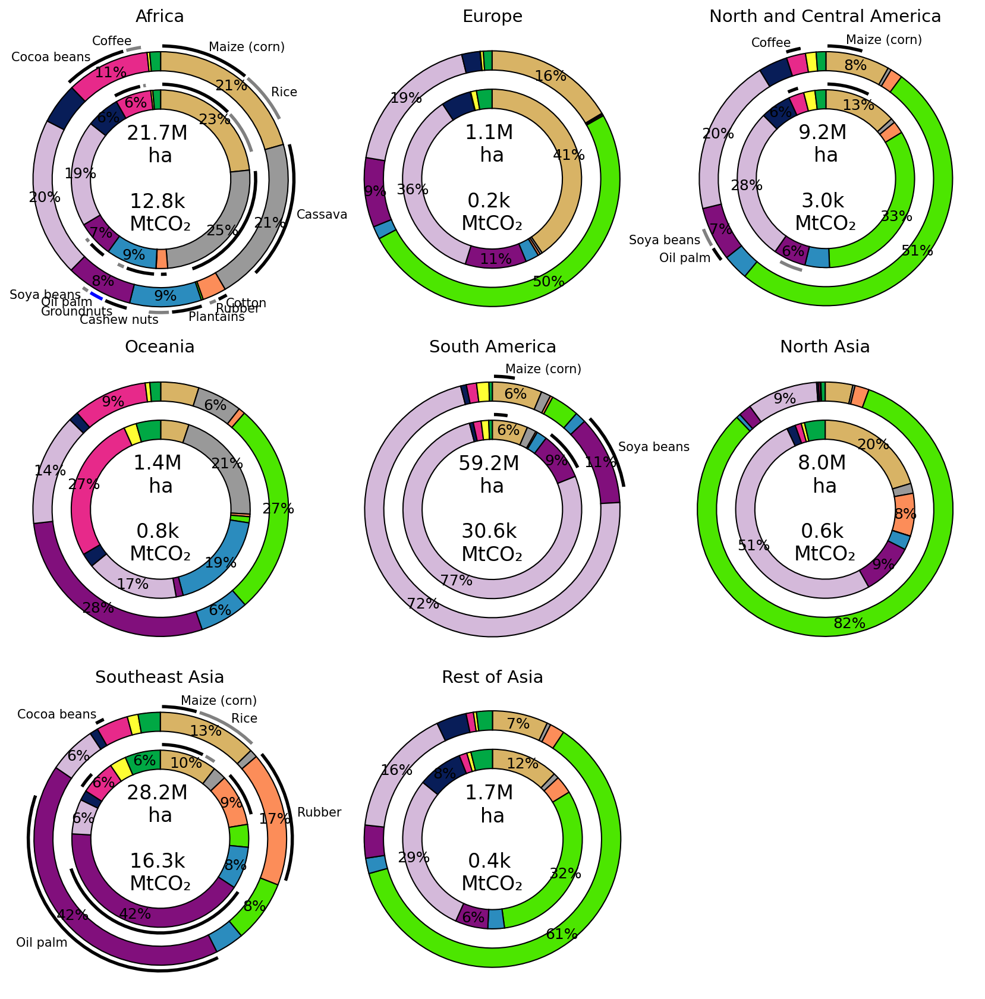

In [37]:
# Define the number of rows and columns for the subplots
nrows, ncols = 3, 3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 14), dpi=150,
                        gridspec_kw={'hspace': 0.10, 'wspace': 0.10})

for i, group in enumerate(['Africa', 'Europe', 'North and Central America', 'Oceania', 'South America', 'North Asia', 'Southeast Asia', 'Rest of Asia']):
    if i == 9:
        continue
    ax = axes[i // ncols, i % ncols]

    Selected_data = Singh_et_al.loc[Singh_et_al['Continent/Country group'] == group].groupby(['Commodity group', 'Commodity']).sum().reset_index()[[
        'Commodity group', 'Commodity', 'Deforestation attribution, unamortized (ha)','Deforestation emissions excl. peat drainage, unamortized (MtCO2)', 'Peatland drainage emissions (MtCO2)']]
    Selected_data['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] = Selected_data['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] +\
                                                                                    Selected_data['Peatland drainage emissions (MtCO2)']
    Selected_data.loc[Selected_data['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] < 0, 'Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] = 0

    Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Natural rubber in primary forms', 'Rubber', regex=True)
    Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('^Cassava, fresh', 'Cassava', regex=True)
    Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Coffee, green', 'Coffee', regex=True)
    Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Plantains and cooking bananas', 'Plantains', regex=True)
    Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Groundnuts, excluding shelled', 'Groundnuts', regex=True)
    Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Cashew nuts, in shell', 'Cashew nuts', regex=True)
    Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Oil palm fruit', 'Oil palm', regex=True)
    Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Seed cotton, unginned', 'Cotton', regex=True)
    
    Commodity_group = Selected_data.groupby(['Commodity group']).sum().reset_index()
    Commodity_group['Color'] = Commodity_group['Commodity group'].map(Commodity_group_color.set_index('Commodity group')['Color'])
    Commodity_group = Commodity_group.set_index('Commodity group').reindex(index=Commodity_group_color['Commodity group']).reset_index()

    if group == 'Africa':
        # Here's how you'd transform the 'Commodity' column:
        Commodities_to_keep = ['Cocoa beans', 'Coffee', 'Rubber', 'Oil palm', 'Soya beans', 'Cassava', 'Maize (corn)', 'Rice',
                               'Plantains', 'Cashew nuts', 'Groundnuts', 'Cotton']
        
        # Replace all other commodity names with 'Other commodities'
        Selected_data['Selected_Commodities'] = Selected_data['Commodity'].apply(lambda x: x if x in Commodities_to_keep else 'Other commodities')
        # Assign colors based on the 'Country' column
        Selected_data['Color'] = Selected_data['Selected_Commodities'].apply(lambda x: 'white' if x == 'Other commodities' else 'black')
    
        Selected_data.loc[Selected_data['Commodity'] == 'Coffee', 'Color'] = 'grey'
        Selected_data.loc[Selected_data['Commodity'] == 'Soya beans', 'Color'] = 'grey'
        Selected_data.loc[Selected_data['Commodity'] == 'Rice', 'Color'] = 'grey'
        Selected_data.loc[Selected_data['Commodity'] == 'Cashew nuts', 'Color'] = 'grey'
        Selected_data.loc[Selected_data['Commodity'] == 'Rubber', 'Color'] = 'grey'
        Selected_data.loc[Selected_data['Commodity'] == 'Oil palm', 'Color'] = 'blue'


    elif group == 'North and Central America':
        # Here's how you'd transform the 'Commodity' column:
        Commodities_to_keep = ['Coffee', 'Oil palm', 'Soya beans', 'Maize (corn)']
        
        # Replace all other commodity names with 'Other commodities'
        Selected_data['Selected_Commodities'] = Selected_data['Commodity'].apply(lambda x: x if x in Commodities_to_keep else 'Other commodities')
        # Assign colors based on the 'Country' column
        Selected_data['Color'] = Selected_data['Selected_Commodities'].apply(lambda x: 'white' if x == 'Other commodities' else 'black')
    
        Selected_data.loc[Selected_data['Commodity'] == 'Soya beans', 'Color'] = 'grey'
        Selected_data.loc[Selected_data['Commodity'] == 'Cashew nuts', 'Color'] = 'grey'
        Selected_data.loc[Selected_data['Commodity'] == 'Rubber', 'Color'] = 'grey'


    elif group == 'South America':
        # Here's how you'd transform the 'Commodity' column:
        Commodities_to_keep = ['Soya beans', 'Maize (corn)']
        
        # Replace all other commodity names with 'Other commodities'
        Selected_data['Selected_Commodities'] = Selected_data['Commodity'].apply(lambda x: x if x in Commodities_to_keep else 'Other commodities')
        # Assign colors based on the 'Country' column
        Selected_data['Color'] = Selected_data['Selected_Commodities'].apply(lambda x: 'white' if x == 'Other commodities' else 'black')
    

    elif group == 'Southeast Asia':
        # Here's how you'd transform the 'Commodity' column:
        Commodities_to_keep = ['Cocoa beans', 'Rubber', 'Oil palm', 'Maize (corn)', 'Rice']
        
        # Replace all other commodity names with 'Other commodities'
        Selected_data['Selected_Commodities'] = Selected_data['Commodity'].apply(lambda x: x if x in Commodities_to_keep else 'Other commodities')
        # Assign colors based on the 'Country' column
        Selected_data['Color'] = Selected_data['Selected_Commodities'].apply(lambda x: 'white' if x == 'Other commodities' else 'black')
    
        Selected_data.loc[Selected_data['Commodity'] == 'Rice', 'Color'] = 'grey'
        

    else:
        # Here's how you'd transform the 'Commodity' column:
        Commodities_to_keep = ['No']
        
        # Replace all other commodity names with 'Other commodities'
        Selected_data['Selected_Commodities'] = Selected_data['Commodity'].apply(lambda x: x if x in Commodities_to_keep else 'Other commodities')
        # Assign colors based on the 'Country' column
        Selected_data['Color'] = Selected_data['Selected_Commodities'].apply(lambda x: 'white' if x == 'Other commodities' else 'white')
    

    
    # Create an ordered CategoricalDtype based on the order in df2
    commodity_order = pd.CategoricalDtype(Commodity_group_color['Commodity group'], ordered=True)
    # Convert 'Continent/Country group' in df1 to this categorical type
    Selected_data['Commodity group'] = pd.Categorical(Selected_data['Commodity group'], categories=commodity_order.categories, ordered=True)
    # Now you can sort df1 by 'Continent/Country group'
    # Creating a color order, with 'black' before 'white'
    color_order = pd.CategoricalDtype(['black', 'blue', 'grey', 'white'], ordered=True)
    
    # Assigning the color order to the 'Color' column in df1
    Selected_data['Color'] = pd.Categorical(Selected_data['Color'], categories=color_order.categories, ordered=True)
    
    # Sorting df1 by 'Continent/Country group' first, then by 'Color'
    Selected_data = Selected_data.sort_values(by=['Commodity group', 'Color'])
    
    ## Plotting pie charts
    
    colors = Commodity_group['Color'].values

    v1 = Commodity_group['Deforestation attribution, unamortized (ha)'].values
    labels1 = Commodity_group['Commodity group'].values
    v2 = Commodity_group['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'].values
    labels2 = Commodity_group['Commodity group'].values
    
    width = 0.15
    wedge_properties_1 = {"width": width, "edgecolor": "black", 'linewidth': 1, 'antialiased': True}
    wedge_properties_2 = {"width": width, "edgecolor": "black", 'linewidth': 1, 'antialiased': True}
    
    
    patches, _, autotexts = ax.pie(v1, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.92,
                            wedgeprops=wedge_properties_1, startangle=90, counterclock = False)
    for autotext in autotexts:
        autotext.set(size=12)
        if float(autotext.get_text().replace('%', '')) < 6:  # Hide labels for values <= 1%
            autotext.set_text('')
    
    _, _, autotexts = ax.pie(v2, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.90,
                            radius=0.85-width, wedgeprops=wedge_properties_2, startangle=90, counterclock = False)
    for autotext in autotexts:
        autotext.set(size=12)
        if float(autotext.get_text().replace('%', '')) < 6:  # Hide labels for values <= 1%
            autotext.set_text('')
    
    # Example data for Country_group.sum()
    total_deforestation = Selected_data.sum()[['Deforestation attribution, unamortized (ha)']].values[0]
    total_emissions = Selected_data.sum()[['Deforestation emissions excl. peat drainage, unamortized (MtCO2)']].values[0]
    # Convert to more readable numbers, M for million, k for thousand
    readable_deforestation = total_deforestation / 1e6  # Convert to millions
    readable_emissions = total_emissions / 1e3  # Convert to thousands
    
    ax.text(0, 0, f"{readable_deforestation:.1f}M \nha\n\n{readable_emissions:.1f}k \nMtCO₂", ha='center', va='center', fontsize = 16)
    ax.set_title(group, fontsize = 14)
    
    ################################
    #if group not in ['Europe', 'Oceania', 'North Asia', 'Rest of Asia']:
    colors = Selected_data['Color'].values
        
    v1 = Selected_data['Deforestation attribution, unamortized (ha)'].values
    labels1 = Selected_data['Selected_Commodities'].values
    labels1= [label if label != 'Other commodities' else '' for label in labels1]
        
    v2 = Selected_data['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'].values
    labels2 = Selected_data['Selected_Commodities'].values
        
    width = 0.05
    wedge_properties_1 = {"width": width, "edgecolor": "white", 'linewidth': 2.5, 'antialiased': True}
    wedge_properties_2 = {"width": width, "edgecolor": "white", 'linewidth': 2.5, 'antialiased': True}
        
    _, _, autotexts = ax.pie(v1, colors=colors, labeldistance=1.03, autopct='%1.0f%%', pctdistance = 0.92,
                                radius = 1.12-width, wedgeprops=wedge_properties_1, startangle=90, counterclock = False, labels=labels1)
    for autotext in autotexts:
        autotext.set(size=0)
        if float(autotext.get_text().replace('%', '')) >= 0:  # Hide labels for values <= 1%
            autotext.set_text('')
        
    _, _, autotexts = ax.pie(v2, colors=colors, labeldistance=0.95, autopct='%1.0f%%', pctdistance = 0.90,
                                radius=0.82-width, wedgeprops=wedge_properties_2, startangle=90, counterclock = False)
    for autotext in autotexts:
        autotext.set(size=-0)
        if float(autotext.get_text().replace('%', '')) >= 0:  # Hide labels for values <= 1%
            autotext.set_text('')

    
    ax.axis('equal')

[fig.delaxes(ax) for ax in axes.flatten() if not ax.has_data()]

plt.tight_layout()
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Supplementary_Figure_2.svg')

In [36]:
Singh_et_al_grouped = Singh_et_al.groupby(['Continent/Country group', 'Commodity group','Year']).sum().reset_index()[['Continent/Country group','Commodity group', 'Year',
                                                                                         'Deforestation attribution, unamortized (ha)', 
                                                                                         'Deforestation emissions excl. peat drainage, unamortized (MtCO2)']]

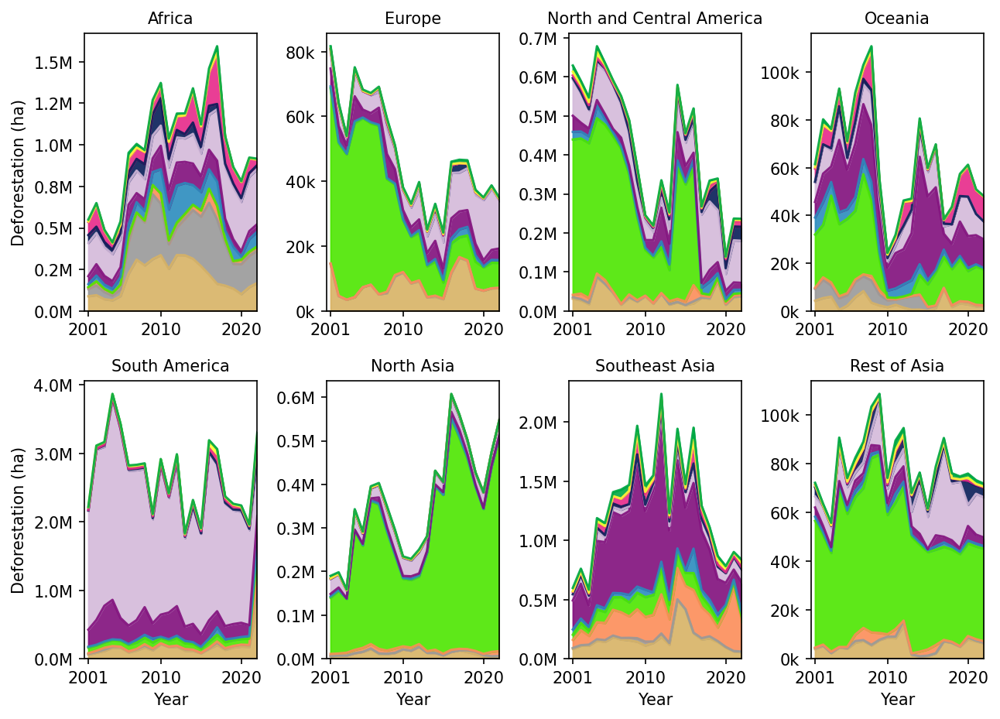

In [37]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Assuming 'Singh_et_al' is a DataFrame containing the necessary data,
# and 'Commodity_group' is a DataFrame containing color mappings for each commodity group.
# This code will not run as is, because these DataFrames are not defined in this environment.
# This is a template for you to use with your actual data.

# Define the subplots
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(10, 7), dpi=150,
                        gridspec_kw={'hspace': 0.25, 'wspace': 0.4})
axes = axes.flatten()  # Flatten the array for easy iteration

for index, Country in enumerate(['Africa', 'Europe', 'North and Central America', 'Oceania', 
                                 'South America', 'North Asia', 'Southeast Asia', 'Rest of Asia']):
    # Filter and group the data for the current country
    country_data = Singh_et_al.groupby(['Continent/Country group', 'Commodity group', 'Year']).sum().reset_index()
    country_data = country_data[country_data['Continent/Country group'] == Country]
    country_data = country_data.groupby(['Commodity group', 'Year']).sum().reset_index()

    column = 'Deforestation attribution, unamortized (ha)'
    # Pivot the data for positive and negative emissions separately
    pivot_df_positive = country_data[country_data[column] >= 0].pivot(
        index='Year', columns='Commodity group', values=column)
    pivot_df_negative = country_data[country_data[column] < 0].pivot(
        index='Year', columns='Commodity group', values=column)

    
    # Plot the negative and positive values    
    if not pivot_df_negative.empty:
        pivot_df_negative.plot(kind='area', stacked=True, ax=axes[index], color=Commodity_group['Color'], alpha=0.1)
    pivot_df_positive.plot(kind='area', stacked=True, ax=axes[index], color=Commodity_group['Color'], alpha = 0.9)
    #pivot_df_positive.plot(stacked=True, ax=axes[index], color=Commodity_group['Color'], lw = 0.5)

    # Calculate and plot the net emissions line
    net_emissions = country_data.groupby('Year')[column].sum()
    #net_emissions.plot(ax=axes[index], color='black', linestyle='-', linewidth=2)
    
    # Set titles and labels
    axes[index].set_title(Country, fontsize = 10)
    
    # Set the y-axis formatter to display values in millions
    if Country in ['Africa', 'North and Central America',
                   'South America', 'North Asia', 'Southeast Asia']:
        axes[index].yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x/1e6:.1f}M'))
    else:
        axes[index].yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x/1e3:.0f}k'))
    
    # Draw a horizontal line at y=0
    axes[index].axhline(y=0, color='black', linewidth=1)
    axes[index].set_xlim(2000.5,2022)
    axes[index].set_xticks([2001, 2010, 2020])
    # Set the grid
    axes[index].get_legend().remove()
    
# Loop through all axes to set labels only on edge subplots
for i, ax in enumerate(axes):
    # Remove x-axis labels for all but the bottom row subplots
    if i < len(axes) - 4:
        ax.set_xlabel('')
    else:
        ax.set_xlabel('Year')
        
    # Remove y-axis labels for all but the leftmost subplots
    if i % 4 != 0:
        ax.set_ylabel('')
    else:
        ax.set_ylabel('Deforestation (ha)')
        
# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Supplementary_Figure_4a.svg')

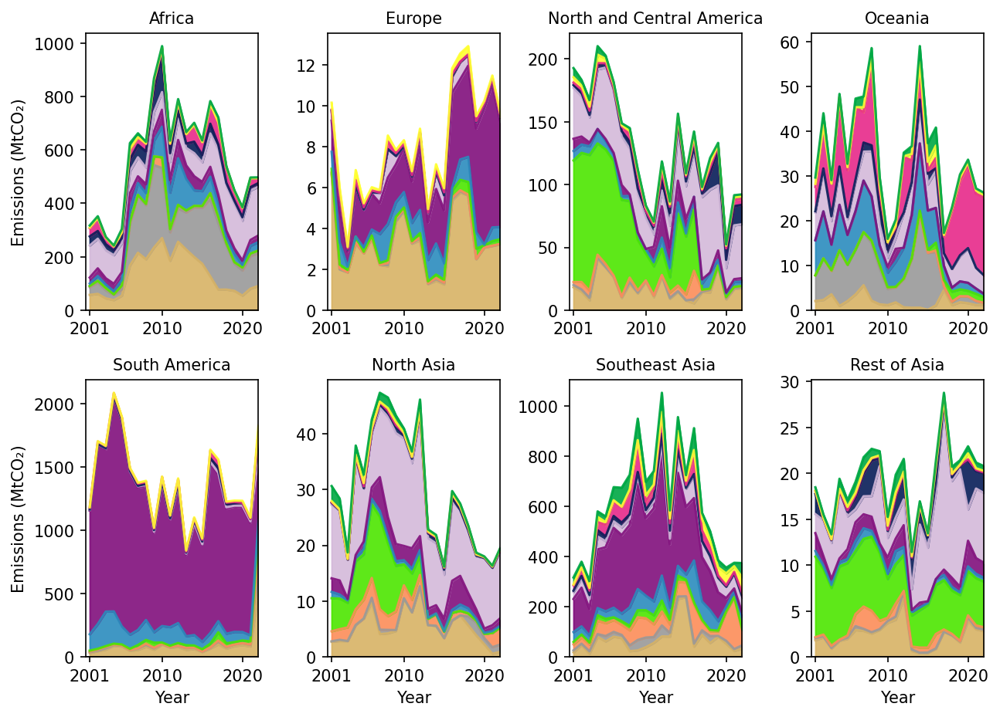

In [38]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Assuming 'Singh_et_al' is a DataFrame containing the necessary data,
# and 'Commodity_group' is a DataFrame containing color mappings for each commodity group.
# This code will not run as is, because these DataFrames are not defined in this environment.
# This is a template for you to use with your actual data.

# Define the subplots
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(10, 7), dpi=150,
                        gridspec_kw={'hspace': 0.25, 'wspace': 0.4})
axes = axes.flatten()  # Flatten the array for easy iteration

for index, Country in enumerate(['Africa', 'Europe', 'North and Central America', 'Oceania', 
                                 'South America', 'North Asia', 'Southeast Asia', 'Rest of Asia']):
    # Filter and group the data for the current country
    country_data = Singh_et_al.groupby(['Continent/Country group', 'Commodity group', 'Year']).sum().reset_index()
    country_data = country_data[country_data['Continent/Country group'] == Country]
    country_data = country_data.groupby(['Commodity group', 'Year']).sum().reset_index()

    column = 'Deforestation emissions excl. peat drainage, unamortized (MtCO2)'
    # Pivot the data for positive and negative emissions separately
    pivot_df_positive = country_data[country_data[column] >= 0].pivot(
        index='Year', columns='Commodity group', values=column)
    pivot_df_negative = country_data[country_data[column] < 0].pivot(
        index='Year', columns='Commodity group', values=column)

    
    # Plot the negative and positive value
    #if not pivot_df_negative.empty:
    #    pivot_df_negative.plot(kind='area', stacked=True, ax=axes[index], color=Commodity_group['Color'], alpha=0.1)
    pivot_df_positive.plot(kind='area', stacked=True, ax=axes[index], color=Commodity_group['Color'], alpha = 0.9)
    #pivot_df_positive.plot(stacked=True, ax=axes[index], color=Commodity_group['Color'], lw = 0.5)

    # Calculate and plot the net emissions line
    net_emissions = country_data.groupby('Year')[column].sum()
    #net_emissions.plot(ax=axes[index], color='black', linestyle='-', linewidth=2)
    
    # Set titles and labels
    axes[index].set_title(Country, fontsize = 10)
    
    # Set the y-axis formatter to display values in millions
    #axes[index].yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x/1e0:.0f}'))
    
    # Draw a horizontal line at y=0
    axes[index].axhline(y=0, color='black', linewidth=1)
    axes[index].set_xlim(2000.5,2022)
    axes[index].set_xticks([2001, 2010, 2020])
    # Set the grid
    axes[index].get_legend().remove()

# Loop through all axes to set labels only on edge subplots
for i, ax in enumerate(axes):
    # Remove x-axis labels for all but the bottom row subplots
    if i < len(axes) - 4:
        ax.set_xlabel('')
    else:
        ax.set_xlabel('Year')
        
    # Remove y-axis labels for all but the leftmost subplots
    if i % 4 != 0:
        ax.set_ylabel('')
    else:
        ax.set_ylabel('Emissions (MtCO₂)')
        
# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Supplementary_Figure_4b.svg')

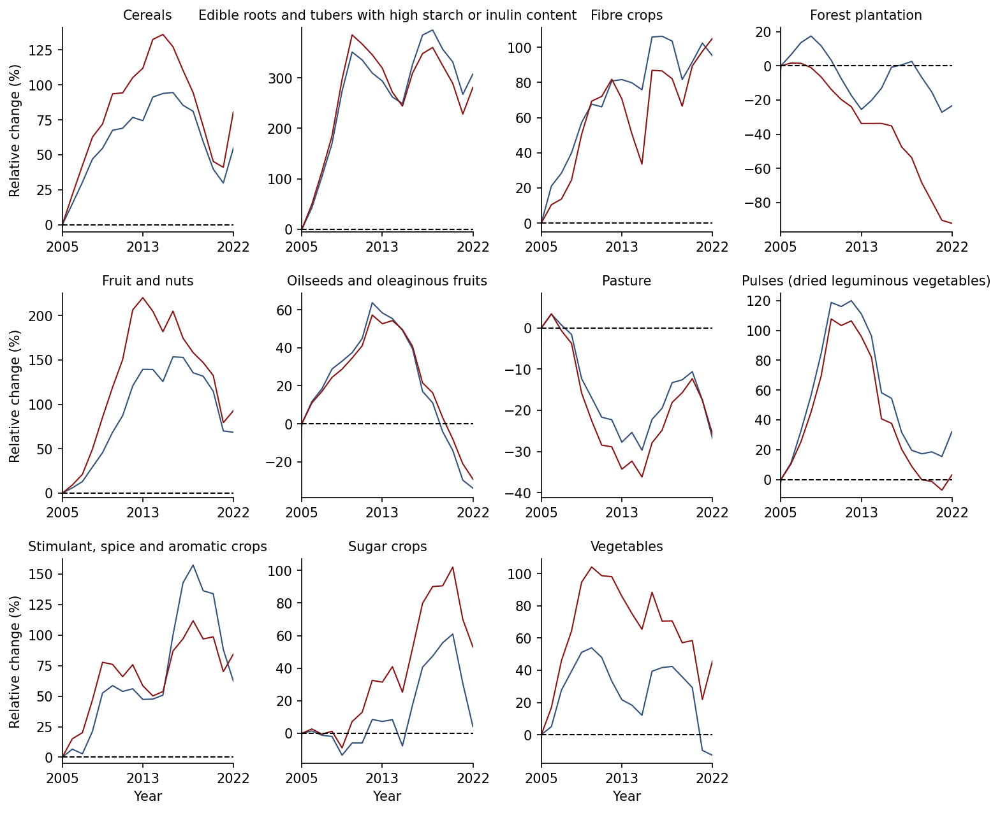

In [39]:
# Define the subplots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(12, 10), dpi=150,
                            gridspec_kw={'hspace': 0.3, 'wspace': 0.4})
axes = axes.flatten()  # Flatten the array for easy iteration

for index, Commodity in enumerate(Commodity_group['Commodity group'].values):
    Selected_data = Singh_et_al.loc[(Singh_et_al['Commodity group'] == Commodity)].groupby(['Commodity group','Year']).sum().reset_index()[[
                                                                                             'Commodity group', 'Year',
                                                                                             'Deforestation attribution, unamortized (ha)', 
                                                                                             'Deforestation risk, amortized (ha)',              
                                                                                             'Deforestation emissions excl. peat drainage, unamortized (MtCO2)',
                                                                                             'Deforestation emissions incl. peat drainage, amortized (MtCO2)']]
    
    Selected_data['Relative deforestation change (%)'] = (Selected_data['Deforestation risk, amortized (ha)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation risk, amortized (ha)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 'Deforestation risk, amortized (ha)'].values[0]
    
    Selected_data['Relative emissions change (%)'] = (Selected_data['Deforestation emissions incl. peat drainage, amortized (MtCO2)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0]
    
    Selected_data.plot('Year', 'Relative deforestation change (%)', ax = axes[index], color = '#32527B', lw = 1)
    Selected_data.plot('Year', 'Relative emissions change (%)', ax = axes[index], color = '#871614', lw = 1)
    axes[index].set_title(Commodity, fontsize = 10)
    axes[index].axhline(0, color = 'black', lw = 1, ls = '--')
    axes[index].get_legend().remove()
    min_value = pd.concat([Selected_data[4:]['Relative deforestation change (%)'], Selected_data[4:]['Relative emissions change (%)']]).min()
    max_value = pd.concat([Selected_data[4:]['Relative deforestation change (%)'], Selected_data[4:]['Relative emissions change (%)']]).max()
    axes[index].set_ylim(min_value-5,max_value+5)
    axes[index].set_xlim(2005, 2022)
    axes[index].set_xticks([2005, 2013, 2022])
    axes[index].spines[['right', 'top']].set_visible(False)

[fig.delaxes(ax) for ax in axes.flatten() if not ax.has_data()]

# Loop through all axes to set labels only on edge subplots
for i, ax in enumerate(axes):
    # Remove x-axis labels for all but the bottom row subplots
    if i < len(axes) - 4:
        ax.set_xlabel('')
    else:
        ax.set_xlabel('Year')
        
    # Remove y-axis labels for all but the leftmost subplots
    if i % 4 != 0:
        ax.set_ylabel('')
    else:
        ax.set_ylabel('Relative change (%)')
        
# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

In [40]:
Singh_et_al.groupby(['Year']).sum().reset_index()[['Year','Deforestation risk, amortized (ha)',
                                                   'Deforestation emissions incl. peat drainage, amortized (MtCO2)']][4:-1]

,Year,"Deforestation risk, amortized (ha)","Deforestation emissions incl. peat drainage, amortized (MtCO2)"
4,2005,5.610825e+06,2744.109375
5,2006,6.012953e+06,2955.760195
6,2007,6.205614e+06,3026.525728
7,2008,6.460425e+06,3150.793347
8,2009,6.356557e+06,3137.301293
9,2010,6.378896e+06,3201.282234
10,2011,6.218054e+06,3130.990622
11,2012,6.357526e+06,3258.598106
12,2013,6.061674e+06,3116.841668
13,2014,6.176010e+06,3130.014051


['Maize (corn)' 'Rice' 'Sorghum']
['Cassava, fresh']
['Natural rubber in primary forms']
['Oil palm fruit' 'Soya beans' 'Groundnuts, excluding shelled'
 'Coconuts, in shell']
['Beans, dry']
['Cocoa beans' 'Coffee, green']
[]


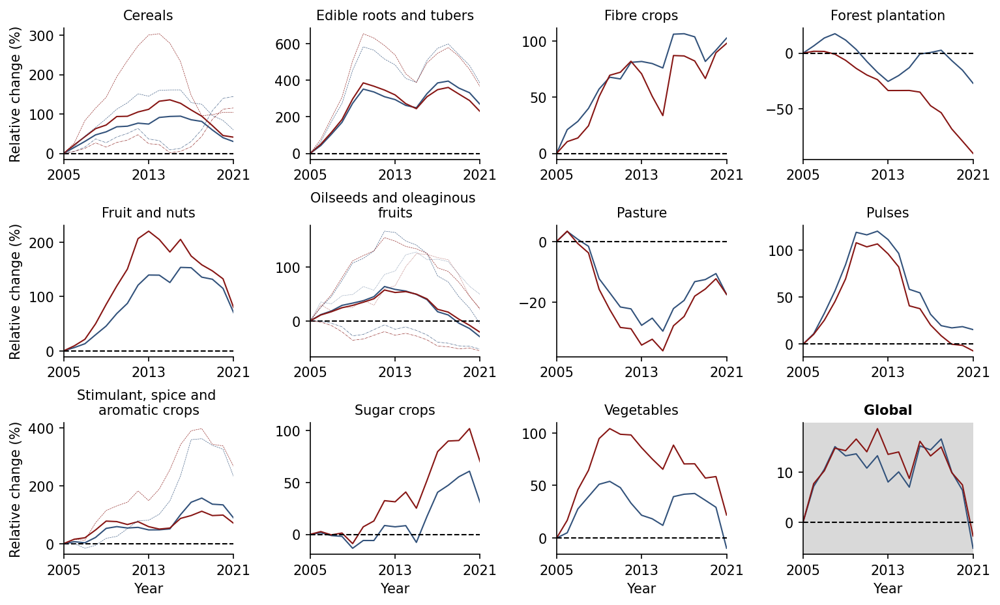

In [42]:
# Define the subplots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(12, 7), dpi=150,
                            gridspec_kw={'hspace': 0.5, 'wspace': 0.45})
axes = axes.flatten()  # Flatten the array for easy iteration

Selected_data = Singh_et_al.groupby(['Year']).sum().reset_index()[['Year','Deforestation risk, amortized (ha)',
                                                   'Deforestation emissions incl. peat drainage, amortized (MtCO2)']][4:-1]
Selected_data['Relative deforestation change (%)'] = (Selected_data['Deforestation risk, amortized (ha)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation risk, amortized (ha)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 'Deforestation risk, amortized (ha)'].values[0]
    
Selected_data['Relative emissions change (%)'] = (Selected_data['Deforestation emissions incl. peat drainage, amortized (MtCO2)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0]
Selected_data.plot('Year', 'Relative deforestation change (%)', ax = axes[-1], color ='#32527B', lw = 1)
Selected_data.plot('Year', 'Relative emissions change (%)', ax = axes[-1], color = '#871614', lw = 1)
axes[-1].set_xlim(2005, 2021)
axes[-1].set_xticks([2005, 2013, 2021])
axes[-1].spines[['right', 'top']].set_visible(False)
axes[-1].axhline(0, color = 'black', lw = 1, ls = '--')
axes[-1].set_title('Global', fontsize = 10, fontweight="bold")
axes[-1].patch.set_facecolor('#d9d9d9')


axes[-1].get_legend().remove()

for index, Commodity in enumerate(Commodity_group['Commodity group'].values):
    Selected_data = Singh_et_al.loc[(Singh_et_al['Commodity group'] == Commodity)].groupby(['Commodity group','Year']).sum().reset_index()[[
                                                                                             'Commodity group', 'Year',
                                                                                             'Deforestation risk, amortized (ha)',              
                                                                                             'Deforestation emissions incl. peat drainage, amortized (MtCO2)']][4:-1]
    
    Selected_data['Relative deforestation change (%)'] = (Selected_data['Deforestation risk, amortized (ha)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation risk, amortized (ha)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 'Deforestation risk, amortized (ha)'].values[0]
    
    Selected_data['Relative emissions change (%)'] = (Selected_data['Deforestation emissions incl. peat drainage, amortized (MtCO2)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0]

    #res_def = stats.spearmanr(Selected_data['Year'], Selected_data['Relative deforestation change (%)'])
    #res_emm = stats.spearmanr(Selected_data['Year'], Selected_data['Relative emissions change (%)'])
    #print(Commodity, res_def.pvalue, res_def.pvalue)
    
    Selected_data.plot('Year', 'Relative deforestation change (%)', ax = axes[index], color = '#32527B', lw = 1)
    Selected_data.plot('Year', 'Relative emissions change (%)', ax = axes[index], color = '#871614', lw = 1)
    axes[index].set_title(Commodity, fontsize = 10)
    axes[index].axhline(0, color = 'black', lw = 1, ls = '--')
    axes[index].get_legend().remove()
    min_value = pd.concat([Selected_data['Relative deforestation change (%)'], Selected_data[4:]['Relative emissions change (%)']]).min()
    max_value = pd.concat([Selected_data['Relative deforestation change (%)'], Selected_data[4:]['Relative emissions change (%)']]).max()
    
    if Commodity in ['Pasture', 'Fruit and nuts', 'Forest plantation', 'Sugar crops']:
        #axes[index].set_ylim(min_value-5,max_value+5)
        axes[index].set_xlim(2005, 2021)
        axes[index].set_xticks([2005, 2013, 2021])
        axes[index].spines[['right', 'top']].set_visible(False)
        continue
    else:
        Commodity_select_all = Singh_et_al.loc[(Singh_et_al['Commodity group'] == Commodity)].groupby(['Commodity']).sum().reset_index()[['Commodity', 'Deforestation risk, amortized (ha)']].sort_values(by = 'Deforestation risk, amortized (ha)', ascending=False)
        Commodity_select_all = Commodity_select_all.loc[Commodity_select_all['Deforestation risk, amortized (ha)'] > 6.5e5, 'Commodity'].values
        # Remove any commodity that has 'Other' in it
        Commodity_select_all = np.array([commodity for commodity in Commodity_select_all if 'Other' not in commodity])
        print(Commodity_select_all)
        for Commodity_select in Commodity_select_all:
            Selected_data = Singh_et_al.loc[(Singh_et_al['Commodity group'] == Commodity) & (Singh_et_al['Commodity'] == Commodity_select)].groupby(['Commodity group','Year']).sum().reset_index()[[
                                                                                                 'Commodity group', 'Year',
                                                                                                 'Deforestation risk, amortized (ha)',              
                                                                                                 'Deforestation emissions incl. peat drainage, amortized (MtCO2)']][4:-1]
        
            Selected_data['Relative deforestation change (%)'] = (Selected_data['Deforestation risk, amortized (ha)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                            'Deforestation risk, amortized (ha)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 'Deforestation risk, amortized (ha)'].values[0]
            
            Selected_data['Relative emissions change (%)'] = (Selected_data['Deforestation emissions incl. peat drainage, amortized (MtCO2)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                            'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                            'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0]
            
            if Commodity_select in ['Rice','Cassava, fresh','Oil palm fruit','Coffee, green']:
                ls = '--'; lw = 0.3
            elif Commodity_select in ['Sorghum','Soya beans']:
                ls = '-.'; lw = 0.3
            elif Commodity_select in ['Groundnuts, excluding shelled']:
                ls = ':'; lw = 0.3
            else:
                continue
            
            Selected_data.plot('Year', 'Relative deforestation change (%)', ax = axes[index], color = '#32527B', lw = lw, ls = ls)
            Selected_data.plot('Year', 'Relative emissions change (%)', ax = axes[index], color = '#871614', lw = lw, ls = ls)
            axes[index].get_legend().remove()

            #if Commodity_select == 'Groundnuts, excluding shelled':
            #    print(Selected_data)
    
    #axes[index].set_ylim(min_value-5,max_value+5)
    axes[index].set_xlim(2005, 2021)
    axes[index].set_xticks([2005, 2013, 2021])
    axes[index].spines[['right', 'top']].set_visible(False)

[fig.delaxes(ax) for ax in axes.flatten() if not ax.has_data()]

# Loop through all axes to set labels only on edge subplots
for i, ax in enumerate(axes):
    # Remove x-axis labels for all but the bottom row subplots
    if i < len(axes) - 4:
        ax.set_xlabel('')
    else:
        ax.set_xlabel('Year')
        
    # Remove y-axis labels for all but the leftmost subplots
    if i % 4 != 0:
        ax.set_ylabel('')
    else:
        ax.set_ylabel('Relative change (%)')
        
axes[1].set_title('Edible roots and tubers', fontsize = 10)
axes[5].set_title('Oilseeds and oleaginous \nfruits', fontsize = 10)
axes[7].set_title('Pulses', fontsize = 10)
axes[8].set_title('Stimulant, spice and \naromatic crops', fontsize = 10)


# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure_4b.svg')

In [43]:
from scipy import stats
res_def = stats.spearmanr(Selected_data['Year'], Selected_data['Relative deforestation change (%)'])
res_emm = stats.spearmanr(Selected_data['Year'], Selected_data['Relative emissions change (%)'])

print(res_def.pvalue, res_def.pvalue)

0.992551188788469 0.992551188788469


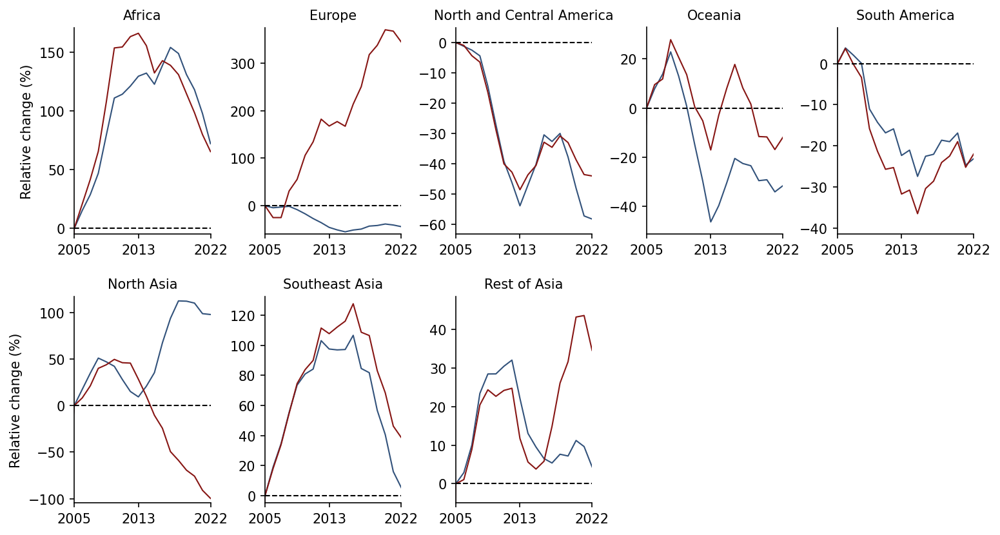

In [44]:
# Define the subplots
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 10), dpi=150,
                            gridspec_kw={'hspace': 0.3, 'wspace': 0.4})
axes = axes.flatten()  # Flatten the array for easy iteration

for index, Continent in enumerate(Country_group['Continent/Country group'].values):
    Selected_data = Singh_et_al.loc[(Singh_et_al['Continent/Country group'] == Continent)].groupby(['Continent/Country group','Year']).sum().reset_index()[[
                                                                                             'Continent/Country group', 'Year',
                                                                                             'Deforestation attribution, unamortized (ha)', 
                                                                                             'Deforestation risk, amortized (ha)',              
                                                                                             'Deforestation emissions excl. peat drainage, unamortized (MtCO2)',
                                                                                             'Deforestation emissions incl. peat drainage, amortized (MtCO2)']]
    
    Selected_data['Relative deforestation change (%)'] = (Selected_data['Deforestation risk, amortized (ha)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation risk, amortized (ha)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 'Deforestation risk, amortized (ha)'].values[0]
    
    Selected_data['Relative emissions change (%)'] = (Selected_data['Deforestation emissions incl. peat drainage, amortized (MtCO2)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0]
    
    Selected_data.plot('Year', 'Relative deforestation change (%)', ax = axes[index], color = '#32527B', lw = 1)
    Selected_data.plot('Year', 'Relative emissions change (%)', ax = axes[index], color = '#871614', lw = 1)
    axes[index].set_title(Continent, fontsize = 10)
    axes[index].axhline(0, color = 'black', lw = 1, ls = '--')
    axes[index].get_legend().remove()
    min_value = pd.concat([Selected_data[4:]['Relative deforestation change (%)'], Selected_data[4:]['Relative emissions change (%)']]).min()
    max_value = pd.concat([Selected_data[4:]['Relative deforestation change (%)'], Selected_data[4:]['Relative emissions change (%)']]).max()
    axes[index].set_ylim(min_value-5,max_value+5)
    axes[index].set_xlim(2005, 2022)
    axes[index].set_xticks([2005, 2013, 2022])
    axes[index].spines[['right', 'top']].set_visible(False)

[fig.delaxes(ax) for ax in axes.flatten() if not ax.has_data()]

# Loop through all axes to set labels only on edge subplots
for i, ax in enumerate(axes):
    # Remove x-axis labels for all but the bottom row subplots
    if i < len(axes) - 5:
        ax.set_xlabel('')
    else:
        ax.set_xlabel('Year')
        
    # Remove y-axis labels for all but the leftmost subplots
    if i % 5 != 0:
        ax.set_ylabel('')
    else:
        ax.set_ylabel('Relative change (%)')
        
# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

['Democratic Republic of the Congo' "Côte d'Ivoire" 'Ghana' 'Nigeria'
 'Angola' 'Tanzania' 'Mozambique']
[]
['United States' 'México']
['Papua New Guinea']
['Brazil' 'Paraguay' 'Argentina' 'Bolivia' 'Colombia' 'Peru' 'Chile'
 'Venezuela']
['China']
['Indonesia' 'Malaysia' 'Vietnam' 'Myanmar' 'Thailand' 'Cambodia'
 'Philippines']
['India']


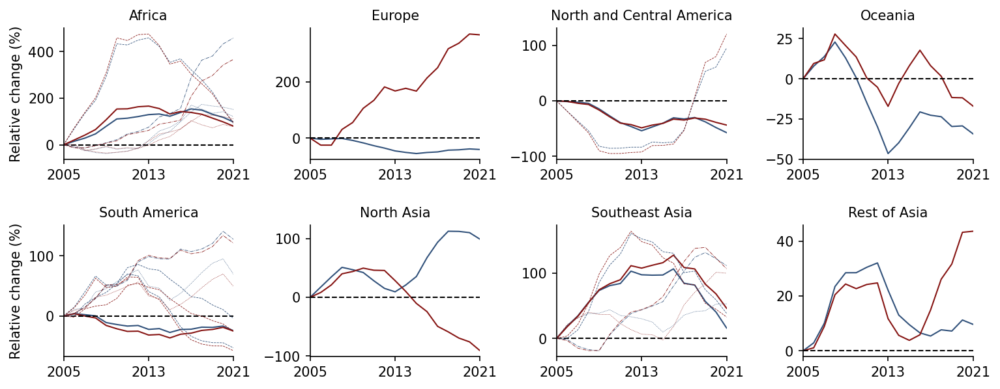

In [45]:
%matplotlib inline

# Define the subplots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(12, 7), dpi=150,
                            gridspec_kw={'hspace': 0.5, 'wspace': 0.45})
axes = axes.flatten()  # Flatten the array for easy iteration


for index, Continent in enumerate(Country_group['Continent/Country group'].values):
    Selected_data = Singh_et_al.loc[(Singh_et_al['Continent/Country group'] == Continent)].groupby(['Continent/Country group','Year']).sum().reset_index()[[
                                                                                             'Continent/Country group', 'Year',
                                                                                             'Deforestation risk, amortized (ha)',              
                                                                                             'Deforestation emissions incl. peat drainage, amortized (MtCO2)']][4:-1]
    
    Selected_data['Relative deforestation change (%)'] = (Selected_data['Deforestation risk, amortized (ha)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation risk, amortized (ha)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 'Deforestation risk, amortized (ha)'].values[0]
    
    Selected_data['Relative emissions change (%)'] = (Selected_data['Deforestation emissions incl. peat drainage, amortized (MtCO2)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                    'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0]
    
    Selected_data.plot('Year', 'Relative deforestation change (%)', ax = axes[index], color = '#32527B', lw = 1)
    Selected_data.plot('Year', 'Relative emissions change (%)', ax = axes[index], color = '#871614', lw = 1)
    axes[index].set_title(Continent, fontsize = 10)
    axes[index].axhline(0, color = 'black', lw = 1, ls = '--')
    axes[index].get_legend().remove()
    min_value = pd.concat([Selected_data['Relative deforestation change (%)'], Selected_data[4:]['Relative emissions change (%)']]).min()
    max_value = pd.concat([Selected_data['Relative deforestation change (%)'], Selected_data[4:]['Relative emissions change (%)']]).max()

    Country_select_all = Singh_et_al.loc[(Singh_et_al['Continent/Country group'] == Continent)].groupby(['Producer country']).sum().reset_index()[['Producer country', 'Deforestation risk, amortized (ha)']].sort_values(by = 'Deforestation risk, amortized (ha)', ascending=False)
    Country_select_all = Country_select_all.loc[Country_select_all['Deforestation risk, amortized (ha)'] > 6.5e5, 'Producer country'].values
    # Remove any commodity that has 'Other' in it
    Country_select_all = np.array([commodity for commodity in Country_select_all if 'Other' not in commodity])
    print(Country_select_all)

    for Country_select in Country_select_all:
        Selected_data = Singh_et_al.loc[(Singh_et_al['Continent/Country group'] == Continent) & (Singh_et_al['Producer country'] == Country_select)].groupby(['Continent/Country group','Year']).sum().reset_index()[[
                                                                                             'Continent/Country group', 'Year',
                                                                                             'Deforestation risk, amortized (ha)',              
                                                                                             'Deforestation emissions incl. peat drainage, amortized (MtCO2)']][4:-1]
    
        Selected_data['Relative deforestation change (%)'] = (Selected_data['Deforestation risk, amortized (ha)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                        'Deforestation risk, amortized (ha)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 'Deforestation risk, amortized (ha)'].values[0]
        
        Selected_data['Relative emissions change (%)'] = (Selected_data['Deforestation emissions incl. peat drainage, amortized (MtCO2)']-Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                        'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0])*100/Selected_data.loc[Selected_data['Year'] == 2005, 
                                                                        'Deforestation emissions incl. peat drainage, amortized (MtCO2)'].values[0]
        
        if Country_select in ['Democratic Republic of the Congo', 'México', 'Paraguay', 'Argentina', 'Malaysia']:
            ls = '--'; lw = 0.4
        elif Country_select in ['Nigeria', 'Peru', 'Cambodia']:
            ls = '-.'; lw = 0.4
        elif Country_select in ['Côte d\'Ivoire', 'Ghana', 'Bolivia', 'Thailand']:
            ls = ':'; lw = 0.4
        else:
            continue
        Selected_data.plot('Year', 'Relative deforestation change (%)', ax = axes[index], color = '#32527B', lw = lw, ls = ls)
        Selected_data.plot('Year', 'Relative emissions change (%)', ax = axes[index], color = '#871614', lw = lw, ls = ls)
        
        axes[index].get_legend().remove()
        
    #axes[index].set_ylim(min_value-5,max_value+5)
    axes[index].set_xlim(2005, 2020)
    axes[index].set_xticks([2005, 2013, 2021])
    axes[index].spines[['right', 'top']].set_visible(False)

[fig.delaxes(ax) for ax in axes.flatten() if not ax.has_data()]

# Loop through all axes to set labels only on edge subplots
for i, ax in enumerate(axes):
    # Remove x-axis labels for all but the bottom row subplots
    if i < len(axes) - 4:
        ax.set_xlabel('')
    else:
        ax.set_xlabel('Year')
        
    # Remove y-axis labels for all but the leftmost subplots
    if i % 4 != 0:
        ax.set_ylabel('')
    else:
        ax.set_ylabel('Relative change (%)')
        
# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure_4a.svg')

In [46]:
Singh_et_al = pd.read_excel(f'{home_folder}{Simulation_version}/Generated_results/DeDuCE_Deforestation_attribution_v{Dataset_version}.{GEE_data_version}.{Python_script_version} {Year}.xlsx', sheet_name = 'Deforestation attribution')
Singh_et_al['Total Emissions (MtCO2)'] = Singh_et_al['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] + Singh_et_al['Peatland drainage emissions (MtCO2)']


Producer country                               BrazilIndonesiaDR CongoChinaUnited StatesParag...
Deforestation attribution, unamortized (ha)                                     130474831.616115
Total Emissions (MtCO2)                                                             64352.288591
Continent/Country group                        South AmericaSoutheast AsiaAfricaNorth AsiaNor...
Color                                          #CA93DA#B7B7B7#DD7271#64D0E2#CDDC21#CA93DA#CA9...
dtype: object


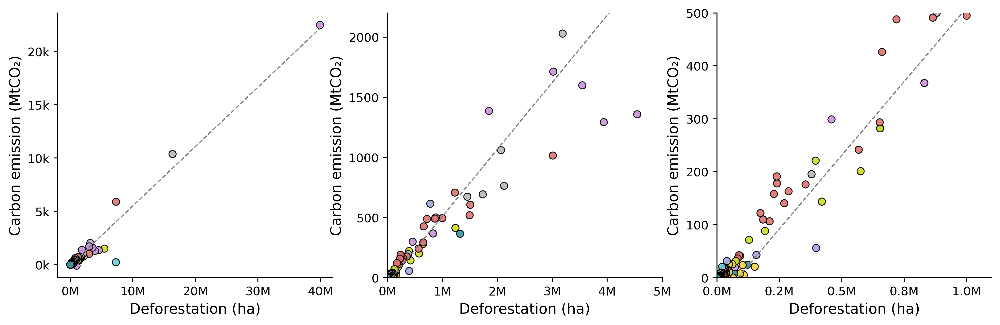

In [47]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import ScalarFormatter
from matplotlib.ticker import FormatStrFormatter

# Plotting the top commodities
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 4), dpi=350)
kwargs = {'alpha':0.9, 'linestyle':'-', 'linewidth':0.75, 'edgecolor':'k'}

# Define the formatting function
def thousand_formatter(x, pos):
    return '{:.0f}k'.format(x / 1000)
axes[0].yaxis.set_major_formatter(ticker.FuncFormatter(thousand_formatter))

def million_formatter(x, pos):
    return '{:.0f}M'.format(x / 10**6)
axes[0].xaxis.set_major_formatter(ticker.FuncFormatter(million_formatter))
axes[1].xaxis.set_major_formatter(ticker.FuncFormatter(million_formatter))

def million_formatter_ref(x, pos):
    return '{:.1f}M'.format(x / 10**6)
axes[2].xaxis.set_major_formatter(ticker.FuncFormatter(million_formatter_ref))


Selected_data = Singh_et_al.groupby(['Producer country']).sum().reset_index()[['Producer country', 'Deforestation attribution, unamortized (ha)', 'Total Emissions (MtCO2)']].sort_values(by = 'Deforestation attribution, unamortized (ha)', ascending = False)

Continent = pd.read_excel(home_folder+Simulation_version+'/Supplementary_data-DeDuCE v1.xlsx', 'Lookup-Country (GADM)')
Selected_data['Continent/Country group'] = Selected_data['Producer country'].map(Continent.set_index('COUNTRY')['COUNTRY GROUP'])
Selected_data['Color'] = Selected_data['Continent/Country group'].map(Country_group_color.set_index('Continent/Country group')['Color'])

Selected_data.loc[Selected_data['Producer country'] == 'Democratic Republic of the Congo', 'Producer country'] = 'DR Congo'
# Assuming 'EUDR_commodities' is a list of commodity names that need to be highlighted
Non_tropical_countries = ['United States', 'China', 'Argentina']  # replace with actual commodity names
print(Selected_data.sum())

# Top Commodities by Deforestation
palette = dict(zip(Selected_data['Producer country'], Selected_data['Color']))
sns.scatterplot(x='Deforestation attribution, unamortized (ha)', y='Total Emissions (MtCO2)', data=Selected_data, ax=axes[0], palette=palette, **kwargs, hue='Producer country')
sns.regplot(x='Deforestation attribution, unamortized (ha)', y='Total Emissions (MtCO2)', data=Selected_data, ax=axes[0], ci=None, scatter_kws={"s":0}, line_kws={"color": "grey", "lw": 1, 'ls': '--'})


# Top Commodities by Deforestation
sns.scatterplot(x='Deforestation attribution, unamortized (ha)', y='Total Emissions (MtCO2)', data=Selected_data, ax=axes[1], palette=palette, **kwargs, hue='Producer country')
sns.regplot(x='Deforestation attribution, unamortized (ha)', y='Total Emissions (MtCO2)', data=Selected_data, ax=axes[1], ci=None, scatter_kws={"s":0}, line_kws={"color": "grey", "lw": 1, 'ls': '--'})
axes[1].set_xlim(0,5000000)
axes[1].set_ylim(0,2200)

# Top Commodities by Deforestation
sns.scatterplot(x='Deforestation attribution, unamortized (ha)', y='Total Emissions (MtCO2)', data=Selected_data, ax=axes[2], palette=palette, **kwargs, hue='Producer country')
sns.regplot(x='Deforestation attribution, unamortized (ha)', y='Total Emissions (MtCO2)', data=Selected_data, ax=axes[2], ci=None, scatter_kws={"s":0}, line_kws={"color": "grey", "lw": 1, 'ls': '--'})
axes[2].set_xlim(0,1100000)
axes[2].set_ylim(0,500)


for i in range(3):
    axes[i].spines[['right', 'top']].set_visible(False)
    axes[i].set_xlabel('Deforestation (ha)', fontsize = 12)
    axes[i].set_ylabel('Carbon emission (MtCO₂)', fontsize = 12)
    axes[i].xaxis.set_major_locator(plt.MaxNLocator(5))
    axes[i].yaxis.set_major_locator(plt.MaxNLocator(5))
    axes[i].get_legend().remove()


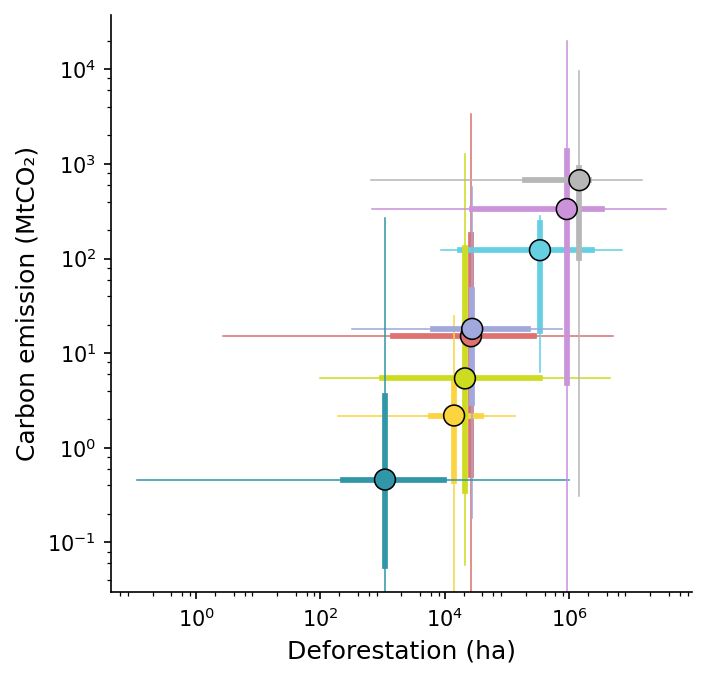

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'Selected_data' is your DataFrame
# Calculate the median, 5th and 95th percentiles for each group
grouped_data = Selected_data.groupby('Continent/Country group').agg(
    median_deforestation=('Deforestation attribution, unamortized (ha)', np.median),
    mean_deforestation = ('Deforestation attribution, unamortized (ha)', np.mean),
    deforestation_1st=('Deforestation attribution, unamortized (ha)', lambda x: np.percentile(x, 1)),
    deforestation_25th=('Deforestation attribution, unamortized (ha)', lambda x: np.percentile(x, 25)),
    deforestation_75th=('Deforestation attribution, unamortized (ha)', lambda x: np.percentile(x, 75)),
    deforestation_99th=('Deforestation attribution, unamortized (ha)', lambda x: np.percentile(x, 99)),
    median_emissions=('Total Emissions (MtCO2)', np.median),
    mean_emissions=('Total Emissions (MtCO2)', np.mean),
    emissions_1st=('Total Emissions (MtCO2)', lambda x: np.percentile(x, 1)),
    emissions_25th=('Total Emissions (MtCO2)', lambda x: np.percentile(x, 25)),
    emissions_75th=('Total Emissions (MtCO2)', lambda x: np.percentile(x, 75)),
    emissions_99th=('Total Emissions (MtCO2)', lambda x: np.percentile(x, 99)),
).reset_index()

grouped_data['Color'] = grouped_data['Continent/Country group'].map(Country_group_color.set_index('Continent/Country group')['Color'])

# Plotting
plt.figure(figsize=(5, 5), dpi=150)

# Add error bars for the 5th and 95th percentiles
kwargs = {'alpha':1, 'linestyle':'-', 'linewidth':0.75, 'edgecolor':'k'}
palette = dict(zip(Selected_data['Continent/Country group'], Selected_data['Color']))

sns.scatterplot(data=grouped_data,
                x='median_deforestation',
                y='median_emissions', s = 100, palette = palette, **kwargs, 
                hue = 'Continent/Country group')


for index, row in grouped_data.iterrows():
    plt.errorbar([row['deforestation_1st'], row['deforestation_99th']], [row['median_emissions'], row['median_emissions']], color=row['Color'], lw = 0.75, fmt='-',
                               capsize=5,  elinewidth=2, markeredgewidth=2, zorder = 0)
    plt.errorbar([row['deforestation_25th'], row['deforestation_75th']], [row['median_emissions'], row['median_emissions']], color=row['Color'], lw = 2.75, fmt='-',
                               capsize=5,  elinewidth=2, markeredgewidth=2, zorder = 0)
    plt.errorbar([row['median_deforestation'], row['median_deforestation']], [row['emissions_1st'], row['emissions_99th']], color=row['Color'], lw = 0.75, fmt='-',
                               capsize=5,  elinewidth=2, markeredgewidth=2, zorder = 0)
    plt.errorbar([row['median_deforestation'], row['median_deforestation']], [row['emissions_25th'], row['emissions_75th']], color=row['Color'], lw = 2.75, fmt='-',
                               capsize=5,  elinewidth=2, markeredgewidth=2, zorder = 0)


Selected_data_2 = Singh_et_al.groupby(['Producer country']).sum().reset_index()[['Producer country', 'Deforestation attribution, unamortized (ha)', 'Total Emissions (MtCO2)']].sort_values(by = 'Deforestation attribution, unamortized (ha)', ascending = False)[0:15]

plt.yscale('log')
plt.xscale('log')
#plt.xlim(0)
#plt.ylim(0)
import matplotlib.ticker as ticker
locmin = ticker.LogLocator(base=10.0,subs=(0.2,0.4,0.6,0.8),numticks=12)
plt.gca().xaxis.set_minor_locator(locmin)
plt.gca().xaxis.set_minor_formatter(ticker.NullFormatter())
locmin = ticker.LogLocator(base=10.0,subs=(0.2,0.4,0.6,0.8),numticks=12)
plt.gca().yaxis.set_minor_locator(locmin)
plt.gca().yaxis.set_minor_formatter(ticker.NullFormatter())

plt.gca().spines[['right', 'top']].set_visible(False)
plt.xlabel('Deforestation (ha)', fontsize = 12)
plt.ylabel('Carbon emission (MtCO₂)', fontsize = 12)
plt.legend().remove()

plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Supplementary_Figure_1_b.svg')

Continent/Country group                        South AmericaSoutheast AsiaAfricaNorth AsiaNor...
Producer country                               BrazilIndonesiaDR CongoChinaUnited StatesParag...
Deforestation attribution, unamortized (ha)                                     105325376.075457
Total Emissions (MtCO2)                                                             53382.896137
Color                                          #CA93DA#B7B7B7#DD7271#64D0E2#CDDC21#CA93DA#CA9...
dtype: object
Continent/Country group                        South AmericaSoutheast AsiaAfricaNorth AsiaNor...
Producer country                               BrazilIndonesiaDR CongoChinaUnited StatesParag...
Deforestation attribution, unamortized (ha)                                     105325376.075457
Total Emissions (MtCO2)                                                             53382.896137
Color                                          #CA93DA#B7B7B7#DD7271#64D0E2#CDDC21#CA93DA#CA9...
dtype: object


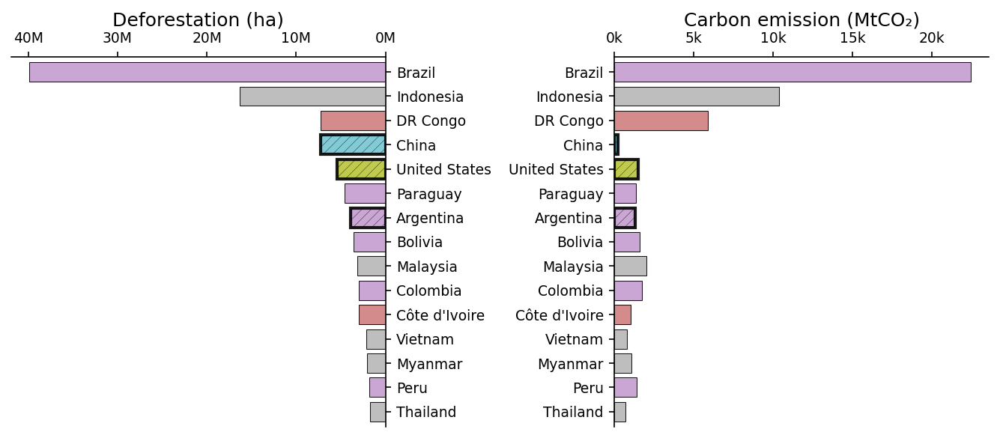

In [49]:

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Plotting the top commodities
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(9, 4), dpi=150)
kwargs = {'alpha':0.9, 'linestyle':'-', 'linewidth':0.5, 'edgecolor':'k'}

Selected_data = Singh_et_al.groupby(['Continent/Country group','Producer country']).sum().reset_index()[['Continent/Country group','Producer country', 'Deforestation attribution, unamortized (ha)', 'Total Emissions (MtCO2)']].sort_values(by = 'Deforestation attribution, unamortized (ha)', ascending = False)[0:15]
Selected_data['Color'] = Selected_data['Continent/Country group'].map(Country_group_color.set_index('Continent/Country group')['Color'])

Selected_data.loc[Selected_data['Producer country'] == 'Democratic Republic of the Congo', 'Producer country'] = 'DR Congo'
# Assuming 'EUDR_commodities' is a list of commodity names that need to be highlighted
Non_tropical_countries = ['United States', 'China', 'Argentina']  # replace with actual commodity names
print(Selected_data.sum())
# Create a color palette where EUDR commodities are highlighted in red, others in grey
hatches = {commodity: '#3690c0' if commodity in Non_tropical_countries else '#969696' 
           for commodity in Selected_data['Producer country']}
# Top Commodities by Deforestation
barplot = sns.barplot(x='Deforestation attribution, unamortized (ha)', y='Producer country', data=Selected_data, ax=axes[0], palette=Selected_data['Color'], **kwargs, width=0.8)
# Iterate through the bars and apply hatches to non-tropical countries
for bar, country in zip(barplot.patches, Selected_data['Producer country']):
    if country in Non_tropical_countries:
        bar.set_hatch('////')  # You can use other patterns like 'x', '+', '-', '|', etc.
        bar.set_linewidth(2)
        
axes[0].tick_params(axis = 'y', left = False, right = True, labelleft = False, labelright = True)
axes[0].invert_xaxis()

def million_formatter(x, pos):
    return '{:.0f}M'.format(x / 10**6)
axes[0].xaxis.set_major_formatter(ticker.FuncFormatter(million_formatter))
axes[0].xaxis.set_major_locator(plt.MaxNLocator(5))
axes[0].xaxis.label.set_position((0.5, 1.1))  # Shift x-label to the top
axes[0].set_ylabel('')
axes[0].spines[['left', 'bottom',]].set_visible(False)  # Hide the bottom spine
axes[0].xaxis.tick_top()  # Move the x-ticks to the top
axes[0].xaxis.set_tick_params(labeltop=True)  # Show the x-tick labels on top
#axes[0].set_xticklabels([])  # Hide all x-tick values
axes[0].xaxis.set_label_position('top')
axes[0].xaxis.tick_top()
axes[0].set_xlabel('Deforestation (ha)', fontsize = 12)
axes[0].margins(y=0.015)
axes[0].tick_params(axis='both', which='major', labelsize=9)


Selected_data = Singh_et_al.groupby(['Continent/Country group','Producer country']).sum().reset_index()[['Continent/Country group','Producer country', 'Deforestation attribution, unamortized (ha)', 'Total Emissions (MtCO2)']].sort_values(by = 'Deforestation attribution, unamortized (ha)', ascending = False)[0:15]
Selected_data['Color'] = Selected_data['Continent/Country group'].map(Country_group_color.set_index('Continent/Country group')['Color'])

Selected_data.loc[Selected_data['Producer country'] == 'Democratic Republic of the Congo', 'Producer country'] = 'DR Congo'
# Assuming 'EUDR_commodities' is a list of commodity names that need to be highlighted
Non_tropical_countries = ['United States', 'China', 'Argentina']  # replace with actual commodity names
print(Selected_data.sum())

# Create a color palette where EUDR commodities are highlighted in red, others in grey
palette = {commodity: '#3690c0' if commodity in Non_tropical_countries else '#969696' 
           for commodity in Selected_data['Producer country']}
# Top Commodities by Deforestation
barplot = sns.barplot(x='Total Emissions (MtCO2)', y='Producer country', data=Selected_data, ax=axes[1], palette=Selected_data['Color'], **kwargs)
# Iterate through the bars and apply hatches to non-tropical countries
for bar, country in zip(barplot.patches, Selected_data['Producer country']):
    if country in Non_tropical_countries:
        bar.set_hatch('////')  # You can use other patterns like 'x', '+', '-', '|', etc.
        bar.set_linewidth(2)

def million_formatter(x, pos):
    return '{:.0f}k'.format(x / 10**3)
axes[1].xaxis.set_major_formatter(ticker.FuncFormatter(million_formatter))
axes[1].xaxis.set_major_locator(plt.MaxNLocator(5))
axes[1].xaxis.label.set_position((0.5, 1.1))  # Shift x-label to the top
axes[1].set_ylabel('')
axes[1].spines[['right', 'bottom',]].set_visible(False)  # Hide the bottom spine
axes[1].xaxis.tick_top()  # Move the x-ticks to the top
axes[1].xaxis.set_tick_params(labeltop=True)  # Show the x-tick labels on top
#axes[1].set_xticklabels([])  # Hide all x-tick values
axes[1].xaxis.set_label_position('top')
axes[1].xaxis.tick_top()
axes[1].set_xlabel('Carbon emission (MtCO₂)', fontsize = 12)
axes[1].margins(y=0.015)
axes[1].tick_params(axis='both', which='major', labelsize=9)

# Show the plot
plt.tight_layout()
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Supplementary_Figure_1_a.svg')

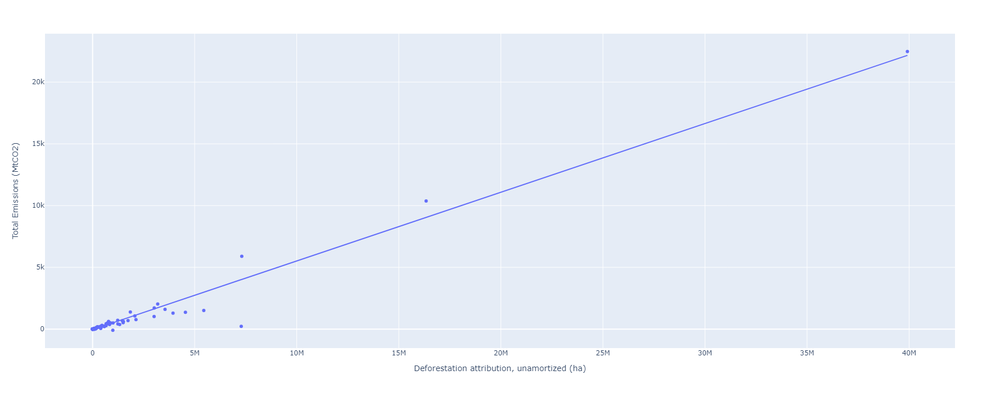

In [50]:
import plotly.express as px

# Group and sort data
Selected_data = Singh_et_al.groupby(['Producer country']).sum().reset_index()
Selected_data = Selected_data[['Producer country', 'Deforestation attribution, unamortized (ha)', 'Total Emissions (MtCO2)']]
Selected_data = Selected_data.sort_values(by='Deforestation attribution, unamortized (ha)', ascending=False)

# Map continent/country group and colors
Continent = pd.read_excel(home_folder+Simulation_version+'/Supplementary_data-DeDuCE v1.xlsx', 'Lookup-Country (GADM)')
Selected_data['Continent/Country group'] = Selected_data['Producer country'].map(Continent.set_index('COUNTRY')['COUNTRY GROUP'])
Selected_data['Color'] = Selected_data['Continent/Country group'].map(Country_group_color.set_index('Continent/Country group')['Color'])

# Rename Democratic Republic of the Congo
Selected_data.loc[Selected_data['Producer country'] == 'Democratic Republic of the Congo', 'Producer country'] = 'DR Congo'

# Create an interactive scatter plot
fig = px.scatter(Selected_data,
                 x='Deforestation attribution, unamortized (ha)',
                 y='Total Emissions (MtCO2)',
                 hover_data=['Producer country'],
                 #size='Deforestation attribution, unamortized (ha)',
                 color_continuous_scale=px.colors.sequential.Viridis,
                 trendline="ols")

# Show the plot
fig.update_layout(
    autosize=False,
    width=700,
    height=700,
)

fig.show()


In [51]:
Selected_data

,Producer country,"Deforestation attribution, unamortized (ha)",Total Emissions (MtCO2),Continent/Country group,Color
21,Brazil,3.991576e+07,22477.167800,South America,#CA93DA
71,Indonesia,1.633914e+07,10375.350347,Southeast Asia,#B7B7B7
42,DR Congo,7.307966e+06,5896.580533,Africa,#DD7271
33,China,7.281515e+06,224.301226,North Asia,#64D0E2
167,United States,5.446757e+06,1504.953651,North and Central America,#CDDC21
...,...,...,...,...,...
79,Jordan,3.269951e+00,0.000715,Rest of Asia,#3197A8
99,Micronesia,2.275969e+00,0.002459,Oceania,#A1A8DC
50,Eritrea,1.636769e+00,0.001441,Africa,#DD7271
173,Yemen,2.246056e-01,0.000083,Rest of Asia,#3197A8


In [52]:
Singh_et_al = pd.read_excel(f'{home_folder}{Simulation_version}/Generated_results/DeDuCE_Deforestation_attribution_v{Dataset_version}.{GEE_data_version}.{Python_script_version} {Year}.xlsx', sheet_name = 'Deforestation attribution')
Singh_et_al['Total Emissions (MtCO2)'] = Singh_et_al['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] + Singh_et_al['Peatland drainage emissions (MtCO2)']

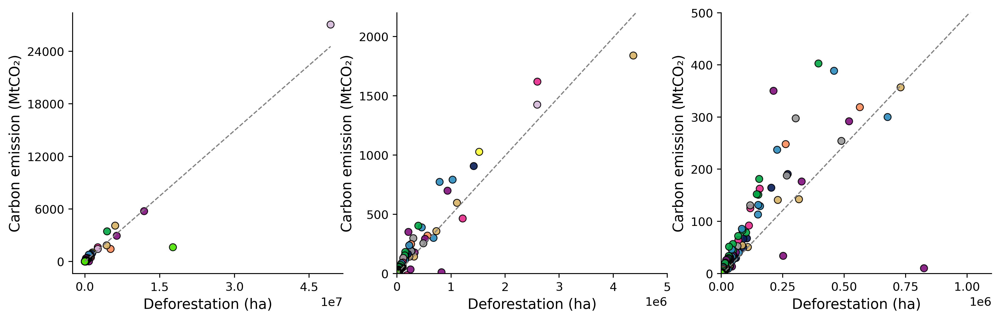

In [53]:
# Plotting the top commodities
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 4), dpi=350)
kwargs = {'alpha':0.9, 'linestyle':'-', 'linewidth':0.75, 'edgecolor':'k'}

Selected_data = Singh_et_al.groupby(['Commodity']).sum().reset_index()[['Commodity', 'Deforestation attribution, unamortized (ha)', 'Total Emissions (MtCO2)']].sort_values(by = 'Deforestation attribution, unamortized (ha)', ascending = False)

Commodity_group = pd.read_excel(home_folder+Simulation_version+'/Supplementary_data-DeDuCE v1.xlsx', 'Lookup-FAO commodity')  
Selected_data['Commodity group'] = Selected_data['Commodity'].str.replace('^Forest plantation.*', 'Forest plantation', regex=True)
Selected_data['Commodity group'] = Selected_data['Commodity group'].map(Commodity_group.set_index('Item name')['Group'])

Selected_data['Color'] = Selected_data['Commodity group'].map(Commodity_group_color.set_index('Commodity group')['Color'])

Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Cattle meat', 'Pasture', regex=True)
Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Leather', 'Pasture', regex=True)
Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('^Forest plantation.*', 'Forest plantation', regex=True)
Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Natural rubber in primary forms', 'Rubber', regex=True)
Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('^Cassava.*', 'Cassava', regex=True)
Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Beans, dry', 'Dry beans', regex=True)
Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Coffee, green', 'Coffee', regex=True)
Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Plantains and cooking bananas', 'Plantains', regex=True)
Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Groundnuts, excluding shelled', 'Groundnuts', regex=True)
Selected_data['Commodity'] = Selected_data['Commodity'].str.replace('Maize (corn)', 'Maize', regex=True)


# Top Commodities by Deforestation
palette = dict(zip(Selected_data['Commodity'], Selected_data['Color']))
sns.scatterplot(x='Deforestation attribution, unamortized (ha)', y='Total Emissions (MtCO2)', data=Selected_data, ax=axes[0], palette=palette, **kwargs, hue='Commodity')
sns.regplot(x='Deforestation attribution, unamortized (ha)', y='Total Emissions (MtCO2)', data=Selected_data, ax=axes[0], ci=None, scatter_kws={"s":0}, line_kws={"color": "grey", "lw": 1, 'ls': '--'})


# Top Commodities by Deforestation
sns.scatterplot(x='Deforestation attribution, unamortized (ha)', y='Total Emissions (MtCO2)', data=Selected_data, ax=axes[1], palette=palette, **kwargs, hue='Commodity')
sns.regplot(x='Deforestation attribution, unamortized (ha)', y='Total Emissions (MtCO2)', data=Selected_data, ax=axes[1], ci=None, scatter_kws={"s":0}, line_kws={"color": "grey", "lw": 1, 'ls': '--'})
axes[1].set_xlim(0,5000000)
axes[1].set_ylim(0,2200)

# Top Commodities by Deforestation
sns.scatterplot(x='Deforestation attribution, unamortized (ha)', y='Total Emissions (MtCO2)', data=Selected_data, ax=axes[2], palette=palette, **kwargs, hue='Commodity')
sns.regplot(x='Deforestation attribution, unamortized (ha)', y='Total Emissions (MtCO2)', data=Selected_data, ax=axes[2], ci=None, scatter_kws={"s":0}, line_kws={"color": "grey", "lw": 1, 'ls': '--'})
axes[2].set_xlim(0,1100000)
axes[2].set_ylim(0,500)


for i in range(3):
    axes[i].spines[['right', 'top']].set_visible(False)
    axes[i].set_xlabel('Deforestation (ha)', fontsize = 12)
    axes[i].set_ylabel('Carbon emission (MtCO₂)', fontsize = 12)
    axes[i].xaxis.set_major_locator(plt.MaxNLocator(5))
    axes[i].yaxis.set_major_locator(plt.MaxNLocator(5))
    axes[i].get_legend().remove()


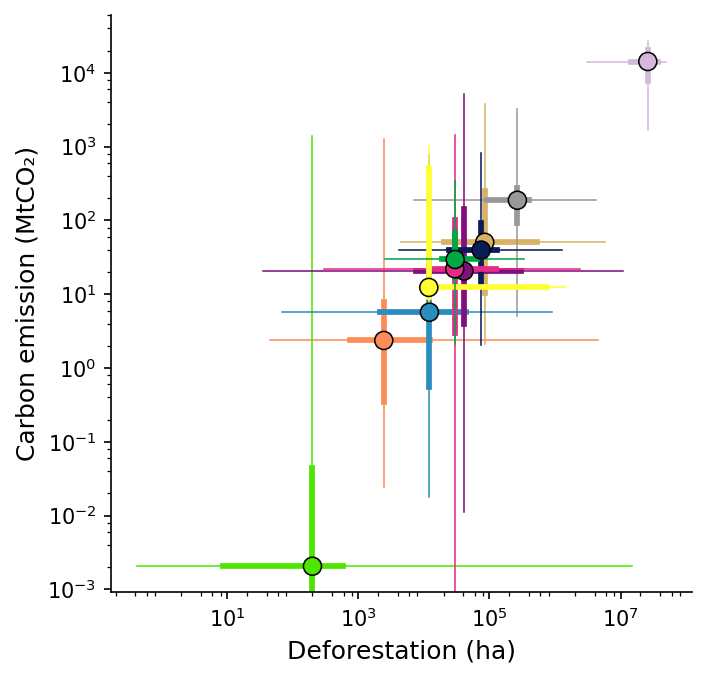

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'Selected_data' is your DataFrame
# Calculate the median, 5th and 95th percentiles for each group
grouped_data = Selected_data.groupby('Commodity group').agg(
    median_deforestation=('Deforestation attribution, unamortized (ha)', np.median),
    mean_deforestation = ('Deforestation attribution, unamortized (ha)', np.mean),
    deforestation_1st=('Deforestation attribution, unamortized (ha)', lambda x: np.percentile(x, 1)),
    deforestation_25th=('Deforestation attribution, unamortized (ha)', lambda x: np.percentile(x, 25)),
    deforestation_75th=('Deforestation attribution, unamortized (ha)', lambda x: np.percentile(x, 75)),
    deforestation_99th=('Deforestation attribution, unamortized (ha)', lambda x: np.percentile(x, 99)),
    median_emissions=('Total Emissions (MtCO2)', np.median),
    mean_emissions=('Total Emissions (MtCO2)', np.mean),
    emissions_1st=('Total Emissions (MtCO2)', lambda x: np.percentile(x, 1)),
    emissions_25th=('Total Emissions (MtCO2)', lambda x: np.percentile(x, 25)),
    emissions_75th=('Total Emissions (MtCO2)', lambda x: np.percentile(x, 75)),
    emissions_99th=('Total Emissions (MtCO2)', lambda x: np.percentile(x, 99)),
).reset_index()

grouped_data['Color'] = grouped_data['Commodity group'].map(Commodity_group_color.set_index('Commodity group')['Color'])

# Plotting
plt.figure(figsize=(5, 5), dpi=150)

# Add error bars for the 5th and 95th percentiles
kwargs = {'alpha':1, 'linestyle':'-', 'linewidth':0.75, 'edgecolor':'k'}
palette = dict(zip(Selected_data['Commodity group'], Selected_data['Color']))

sns.scatterplot(data=grouped_data,
                x='median_deforestation',
                y='median_emissions', s = 75, palette = palette, **kwargs, 
                hue = 'Commodity group')


for index, row in grouped_data.iterrows():
    plt.errorbar([row['deforestation_1st'], row['deforestation_99th']], [row['median_emissions'], row['median_emissions']], color=row['Color'], lw = 0.75, fmt='-',
                               capsize=5,  elinewidth=2, markeredgewidth=2, zorder = 0)
    plt.errorbar([row['deforestation_25th'], row['deforestation_75th']], [row['median_emissions'], row['median_emissions']], color=row['Color'], lw = 2.75, fmt='-',
                               capsize=5,  elinewidth=2, markeredgewidth=2, zorder = 0)
    plt.errorbar([row['median_deforestation'], row['median_deforestation']], [row['emissions_1st'], row['emissions_99th']], color=row['Color'], lw = 0.75, fmt='-',
                               capsize=5,  elinewidth=2, markeredgewidth=2, zorder = 0)
    plt.errorbar([row['median_deforestation'], row['median_deforestation']], [row['emissions_25th'], row['emissions_75th']], color=row['Color'], lw = 2.75, fmt='-',
                               capsize=5,  elinewidth=2, markeredgewidth=2, zorder = 0)
    #for cap in caps:
    #    cap.set_color('red')
    #    cap.set_markeredgewidth(10)
    
plt.yscale('log')
plt.xscale('log')
#plt.axis([0, 100000000, 0, 100000])

# plt.xlim(0)
#plt.ylim(0)

import matplotlib.ticker as ticker
locmin = ticker.LogLocator(base=10.0,subs=(0.2,0.4,0.6,0.8),numticks=12)
plt.gca().xaxis.set_minor_locator(locmin)
plt.gca().xaxis.set_minor_formatter(ticker.NullFormatter())
locmin = ticker.LogLocator(base=10.0,subs=(0.2,0.4,0.6,0.8),numticks=12)
plt.gca().yaxis.set_minor_locator(locmin)
plt.gca().yaxis.set_minor_formatter(ticker.NullFormatter())

plt.gca().spines[['right', 'top']].set_visible(False)
plt.xlabel('Deforestation (ha)', fontsize = 12)
plt.ylabel('Carbon emission (MtCO₂)', fontsize = 12)
plt.legend().remove()

plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Supplementary_Figure_1_d.svg')

In [55]:

Singh_et_al = pd.read_excel(f'{home_folder}{Simulation_version}/Generated_results/DeDuCE_Deforestation_attribution_v{Dataset_version}.{GEE_data_version}.{Python_script_version} {Year}.xlsx', sheet_name = 'Deforestation attribution')
Singh_et_al['Total Emissions (MtCO2)'] = Singh_et_al['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] + Singh_et_al['Peatland drainage emissions (MtCO2)']

Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Cattle meat', 'Pasture', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Leather', 'Pasture', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('^Forest plantation.*', 'Forest plantation', regex=True)

Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Natural rubber in primary forms', 'Rubber', regex=True)

Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('^Cassava.*', 'Cassava', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Beans, dry', 'Dry beans', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Coffee, green', 'Coffee', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Plantains and cooking bananas', 'Plantains', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Groundnuts, excluding shelled', 'Groundnuts', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Maize (corn)', 'Maize', regex=True)

Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Coconuts, in shell', 'Coconuts', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Cashew nuts, in shell', 'Cashew nuts', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Seed cotton, unginned', 'Cotton', regex=True)

Commodity group                                PastureForest plantationOilseeds and oleaginou...
Commodity                                      PastureForest plantationOil palm fruitSoya bea...
Deforestation attribution, unamortized (ha)                                     117753481.947914
Total Emissions (MtCO2)                                                             55679.872077
Color                                          #d4b9da#4ce600#810f7c#810f7c#d8b365#fc8d59#999...
dtype: object
Commodity group                                PastureForest plantationOilseeds and oleaginou...
Commodity                                      PastureForest plantationOil palm fruitSoya bea...
Deforestation attribution, unamortized (ha)                                     117753481.947914
Total Emissions (MtCO2)                                                             55679.872077
Color                                          #d4b9da#4ce600#810f7c#810f7c#d8b365#fc8d59#999...
dtype: object


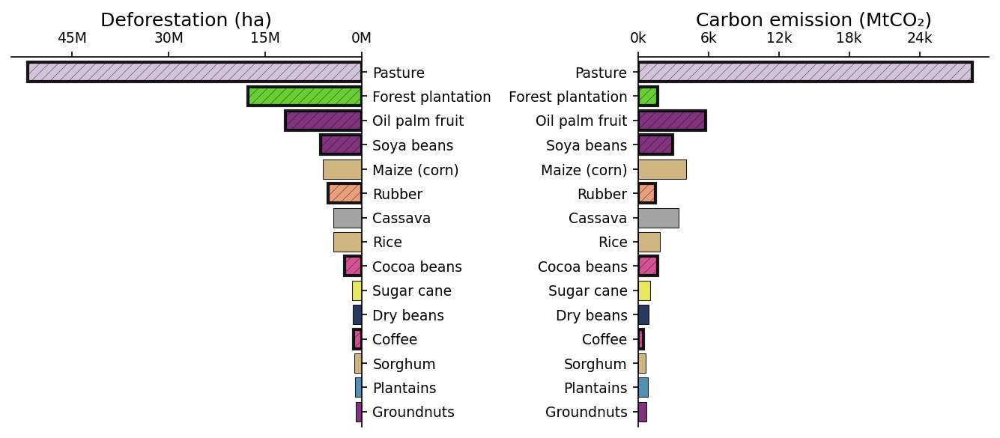

In [56]:
# Plotting the top commodities
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(9, 4), dpi=150)
kwargs = {'alpha':0.9, 'linestyle':'-', 'linewidth':0.5, 'edgecolor':'k'}

Selected_data = Singh_et_al.groupby(['Commodity group', 'Commodity']).sum().reset_index()[['Commodity group', 'Commodity', 'Deforestation attribution, unamortized (ha)', 'Total Emissions (MtCO2)']].sort_values(by = 'Deforestation attribution, unamortized (ha)', ascending = False)[0:15]
Selected_data['Color'] = Selected_data['Commodity group'].map(Commodity_group_color.set_index('Commodity group')['Color'])

# Assuming 'EUDR_commodities' is a list of commodity names that need to be highlighted
EUDR_commodities = ['Soya beans', 'Pasture', 'Oil palm fruit', 'Forest plantation', 'Cocoa beans', 'Coffee', 'Rubber']  # replace with actual commodity names
print(Selected_data.sum())


# Top Commodities by Deforestation
barplot = sns.barplot(x='Deforestation attribution, unamortized (ha)', y='Commodity', data=Selected_data, ax=axes[0], palette=Selected_data['Color'], **kwargs)
# Iterate through the bars and apply hatches to non-tropical countries
for bar, country in zip(barplot.patches, Selected_data['Commodity']):
    if country in EUDR_commodities:
        bar.set_hatch('////')  # You can use other patterns like 'x', '+', '-', '|', etc.
        bar.set_linewidth(2)

axes[0].tick_params(axis = 'y', left = False, right = True, labelleft = False, labelright = True)
axes[0].invert_xaxis()

def million_formatter(x, pos):
    return '{:.0f}M'.format(x / 10**6)
axes[0].xaxis.set_major_formatter(ticker.FuncFormatter(million_formatter))
axes[0].xaxis.set_major_locator(plt.MaxNLocator(5))
axes[0].xaxis.label.set_position((0.5, 1.1))  # Shift x-label to the top
axes[0].set_ylabel('')
axes[0].spines[['left', 'bottom',]].set_visible(False)  # Hide the bottom spine
axes[0].xaxis.tick_top()  # Move the x-ticks to the top
axes[0].xaxis.set_tick_params(labeltop=True)  # Show the x-tick labels on top
#axes[0].set_xticklabels([])  # Hide all x-tick values
axes[0].xaxis.set_label_position('top')
axes[0].xaxis.tick_top()
axes[0].set_xlabel('Deforestation (ha)', fontsize = 12)
axes[0].margins(y=0.015)
axes[0].tick_params(axis='both', which='major', labelsize=9)



# Assuming 'EUDR_commodities' is a list of commodity names that need to be highlighted
print(Selected_data.sum())

# Top Commodities by Deforestation
barplot = sns.barplot(x='Total Emissions (MtCO2)', y='Commodity', data=Selected_data, ax=axes[1], palette=Selected_data['Color'], **kwargs)
# Iterate through the bars and apply hatches to non-tropical countries
for bar, country in zip(barplot.patches, Selected_data['Commodity']):
    if country in EUDR_commodities:
        bar.set_hatch('////')  # You can use other patterns like 'x', '+', '-', '|', etc.
        bar.set_linewidth(2)
        
def million_formatter(x, pos):
    return '{:.0f}k'.format(x / 10**3)
axes[1].xaxis.set_major_formatter(ticker.FuncFormatter(million_formatter))
axes[1].xaxis.set_major_locator(plt.MaxNLocator(5))
axes[1].xaxis.label.set_position((0.5, 1.1))  # Shift x-label to the top
axes[1].set_ylabel('')
axes[1].spines[['right', 'bottom',]].set_visible(False)  # Hide the bottom spine
axes[1].xaxis.tick_top()  # Move the x-ticks to the top
axes[1].xaxis.set_tick_params(labeltop=True)  # Show the x-tick labels on top
#axes[1].set_xticklabels([])  # Hide all x-tick values
axes[1].xaxis.set_label_position('top')
axes[1].xaxis.tick_top()
axes[1].set_xlabel('Carbon emission (MtCO₂)', fontsize = 12)
axes[1].margins(y=0.015)
axes[1].tick_params(axis='both', which='major', labelsize=9)

# Show the plot
plt.tight_layout()
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Supplementary_Figure_1_c.svg')

Producer country                               BrazilIndonesiaChinaUnited StatesParaguayBrazi...
Commodity                                      PastureOil palm fruitForest plantationForest p...
Deforestation attribution, unamortized (ha)                                      94500314.780702
Total Emissions (MtCO2)                                                             44678.622309
Pair                                           Brazil:PastureIndonesia:Oil palm fruitChina:Fo...
dtype: object


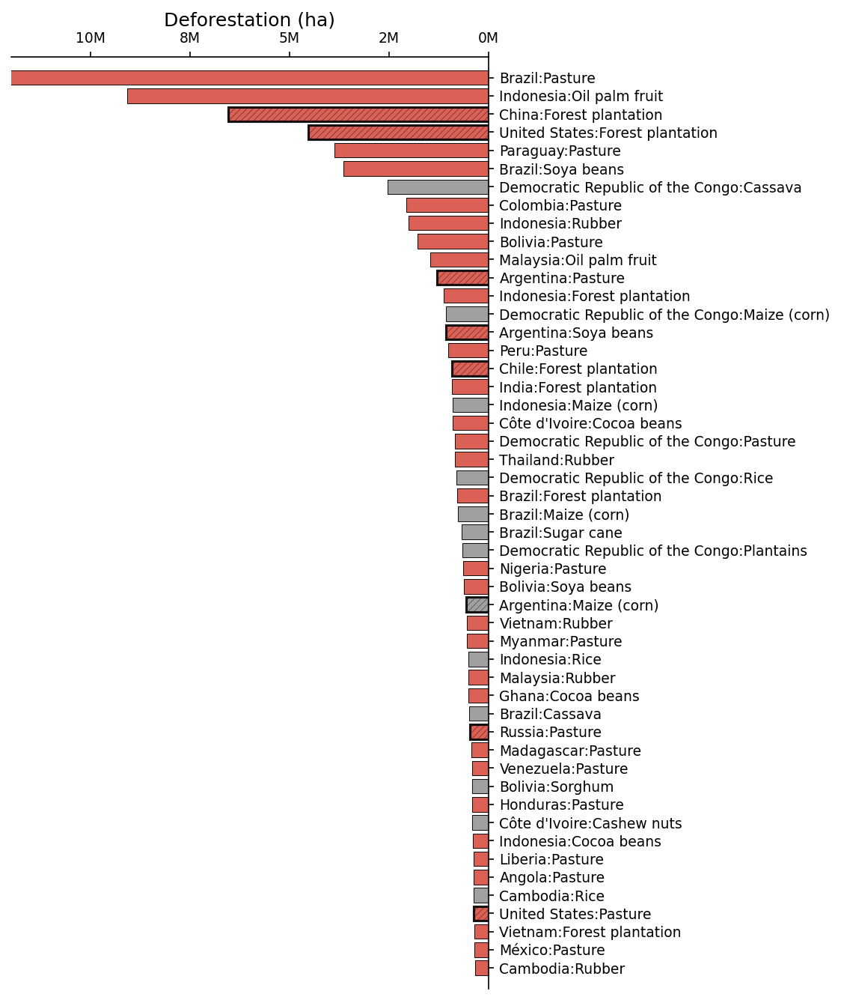

In [58]:
# Plotting the top commodities
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 9), dpi=150)
kwargs = {'alpha':0.9, 'linestyle':'-', 'linewidth':0.5, 'edgecolor':'k'}

Selected_data = Singh_et_al.groupby(['Producer country', 'Commodity']).sum().reset_index()[['Producer country', 'Commodity', 'Deforestation attribution, unamortized (ha)', 
                                                                                            'Total Emissions (MtCO2)']].sort_values(by = 'Deforestation attribution, unamortized (ha)', 
                                                                                                                                    ascending = False)[0:50]
Selected_data['Pair'] = Selected_data['Producer country'].astype(str) + ':' + Selected_data['Commodity'].astype(str)

EUDR_commodities = ['Soya beans', 'Pasture', 'Oil palm fruit', 'Forest plantation', 'Cocoa beans', 'Coffee', 'Rubber']  # replace with actual commodity names
# Create a color palette where EUDR commodities are highlighted in red, others in grey
palette = {country.split(":")[0]+':'+commodity.split(":")[1]: '#ef3b2c' if commodity.split(":")[1] in EUDR_commodities else '#969696' 
           for country, commodity in zip(Selected_data['Pair'], Selected_data['Pair'])}

# Top Commodities by Deforestation
barplot = sns.barplot(x='Deforestation attribution, unamortized (ha)', y='Pair', data=Selected_data, ax=axes[0], palette=palette, **kwargs)
# Iterate through the bars and apply hatches to non-tropical countries
for bar, country in zip(barplot.patches, Selected_data['Producer country']):
    if country in ['United States', 'China', 'Argentina', 'Chile', 'Russia']:
        bar.set_hatch('//////')  # You can use other patterns like 'x', '+', '-', '|', etc.
        bar.set_linewidth(1.5)


axes[0].tick_params(axis = 'y', left = False, right = True, labelleft = False, labelright = True)
axes[0].invert_xaxis()

def million_formatter(x, pos):
    return '{:.0f}M'.format(x / 10**6)
axes[0].xaxis.set_major_formatter(ticker.FuncFormatter(million_formatter))
axes[0].xaxis.set_major_locator(plt.MaxNLocator(5))
axes[0].xaxis.label.set_position((0.5, 1.1))  # Shift x-label to the top
axes[0].set_ylabel('')
axes[0].spines[['left', 'bottom',]].set_visible(False)  # Hide the bottom spine
axes[0].xaxis.tick_top()  # Move the x-ticks to the top
axes[0].xaxis.set_tick_params(labeltop=True)  # Show the x-tick labels on top
#axes[0].set_xticklabels([])  # Hide all x-tick values
axes[0].xaxis.set_label_position('top')
axes[0].xaxis.tick_top()
axes[0].set_xlabel('Deforestation (ha)', fontsize = 12)
axes[0].margins(y=0.015)
axes[0].tick_params(axis='both', which='major', labelsize=9)



# Assuming 'EUDR_commodities' is a list of commodity names that need to be highlighted
print(Selected_data.sum())
"""
# Top Commodities by Deforestation
barplot = sns.barplot(x='Total Emissions (MtCO2)', y='Pair', data=Selected_data, ax=axes[1], **kwargs)
# Iterate through the bars and apply hatches to non-tropical countries
for bar, country in zip(barplot.patches, Selected_data['Commodity']):
    if country in EUDR_commodities:
        bar.set_hatch('////')  # You can use other patterns like 'x', '+', '-', '|', etc.
        
def million_formatter(x, pos):
    return '{:.0f}k'.format(x / 10**3)
axes[1].xaxis.set_major_formatter(ticker.FuncFormatter(million_formatter))
axes[1].xaxis.set_major_locator(plt.MaxNLocator(5))
axes[1].xaxis.label.set_position((0.5, 1.1))  # Shift x-label to the top
axes[1].set_ylabel('')
axes[1].spines[['right', 'bottom',]].set_visible(False)  # Hide the bottom spine
axes[1].xaxis.tick_top()  # Move the x-ticks to the top
axes[1].xaxis.set_tick_params(labeltop=True)  # Show the x-tick labels on top
#axes[1].set_xticklabels([])  # Hide all x-tick values
axes[1].xaxis.set_label_position('top')
axes[1].xaxis.tick_top()
axes[1].set_xlabel('Carbon emission (MtCO₂)', fontsize = 12)
axes[1].margins(y=0.015)
axes[1].tick_params(axis='both', which='major', labelsize=9)
"""

[fig.delaxes(axes) for axes in axes.flatten() if not axes.has_data()]
plt.xlim(12000000,)
# Show the plot
plt.tight_layout()
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Supplementary_Figure_3.svg')

In [59]:
Selected_data

,Producer country,Commodity,"Deforestation attribution, unamortized (ha)",Total Emissions (MtCO2),Pair
1081,Brazil,Pasture,3.193255e+07,19044.952526,Brazil:Pasture
3654,Indonesia,Oil palm fruit,9.087782e+06,5360.464861,Indonesia:Oil palm fruit
1646,China,Forest plantation,6.552915e+06,-54.873075,China:Forest plantation
8478,United States,Forest plantation,4.531200e+06,1002.445862,United States:Forest plantation
6192,Paraguay,Pasture,3.869636e+06,1082.757939,Paraguay:Pasture
1096,Brazil,Soya beans,3.644317e+06,1542.048618,Brazil:Soya beans
2186,Democratic Republic of the Congo,Cassava,2.543580e+06,2142.386968,Democratic Republic of the Congo:Cassava
1772,Colombia,Pasture,2.065571e+06,1251.544269,Colombia:Pasture
3672,Indonesia,Rubber,2.015806e+06,784.466293,Indonesia:Rubber
939,Bolivia,Pasture,1.789002e+06,781.078231,Bolivia:Pasture


Producer country                               BrazilIndonesiaDR CongoChinaUnited StatesParag...
Deforestation attribution, unamortized (ha)                                     105325376.075457
Total Emissions (MtCO2)                                                             53382.896137
dtype: object
Producer country                               BrazilIndonesiaDR CongoMalaysiaColombiaBolivia...
Deforestation attribution, unamortized (ha)                                      99273436.693528
Total Emissions (MtCO2)                                                             53865.768766
dtype: object


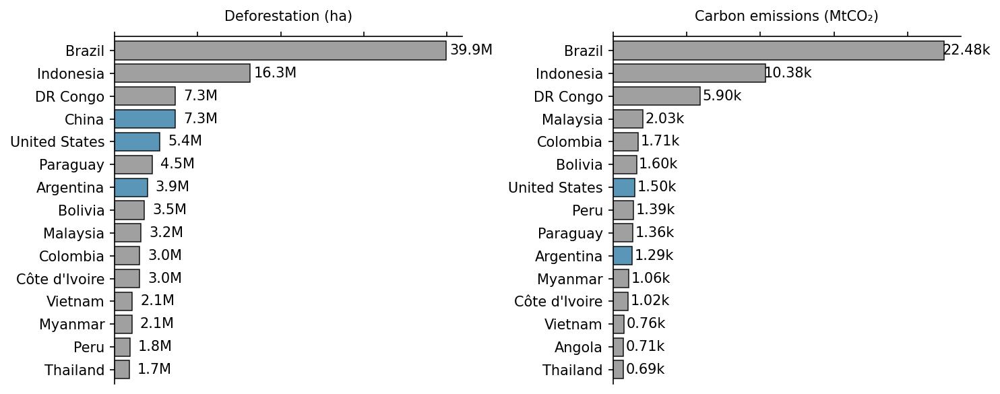

In [60]:

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Plotting the top commodities
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), dpi=150)
kwargs = {'alpha':0.9, 'linestyle':'-', 'linewidth':0.75, 'edgecolor':'k'}

Selected_data = Singh_et_al.groupby(['Producer country']).sum().reset_index()[['Producer country', 'Deforestation attribution, unamortized (ha)', 'Total Emissions (MtCO2)']].sort_values(by = 'Deforestation attribution, unamortized (ha)', ascending = False)[0:15]
Selected_data.loc[Selected_data['Producer country'] == 'Democratic Republic of the Congo', 'Producer country'] = 'DR Congo'
# Assuming 'EUDR_commodities' is a list of commodity names that need to be highlighted
Non_tropical_countries = ['United States', 'China', 'Argentina']  # replace with actual commodity names
print(Selected_data.sum())
# Create a color palette where EUDR commodities are highlighted in red, others in grey
palette = {commodity: '#3690c0' if commodity in Non_tropical_countries else '#969696' 
           for commodity in Selected_data['Producer country']}
# Top Commodities by Deforestation
sns.barplot(x='Deforestation attribution, unamortized (ha)', y='Producer country', data=Selected_data, ax=axes[0], palette=palette, **kwargs)

# Add values in front of the bars
for p in axes[0].patches:
    width = p.get_width()
    axes[0].text(width + 3050000,  # 5 is a small offset to the right from the bar end
                 p.get_y() + p.get_height() / 2,
                 f'{width/1e6:.1f}M',  # formatting with conversion to millions
                 ha='center', va='center', fontsize = 10)

axes[0].xaxis.label.set_position((0.5, 1.1))  # Shift x-label to the top
axes[0].set_ylabel('')
axes[0].spines[['right', 'bottom',]].set_visible(False)  # Hide the bottom spine
axes[0].xaxis.tick_top()  # Move the x-ticks to the top
axes[0].xaxis.set_tick_params(labeltop=True)  # Show the x-tick labels on top
axes[0].set_xticklabels([])  # Hide all x-tick values
axes[0].xaxis.set_label_position('top')
axes[0].xaxis.tick_top()
axes[0].set_xlabel('Deforestation (ha)')
axes[0].margins(y=0.015)


Selected_data = Singh_et_al.groupby(['Producer country']).sum().reset_index()[['Producer country', 'Deforestation attribution, unamortized (ha)', 'Total Emissions (MtCO2)']].sort_values(by = 'Total Emissions (MtCO2)', ascending = False)[0:15]
Selected_data.loc[Selected_data['Producer country'] == 'Democratic Republic of the Congo', 'Producer country'] = 'DR Congo'
# Assuming 'EUDR_commodities' is a list of commodity names that need to be highlighted
Non_tropical_countries = ['United States', 'China', 'Argentina']  # replace with actual commodity names
print(Selected_data.sum())

# Create a color palette where EUDR commodities are highlighted in red, others in grey
palette = {commodity: '#3690c0' if commodity in Non_tropical_countries else '#969696' 
           for commodity in Selected_data['Producer country']}
# Top Commodities by Deforestation
sns.barplot(x='Total Emissions (MtCO2)', y='Producer country', data=Selected_data, ax=axes[1], palette=palette, **kwargs)

# Add values in front of the bars
for p in axes[1].patches:
    width = p.get_width()
    axes[1].text(width + 1500,  # 5 is a small offset to the right from the bar end
                 p.get_y() + p.get_height() / 2,
                 f'{width/1e3:.2f}k',  # formatting with conversion to millions
                 ha='center', va='center', fontsize = 10)

axes[1].xaxis.label.set_position((0.5, 1.1))  # Shift x-label to the top
axes[1].set_ylabel('')
axes[1].spines[['right', 'bottom',]].set_visible(False)  # Hide the bottom spine
axes[1].xaxis.tick_top()  # Move the x-ticks to the top
axes[1].xaxis.set_tick_params(labeltop=True)  # Show the x-tick labels on top
axes[1].set_xticklabels([])  # Hide all x-tick values
axes[1].xaxis.set_label_position('top')
axes[1].xaxis.tick_top()
axes[1].set_xlabel('Carbon emissions (MtCO₂)')
axes[1].margins(y=0.015)

# Show the plot
plt.tight_layout()
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure3_a.svg')

In [61]:

Singh_et_al = pd.read_excel(f'{home_folder}{Simulation_version}/Generated_results/DeDuCE_Deforestation_attribution_v{Dataset_version}.{GEE_data_version}.{Python_script_version} {Year}.xlsx', sheet_name = 'Deforestation attribution')
Singh_et_al['Total Emissions (MtCO2)'] = Singh_et_al['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] + Singh_et_al['Peatland drainage emissions (MtCO2)']

Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Cattle meat', 'Pasture', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Leather', 'Pasture', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('^Forest plantation.*', 'Forest plantation', regex=True)

Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Natural rubber in primary forms', 'Rubber', regex=True)

Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('^Cassava.*', 'Cassava', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Beans, dry', 'Dry beans', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Coffee, green', 'Coffee', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Plantains and cooking bananas', 'Plantains', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Groundnuts, excluding shelled', 'Groundnuts', regex=True)
Singh_et_al['Commodity'] = Singh_et_al['Commodity'].str.replace('Maize (corn)', 'Maize', regex=True)

Commodity                                      PastureForest plantationOil palm fruitSoya bea...
Deforestation attribution, unamortized (ha)                                     117755665.665303
Total Emissions (MtCO2)                                                             55681.723439
dtype: object
Commodity                                      PastureOil palm fruitMaize (corn)CassavaSoya b...
Deforestation attribution, unamortized (ha)                                     117329067.888063
Total Emissions (MtCO2)                                                             55990.416681
dtype: object


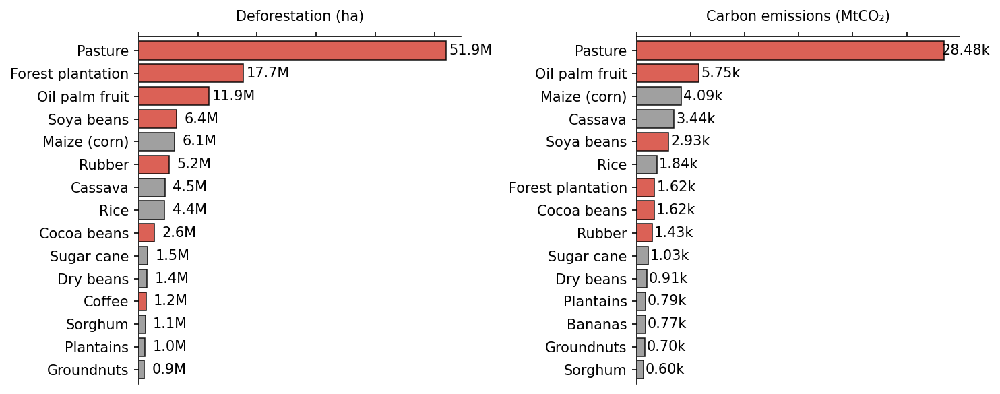

In [62]:
# Plotting the top commodities
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), dpi=150)
kwargs = {'alpha':0.9, 'linestyle':'-', 'linewidth':0.75, 'edgecolor':'k'}

Selected_data = Singh_et_al.groupby(['Commodity']).sum().reset_index()[['Commodity', 'Deforestation attribution, unamortized (ha)', 'Total Emissions (MtCO2)']].sort_values(by = 'Deforestation attribution, unamortized (ha)', ascending = False)[0:15]
# Assuming 'EUDR_commodities' is a list of commodity names that need to be highlighted
EUDR_commodities = ['Soya beans', 'Pasture', 'Oil palm fruit', 'Forest plantation', 'Cocoa beans', 'Coffee', 'Rubber']  # replace with actual commodity names
print(Selected_data.sum())

# Create a color palette where EUDR commodities are highlighted in red, others in grey
palette = {commodity: '#ef3b2c' if commodity in EUDR_commodities else '#969696' 
           for commodity in Selected_data['Commodity']}

# Top Commodities by Deforestation
sns.barplot(x='Deforestation attribution, unamortized (ha)', y='Commodity', data=Selected_data, ax=axes[0], palette=palette, **kwargs)

# Add values in front of the bars
for p in axes[0].patches:
    width = p.get_width()
    axes[0].text(width + 4200000,  # 5 is a small offset to the right from the bar end
                 p.get_y() + p.get_height() / 2,
                 f'{width/1e6:.1f}M',  # formatting with conversion to millions
                 ha='center', va='center', fontsize = 10)

axes[0].xaxis.label.set_position((0.5, 1.1))  # Shift x-label to the top
axes[0].set_ylabel('')
axes[0].spines[['right', 'bottom',]].set_visible(False)  # Hide the bottom spine
axes[0].xaxis.tick_top()  # Move the x-ticks to the top
axes[0].xaxis.set_tick_params(labeltop=True)  # Show the x-tick labels on top
axes[0].set_xticklabels([])  # Hide all x-tick values
axes[0].xaxis.set_label_position('top')
axes[0].xaxis.tick_top()
axes[0].set_xlabel('Deforestation (ha)')
axes[0].margins(y=0.015)


Selected_data = Singh_et_al.groupby(['Commodity']).sum().reset_index()[['Commodity', 'Deforestation attribution, unamortized (ha)', 'Total Emissions (MtCO2)']].sort_values(by = 'Total Emissions (MtCO2)', ascending = False)[0:15]
# Assuming 'EUDR_commodities' is a list of commodity names that need to be highlighted
EUDR_commodities = ['Soya beans', 'Pasture', 'Oil palm fruit', 'Forest plantation', 'Cocoa beans', 'Coffee', 'Rubber']  # replace with actual commodity names
print(Selected_data.sum())

# Create a color palette where EUDR commodities are highlighted in red, others in grey
palette = {commodity: '#ef3b2c' if commodity in EUDR_commodities else '#969696' 
           for commodity in Selected_data['Commodity']}

# Top Commodities by Deforestation
sns.barplot(x='Total Emissions (MtCO2)', y='Commodity', data=Selected_data, ax=axes[1], palette=palette, **kwargs)

# Add values in front of the bars
for p in axes[1].patches:
    width = p.get_width()
    axes[1].text(width + 2000,  # 5 is a small offset to the right from the bar end
                 p.get_y() + p.get_height() / 2,
                 f'{width/1e3:.2f}k',  # formatting with conversion to millions
                 ha='center', va='center', fontsize = 10)

axes[1].xaxis.label.set_position((0.5, 1.1))  # Shift x-label to the top
axes[1].set_ylabel('')
axes[1].spines[['right', 'bottom',]].set_visible(False)  # Hide the bottom spine
axes[1].xaxis.tick_top()  # Move the x-ticks to the top
axes[1].xaxis.set_tick_params(labeltop=True)  # Show the x-tick labels on top
axes[1].set_xticklabels([])  # Hide all x-tick values
axes[1].xaxis.set_label_position('top')
axes[1].xaxis.tick_top()
axes[1].set_xlabel('Carbon emissions (MtCO₂)')
axes[1].margins(y=0.015)


# Show the plot
plt.tight_layout()
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure3_b.svg')

In [4]:
Singh_et_al = pd.read_excel(f'{home_folder}{Simulation_version}/Generated_results/DeDuCE_Deforestation_attribution_v{Dataset_version}.{GEE_data_version}.{Python_script_version} {Year}.xlsx', sheet_name = 'Deforestation attribution')

In [5]:
import numpy as np

# Filter countries with negative deforestation emissions
negative_emission_countries = Singh_et_al.loc[Singh_et_al['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] < 0, 'Producer country'].unique()

for country in negative_emission_countries:
    # Select unique commodities for each country with specific conditions
    commodities = Singh_et_al.loc[(Singh_et_al['Producer country'] == country) &
                                  (Singh_et_al['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'] < -0.1) &
                                  (Singh_et_al['Deforestation attribution, unamortized (ha)'] > 100), 'Commodity'].unique()

    # Filter out specific commodities
    remove = ['Forest plantation (Unclassified)', 'Coconuts, in shell', 'Coffee, green','Mangoes', 'Oil palm fruit','Natural rubber in primary forms', 'Forest plantation (Bamboo)',
              'Forest plantation (Gum)', 'Other oil seeds, n.e.c.', 'Mangoes, guavas and mangosteens', 'Other fruits, n.e.c.', 'Other tropical fruits, n.e.c.']
    commodities = [comm for comm in commodities if comm not in remove]

    # Skip printing if no commodities are left after filtering
    if commodities:
        print(f"Country: {country}")
        print("Commodities:", commodities)
        print('-----------------')


Country: Bolivia
Commodities: ['Sugar cane']
-----------------
Country: Cambodia
Commodities: ['Rice']
-----------------
Country: Canada
Commodities: ['Rape or colza seed']
-----------------
Country: Chile
Commodities: ['Rape or colza seed']
-----------------
Country: France
Commodities: ['Rape or colza seed']
-----------------
Country: Germany
Commodities: ['Rape or colza seed']
-----------------
Country: Indonesia
Commodities: ['Cloves (whole stems), raw']
-----------------
Country: Laos
Commodities: ['Maize (corn)']
-----------------
Country: Malaysia
Commodities: ['Rice']
-----------------
Country: Myanmar
Commodities: ['Maize (corn)', 'Rice']
-----------------
Country: Poland
Commodities: ['Rape or colza seed']
-----------------
Country: Romania
Commodities: ['Rape or colza seed']
-----------------
Country: Thailand
Commodities: ['Barley', 'Cassava, fresh', 'Cereals n.e.c.', 'Groundnuts, excluding shelled', 'Maize (corn)', 'Other pulses n.e.c.', 'Rice', 'Sorghum', 'Soya beans']
--

In [6]:
# Custom function to calculate the weighted mean
def weighted_mean(group):
    quality_index = group['Quality Index']
    weights = group['Deforestation attribution, unamortized (ha)']
    try:
        return (quality_index * weights).sum() / weights.sum()
    except ZeroDivisionError:
        return np.nan


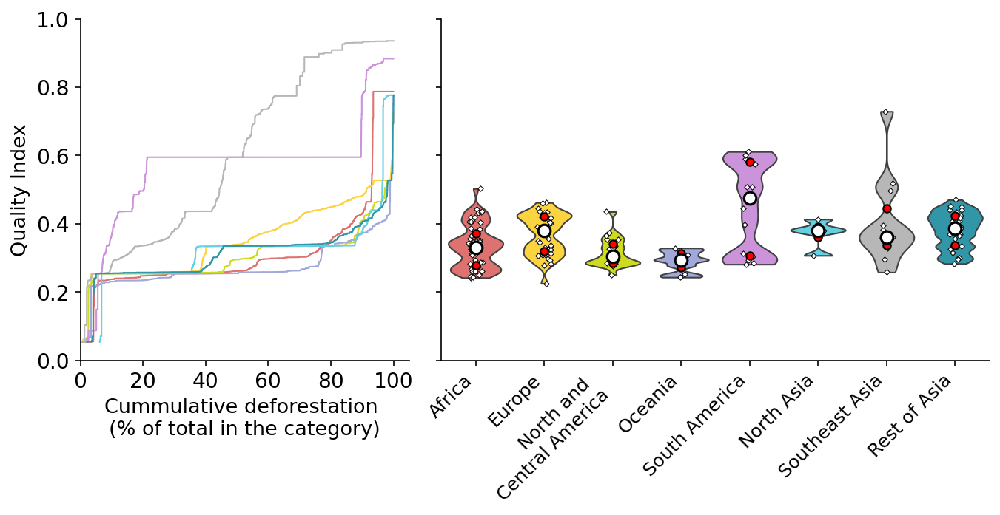

In [10]:
import matplotlib.gridspec as gridspec
plt.rc('font', size=13.5)

# Create a figure
fig = plt.figure(figsize=(12, 4), dpi=150)

# Define the width ratio for the subplots
gs = gridspec.GridSpec(1, 3, width_ratios=[1.8, 3, 0.5], wspace=0.1)

# Create subplots with the specified width ratio
ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])

for Continent, color in zip(Country_group_color['Continent/Country group'].values, Country_group_color['Color'].values):
    Singh_et_al_ranked = Singh_et_al.loc[Singh_et_al['Continent/Country group'] == Continent]
    Singh_et_al_ranked = Singh_et_al_ranked.sort_values(by='Quality Index', ascending=True)
    # Create a boolean mask where 'Deforestation attribution, unamortized (ha)' is not zero
    mask = Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'] != 0
    # Apply this mask to filter the rows
    Singh_et_al_ranked = Singh_et_al_ranked.loc[mask]
    Singh_et_al_ranked = Singh_et_al_ranked.reset_index()
    
    Singh_et_al_ranked['Cummulative Deforestation'] = Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'] / Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'].sum()
    Singh_et_al_ranked['Cummulative Deforestation'] = Singh_et_al_ranked['Cummulative Deforestation'].cumsum()*100
    
    # Create the first plot with 'Quality Index' on the primary y-axis
    #ax1 = Singh_et_al_ranked['Quality Index'].plot(label='Quality Index', drawstyle="steps", linewidth=1, color = 'black')
    ax0.step(Singh_et_al_ranked['Cummulative Deforestation'], Singh_et_al_ranked['Quality Index'], lw = 1, color = color)
    
# Set up the legend for both plots
ax0.spines[['right', 'top']].set_visible(False)
ax0.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize = 15)
ax0.set_xticks([0, 20, 40, 60, 80, 100], fontsize = 15)

ax0.set_ylabel('Quality Index', fontsize = 13)
ax0.set_xlabel('Cummulative deforestation \n(% of total in the category)', fontsize = 13)
ax0.set_xlim(0,)
ax0.set_ylim(0,)



Singh_et_al_PC = Singh_et_al.groupby(['Continent/Country group', 'Producer country']).apply(weighted_mean).reset_index(name='Quality Index')

ordered = ['Africa', 'Europe', 'North and Central America', 'Oceania', 'South America', 'North Asia', 'Southeast Asia', 'Rest of Asia']

sns.violinplot(x='Continent/Country group', y='Quality Index', data=Singh_et_al_PC, cut=0,
               scale='width', inner=None, linewidth=1, palette = Country_group_color['Color'],
               saturation=1, order=ordered, bw=0.2, legend = False, ax = ax1)

sns.stripplot(x='Continent/Country group', y='Quality Index', data=Singh_et_al_PC,
              jitter=True, linewidth=0.5, order=ordered, s = 2.5, color='#FFFFFF', marker = 'D', edgecolor = "black", ax = ax1)

medians = Singh_et_al_PC.groupby('Continent/Country group').median().reset_index()
q25 = Singh_et_al_PC.groupby('Continent/Country group').quantile(0.25).reset_index()
q75 = Singh_et_al_PC.groupby('Continent/Country group').quantile(0.75).reset_index()

sns.swarmplot(x='Continent/Country group', y='Quality Index', data=q25, order=ordered,
              color='red', edgecolor='black', linewidth=1, size=5, ax = ax1)
sns.swarmplot(x='Continent/Country group', y='Quality Index', data=q75, order=ordered,
              color='red', edgecolor='black', linewidth=1, size=5, ax = ax1)
sns.swarmplot(x='Continent/Country group', y='Quality Index', data=medians, order=ordered,
              color='white', edgecolor='black', linewidth=1.5, size=8, ax = ax1)

plt.xticks(ticks=range(len(['Africa', 'Europe', 'North and Central America', 'Oceania', 'South America', 'North Asia', 'Southeast Asia', 'Rest of Asia'])),
           labels=['Africa', 'Europe', 'North and \nCentral America', 'Oceania', 'South America', 'North Asia', 'Southeast Asia', 'Rest of Asia'])
_ = ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize = 12)
ax1.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize = 14)
ax1.set_ylabel('', fontsize = 12)
ax1.set_xlabel('')
ax1.set_ylim(0,1)
ax1.spines[['right', 'top']].set_visible(False)
ax1.tick_params(axis='both', labelleft=False, labeltop=False, labelright=False, labelbottom=True)
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure_6_bc.svg')

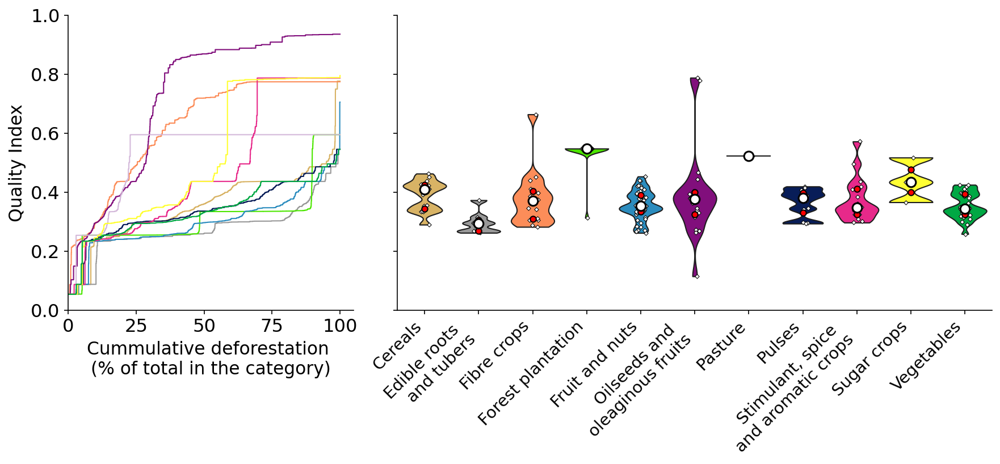

In [11]:
import matplotlib.gridspec as gridspec
plt.rc('font', size=15.5)

# Create a figure
fig = plt.figure(figsize=(14, 4.5), dpi=150)

# Define the width ratio for the subplots
gs = gridspec.GridSpec(1, 2, width_ratios=[1.2, 2.5], wspace=0.1)

# Create subplots with the specified width ratio
ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])

for Commodity, color in zip(Commodity_group_color['Commodity group'].values, Commodity_group_color['Color'].values):
    Singh_et_al_ranked = Singh_et_al.loc[Singh_et_al['Commodity group'] == Commodity]
    Singh_et_al_ranked = Singh_et_al_ranked.sort_values(by='Quality Index', ascending=True)
    # Create a boolean mask where 'Deforestation attribution, unamortized (ha)' is not zero
    mask = Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'] != 0
    # Apply this mask to filter the rows
    Singh_et_al_ranked = Singh_et_al_ranked.loc[mask]
    Singh_et_al_ranked = Singh_et_al_ranked.reset_index()
    
    Singh_et_al_ranked['Cummulative Deforestation'] = Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'] / Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'].sum()
    Singh_et_al_ranked['Cummulative Deforestation'] = Singh_et_al_ranked['Cummulative Deforestation'].cumsum()*100
    
    # Create the first plot with 'Quality Index' on the primary y-axis
    #ax1 = Singh_et_al_ranked['Quality Index'].plot(label='Quality Index', drawstyle="steps", linewidth=1, color = 'black')
    ax0.step(Singh_et_al_ranked['Cummulative Deforestation'], Singh_et_al_ranked['Quality Index'], lw = 1, color = color)
# Set up the legend for both plots
ax0.spines[['right', 'top']].set_visible(False)
ax0.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize = 12)
#ax[0].set_xticks(fontsize = 12)
ax0.set_ylabel('Quality Index', fontsize = 15)
ax0.set_xlabel('Cummulative deforestation \n(% of total in the category)', fontsize = 15)
ax0.set_xlim(0,)
ax0.set_ylim(0,)


Singh_et_al_CG = Singh_et_al.groupby(['Commodity group', 'Commodity']).apply(weighted_mean).reset_index(name='Quality Index')
Singh_et_al_CG['Commodity group'] = Singh_et_al_CG['Commodity group'].str.replace('Edible roots and tubers with high starch or inulin content', 'Edible roots and tubers', regex=True)
Singh_et_al_CG['Commodity group'] = Singh_et_al_CG['Commodity group'].str.replace('Pulses (dried leguminous vegetables)', 'Pulses', regex=True)

ordered = Singh_et_al_CG.groupby('Commodity group').median().sort_values(
                'Quality Index', ascending=False).index
ordered = sorted(ordered)


sns.violinplot(x='Commodity group', y='Quality Index', data=Singh_et_al_CG, cut=0,
               scale='width', inner=None, linewidth=1, palette = Commodity_group_color['Color'],
               saturation=1, order=ordered, bw=0.2, legend = False, ax= ax1)

sns.stripplot(x='Commodity group', y='Quality Index', data=Singh_et_al_CG,
              jitter=True, linewidth=0.5, order=ordered, s = 2.5, color='#FFFFFF', marker = 'D', edgecolor = "black", ax= ax1)


medians = Singh_et_al_CG.groupby('Commodity group').median().reset_index()
q25 = Singh_et_al_CG.groupby('Commodity group').quantile(0.25).reset_index()
q75 = Singh_et_al_CG.groupby('Commodity group').quantile(0.75).reset_index()

sns.swarmplot(x='Commodity group', y='Quality Index', data=q25, order=ordered,
              color='red', edgecolor='black', linewidth=1, size=5, ax= ax1)
sns.swarmplot(x='Commodity group', y='Quality Index', data=q75, order=ordered,
              color='red', edgecolor='black', linewidth=1, size=5, ax= ax1)
sns.swarmplot(x='Commodity group', y='Quality Index', data=medians, order=ordered,
              color='white', edgecolor='black', linewidth=1.5, size=8, ax= ax1)

plt.xticks(ticks=range(len(['Cereals', 'Edible roots and tubers', 'Fibre crops', 'Forest plantation', 
                            'Fruit and nuts', 'Oilseeds and oleaginous fruits', 'Pasture', 'Pulses', 
                            'Stimulant, spice and aromatic crops', 'Sugar crops', 'Vegetables'])),
           labels=['Cereals', 'Edible roots \nand tubers', 'Fibre crops', 'Forest plantation', 
                   'Fruit and nuts', 'Oilseeds and \noleaginous fruits', 'Pasture', 'Pulses', 
                   'Stimulant, spice \nand aromatic crops', 'Sugar crops', 'Vegetables'])

_ = ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize = 14)
ax1.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize = 12)
ax1.set_ylabel('', fontsize = 12)
ax1.set_xlabel('')
ax1.set_ylim(0,1)
ax1.spines[['right', 'top']].set_visible(False)
ax1.tick_params(axis='both', labelleft=False, labeltop=False, labelright=False, labelbottom=True)
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure_6_de.svg')

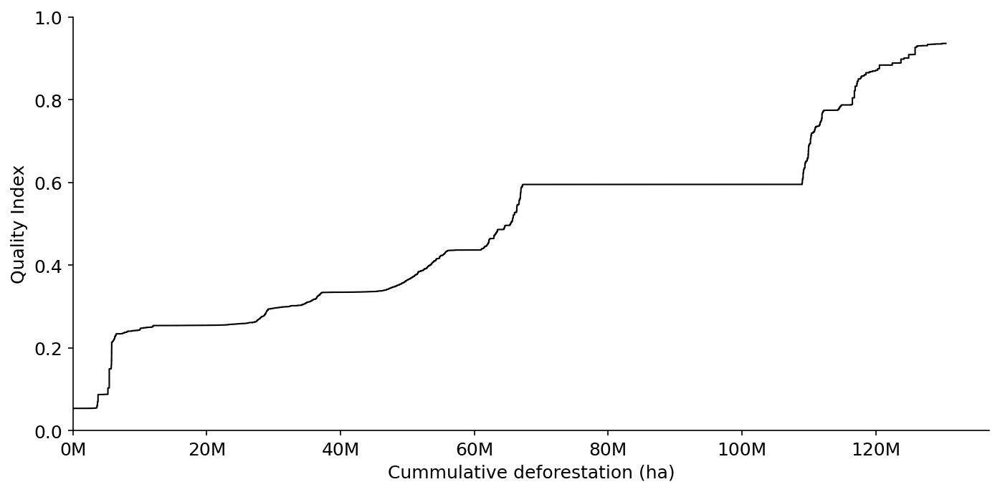

In [12]:
Singh_et_al_ranked = Singh_et_al.sort_values(by='Quality Index', ascending=True)
# Create a boolean mask where 'Deforestation attribution, unamortized (ha)' is not zero
mask = Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'] != 0
# Apply this mask to filter the rows
Singh_et_al_ranked = Singh_et_al_ranked.loc[mask]
Singh_et_al_ranked = Singh_et_al_ranked.reset_index()


Singh_et_al_ranked['Cummulative Deforestation'] = Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'] / Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'].sum()
Singh_et_al_ranked['Cummulative Deforestation'] = Singh_et_al_ranked['Cummulative Deforestation'].cumsum()*Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'].sum()

import matplotlib.pyplot as plt

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(11, 5), dpi = 150)

# Create the first plot with 'Quality Index' on the primary y-axis
#ax1 = Singh_et_al_ranked['Quality Index'].plot(label='Quality Index', drawstyle="steps", linewidth=1, color = 'black')
plt.step(Singh_et_al_ranked['Cummulative Deforestation'], Singh_et_al_ranked['Quality Index'], lw = 1, color = 'black')

# Set up the legend for both plots
plt.gca().spines[['right', 'top']].set_visible(False)
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize = 12)
plt.xticks(fontsize = 12)
plt.ylabel('Quality Index', fontsize = 12)
plt.xlabel('Cummulative deforestation (ha)', fontsize = 12)
plt.xlim(0,)
plt.ylim(0,)

def millions_formatter(x, pos):
        return '{:.0f}M'.format(x / 10**6)

# Setting the number of ticks
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))

# Show the plot
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure_6_a.svg')

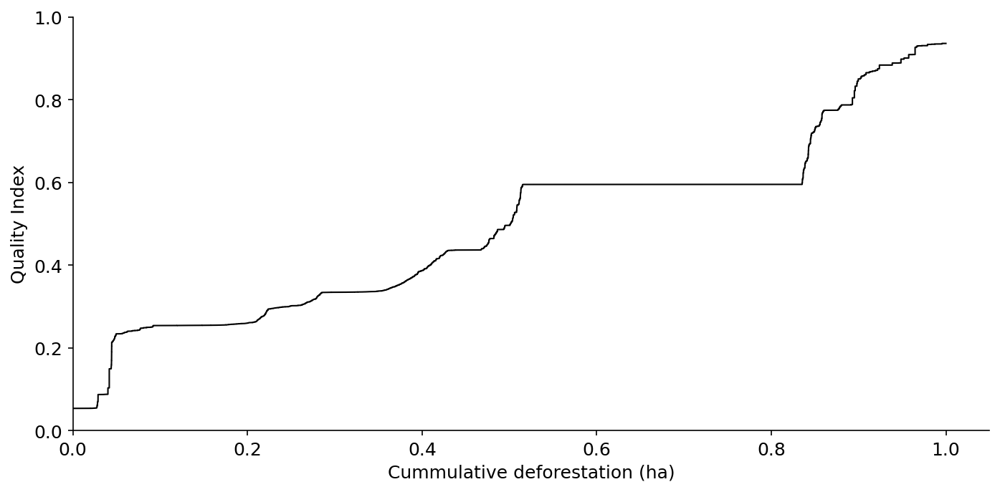

In [13]:
Singh_et_al_ranked = Singh_et_al.sort_values(by='Quality Index', ascending=True)
# Create a boolean mask where 'Deforestation attribution, unamortized (ha)' is not zero
mask = Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'] != 0
# Apply this mask to filter the rows
Singh_et_al_ranked = Singh_et_al_ranked.loc[mask]
Singh_et_al_ranked = Singh_et_al_ranked.reset_index()


Singh_et_al_ranked['Cummulative Deforestation'] = Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'] / Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'].sum()
Singh_et_al_ranked['Cummulative Deforestation'] = Singh_et_al_ranked['Cummulative Deforestation'].cumsum()*Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'].sum()

import matplotlib.pyplot as plt

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(11, 5), dpi = 150)

# Create the first plot with 'Quality Index' on the primary y-axis
#ax1 = Singh_et_al_ranked['Quality Index'].plot(label='Quality Index', drawstyle="steps", linewidth=1, color = 'black')
plt.step(Singh_et_al_ranked['Cummulative Deforestation']/Singh_et_al_ranked['Deforestation attribution, unamortized (ha)'].sum(), Singh_et_al_ranked['Quality Index'], lw = 1, color = 'black')

# Set up the legend for both plots
plt.gca().spines[['right', 'top']].set_visible(False)
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize = 12)
plt.xticks(fontsize = 12)
plt.ylabel('Quality Index', fontsize = 12)
plt.xlabel('Cummulative deforestation (ha)', fontsize = 12)
plt.xlim(0,)
plt.ylim(0,)
# Show the plot
plt.show()


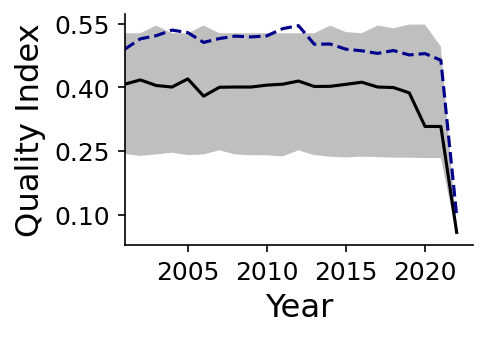

In [17]:
median = []
mean = []
percentile_1 = []
percentile_2 = []
for Year in range(2001, 2023):
    mean.append(Singh_et_al_ranked.loc[Singh_et_al_ranked['Year'] == Year, 'Quality Index'].mean())
    median.append(Singh_et_al_ranked.loc[Singh_et_al_ranked['Year'] == Year, 'Quality Index'].median())
    percentile_1.append(Singh_et_al_ranked.loc[Singh_et_al_ranked['Year'] == Year, 'Quality Index'].quantile(0.025))
    percentile_2.append(Singh_et_al_ranked.loc[Singh_et_al_ranked['Year'] == Year, 'Quality Index'].quantile(0.975))


# Assuming median, percentile_1, and percentile_2 are your data arrays/lists
years = range(2001, 2023)
fig = plt.figure(figsize=(3, 2), dpi = 150)

# Plot median
plt.plot(years, median, label='Median', color='black')
plt.plot(Singh_et_al.groupby(['Year']).apply(weighted_mean).reset_index(name='Quality Index')['Year'], 
         Singh_et_al.groupby(['Year']).apply(weighted_mean).reset_index(name='Quality Index')['Quality Index'], color = '#00008B', ls = '--')
# Fill between percentile_1 and percentile_2
plt.fill_between(years, percentile_1, percentile_2, color='gray', alpha=0.5, edgecolor = None)

# Adding labels and title
plt.xlabel('Year')
plt.ylabel('Quality Index')
plt.xlim(2001,)
plt.yticks([0.1, 0.25, 0.4, 0.55], fontsize = 12)
plt.yticks(fontsize = 12)
plt.xticks([2005, 2010, 2015, 2020], fontsize = 12)

# Set up the legend for both plots
plt.gca().spines[['right', 'top']].set_visible(False)
# Show the plot
plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure_6_a1.svg')

In [9]:
Year = '(2001-2022)'
Singh_et_al = pd.read_excel(f'{home_folder}{Simulation_version}/Generated_results/DeDuCE_Deforestation_attribution_v{Dataset_version}.{GEE_data_version}.{Python_script_version} {Year}.xlsx', sheet_name = 'Deforestation attribution')

In [10]:
GFW_Treecover_loss = pd.read_excel(f'{home_folder}{Simulation_version}/Comparison.xlsx', sheet_name = 'GFW-Tree cover loss')
GFW_Intact = pd.read_excel(f'{home_folder}{Simulation_version}/Comparison.xlsx', sheet_name = 'GFW-Intact')
GFW_Primary_forest = pd.read_excel(f'{home_folder}{Simulation_version}/Comparison.xlsx', sheet_name = 'GFW-Primary forest')
FRA = pd.read_excel(f'{home_folder}{Simulation_version}/Comparison.xlsx', sheet_name = 'FRA')

In [11]:
WRI = pd.read_excel(f'{home_folder}{Simulation_version}/Comparison.xlsx', sheet_name = 'WRI 2019')

In [12]:
Doubling_feng_et_al = pd.read_excel(f'{home_folder}{Simulation_version}/Comparison.xlsx', sheet_name = 'Doubling carbon')

In [13]:
new_Country_code = {'Sao Tome and Principe':'São Tomé and Príncipe', 'Eswatini':'Swaziland', 'Antigua':'Antigua and Barbuda',
                    'Cote dIvoire': 'Côte d\'Ivoire', 'Mexico': 'México', 'Congo': 'Republic of the Congo', 'Viet Nam': 'Vietnam', 
                    'DR Congo': 'Democratic Republic of the Congo', 'US Virgin Islands':'Virgin Islands, U.S.'}
new_FAO_code = {#'Forest plantation': 'Forest plantation (Unclassified)',
 'Almonds, with shell': 'Almonds, in shell', 
 'Anise, badian, fennel, coriander': 'Anise, badian, coriander, cumin, caraway, fennel and juniper berries, raw',
 'Berries nes': 'Other berries and fruits of the genus vaccinium n.e.c.', 
 'Fruit, citrus nes': 'Other citrus fruit, n.e.c.',
 'Fruit, fresh nes': 'Other fruits, n.e.c.', 
 'Fruit, stone nes': 'Other stone fruits',
 'Maize': 'Maize (corn)', 
 'Melons, other (inc.cantaloupes)': 'Cantaloupes and other melons',
 'Nuts nes': 'Other nuts (excluding wild edible nuts and groundnuts), in shell, n.e.c.',
 'Onions, dry': 'Onions and shallots, dry (excluding dehydrated)',
 'Pistachios': 'Pistachios, in shell', 
 'Pulses nes': 'Other pulses n.e.c.', 
 'Rice, paddy': 'Rice', 
 'Seed cotton': 'Seed cotton, unginned',
 'Spices nes': 'Other stimulant, spice and aromatic crops, n.e.c.', 
 'Vegetables, fresh nes': 'Other vegetables, fresh n.e.c.',
 'Walnuts, with shell': 'Walnuts, in shell',
 'Bastfibres, other': 'Kenaf, and other textile bast fibres, raw or retted',
 'Cabbages and other brassicas': 'Cabbages',
 'Cashew nuts, with shell': 'Cashew nuts, in shell',
 'Cassava': 'Cassava, fresh',
 'Castor oil seed': 'Castor oil seeds',
 'Cocoa, beans': 'Cocoa beans', 
 'Flax fibre and tow': 'Flax, processed but not spun',
 'Groundnuts, with shell': 'Groundnuts in shell',
 'Onions, shallots, green': 'Onions and shallots, green',
 'Sisal': 'Sisal, raw', 
 'Soybeans': 'Soya beans',
 'Tobacco, unmanufactured': 'Unmanufactured tobacco',
 'Broad beans, horse beans, dry': 'Broad beans and horse beans, dry',
 'Cereals nes': 'Cereals n.e.c.',
 'Chick peas': 'Chick peas, dry',
 'Chillies and peppers, dry': 'Chillies and peppers, dry (Capsicum spp., Pimenta spp.), raw', 
 'Chillies and peppers, green': 'Chillies and peppers, green (Capsicum spp. and Pimenta spp.)',
 'Fibre crops nes': 'Other fibre crops, raw, n.e.c.', 
 'Garlic': 'Green garlic',
 'Grapefruit (inc. pomelos)': 'Pomelos and grapefruits',
 'Hops': 'Hop cones',
 'Lentils': 'Lentils, dry', 
 'Mangoes, mangosteens, guavas': 'Mangoes, guavas and mangosteens',
 'Maté': 'Maté leaves',
 'Rapeseed': 'Rape or colza seed', # Some difference between how it is reported on the CPC sheet and FAO website
 'Tangerines, mandarins, clementines, satsumas': 'Tangerines, mandarins, clementines',
 'Tea': 'Tea leaves',
 'Cherries, sour': 'Sour cherries',
 'Fruit, tropical fresh nes': 'Other fruits, n.e.c.',
 'Hazelnuts, with shell': 'Hazelnuts, in shell', 
 'Taro (cocoyam)': 'Taro',
 'Maize, green': 'Green corn (maize)', 
 'Pigeon peas': 'Pigeon peas, dry', 
 'Plantains and others': 'Plantains and cooking bananas',
 'Coconuts': 'Coconuts, in shell', 
 'Oilseeds nes': 'Other oil seeds, n.e.c.', 
 'Pepper (piper spp.)': 'Pepper (Piper spp.), raw', 
 'Bambara beans': 'Bambara beans, dry', 
 'Coir': 'Coir, raw',
 'Ginger': 'Ginger, raw', 
 'Hemp tow waste': 'True hemp, raw or retted', 
 'Jute': 'Jute, raw or retted', 
 'Rubber, natural': 'Natural rubber in primary forms',
 'Sugar crops nes': 'Other sugar crops n.e.c.', 
 'Roots and tubers nes': 'Edible roots and tubers with high starch or inulin content, n.e.c., fresh', 
 'Yautia (cocoyam)': 'Yautia',
 'Chestnut': 'Chestnuts, in shell', 
 'Pyrethrum, dried': 'Pyrethrum, dried flowers', 
 'Vegetables, leguminous nes': 'Other green leguminous vegetables', 
 'Guarana': 'Other stimulant, spice and aromatic crops, n.e.c.', 
 'Ramie': 'Ramie, raw or retted', 
 'Nutmeg, mace and cardamoms': 'Nutmeg, mace, cardamoms, raw', 
 'Brazil nuts, with shell': 'Brazil nuts, in shell', 
 'Leeks, other alliaceous vegetables': 'Leeks and other alliaceous vegetables',
 'Agave fibres nes': 'Agave fibres, raw, n.e.c.', 
 'Cinnamon (cannella)': 'Cinnamon and cinnamon-tree flowers, raw', 
 'Cloves': 'Cloves (whole stems), raw', 
 'Vanilla':'Vanilla, raw',
 'Manila fibre (abaca)': 'Abaca, manila hemp, raw', 
 'Carobs': 'Locust beans (carobs)', 
 'Fruit, pome nes': 'Other fruits, n.e.c.', 
 'Peppermint': 'Peppermint, spearmint',
 'Jojoba seed': 'Jojoba seeds', 
 'Grain, mixed': 'Mixed grain',
 'Beans, green': 'Other beans, green'}
Continent = pd.read_excel(f'{home_folder}{Simulation_version}/Supplementary_data-DeDuCE v1.xlsx', 'Lookup-Country (GADM)')
Crop_category = pd.read_excel(f'{home_folder}{Simulation_version}/Supplementary_data-DeDuCE v1.xlsx', 'Lookup-FAO commodity')

Pendrill_attribution = pd.read_excel('/home/chandra/backup/Chalmers/Pendrill et al 2022 - Deforestation risk embodied in production and consumption - v1.1.xlsx', 'Deforestation attribution')
Pendrill_attribution['Commodity'] = Pendrill_attribution['Commodity'].replace(new_FAO_code)
Pendrill_attribution['Producer country'] = Pendrill_attribution['Producer country'].replace(new_Country_code)
Pendrill_attribution['Continent/Country group'] = Pendrill_attribution['Producer country'].map(Continent.set_index('COUNTRY')['COUNTRY GROUP'])
Pendrill_attribution['Commodity group'] = Pendrill_attribution['Commodity'].map(Crop_category.set_index('Item name')['Group'])
Pendrill_attribution = Pendrill_attribution.rename(columns= {'Deforestation emissions excl. peat drainage (MtCO2)': 'Deforestation emissions excl. peat drainage, amortized (MtCO2)'})
Pendrill_attribution = Pendrill_attribution.groupby(['Continent/Country group', 'ISO', 'Producer country', 'Year', 'Commodity group', 'Commodity']).sum().reset_index()
Pendrill_attribution = Pendrill_attribution[['Continent/Country group', 'ISO', 'Producer country', 'Year', 'Commodity group', 'Commodity',
                                             'Deforestation attribution, unamortized (ha)', 'Deforestation risk, amortized (ha)',
                                             'Deforestation emissions excl. peat drainage, amortized (MtCO2)']]


In [18]:
Pendrill_attribution_emission = pd.read_excel(f'{home_folder}{Simulation_version}/Comparison.xlsx', sheet_name = 'Pendrill')

In [15]:
Hoang_and_Kanemoto_atttribution = pd.read_csv(f'{home_folder}{Simulation_version}/Hoang and Kanemoto_commodity.csv')
Hoang_and_Kanemoto_atttribution = Hoang_and_Kanemoto_atttribution.rename(columns = {'year': 'Year'})
Hoang_and_Kanemoto_atttribution = Hoang_and_Kanemoto_atttribution.groupby('Year').sum().reset_index()
Hoang_and_Kanemoto_atttribution['Year'] = Hoang_and_Kanemoto_atttribution['Year']+2000
Hoang_and_Kanemoto_atttribution

,Year,production,consumption
0,2001,74245.797849,84308.692753
1,2002,82590.125744,94641.584593
2,2003,76118.615941,85920.977389
3,2004,108592.418376,119914.886866
4,2005,96740.351393,111181.266454
5,2006,94723.458219,109140.552638
6,2007,98004.890946,115385.717243
7,2008,97058.717073,113763.616647
8,2009,83730.489462,101453.575103
9,2010,90580.399251,108589.307076


In [16]:
Total_tree_cover_loss = pd.read_csv(f'{home_folder}{Simulation_version}/treecover_loss_by_region__ha.csv')
Total_tree_cover_loss = Total_tree_cover_loss.rename(columns = {'umd_tree_cover_loss__year': 'Year'})
Total_tree_cover_loss = Total_tree_cover_loss.groupby('Year').sum().reset_index()
Total_tree_cover_loss

,Year,umd_tree_cover_loss__ha,gfw_gross_emissions_co2e_all_gases__Mg
0,2001,1.357699e+07,4.869386e+09
1,2002,1.673918e+07,6.097194e+09
2,2003,1.476569e+07,5.087413e+09
3,2004,2.016551e+07,7.528032e+09
4,2005,1.836362e+07,7.459677e+09
5,2006,1.794275e+07,7.148683e+09
6,2007,1.865423e+07,7.675681e+09
7,2008,1.889227e+07,7.557821e+09
8,2009,1.727574e+07,7.546727e+09
9,2010,1.884088e+07,8.150802e+09


In [21]:
(Singh_et_al.groupby('Year').sum().reset_index()['Deforestation attribution, unamortized (ha)']/10**6).sum()

130.47483161611498

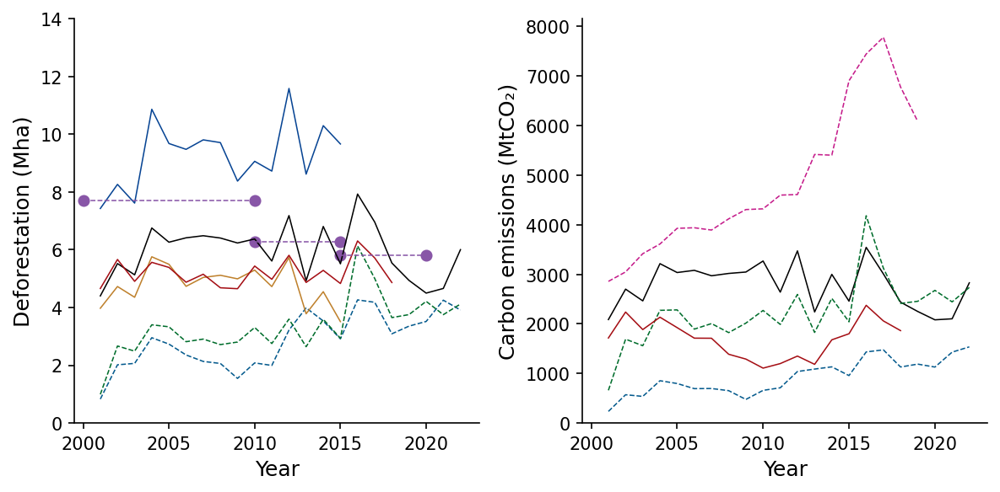

In [19]:
# Create a figure and a set of subplots
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 4), dpi=150)

ax[0].plot(Singh_et_al.groupby('Year').sum().reset_index()['Year'], 
           Singh_et_al.groupby('Year').sum().reset_index()['Deforestation attribution, unamortized (ha)']/10**6, lw = 0.75, color = 'black')
ax[0].plot(GFW_Intact.groupby('Year').sum().reset_index()['Year'], 
           GFW_Intact.groupby('Year').sum().reset_index()['Loss (ha)']/10**6, lw = 0.75, color = '#045a8d', ls = '--')
ax[0].plot(GFW_Primary_forest.groupby('Year').sum().reset_index()['Year'], 
           GFW_Primary_forest.groupby('Year').sum().reset_index()['Loss (ha)']/10**6, lw = 0.75, color = '#006d2c', ls = '--')
ax[0].plot(WRI['Year'], 
           WRI['Total']/10**6, lw = 0.75, color = '#bf812d')
ax[0].plot(Pendrill_attribution.groupby('Year').sum().reset_index()['Year'], 
           Pendrill_attribution.groupby('Year').sum().reset_index()['Deforestation attribution, unamortized (ha)']/10**6, lw = 0.75, 
           ls = '-', color = '#a50f15')
ax[0].plot(Hoang_and_Kanemoto_atttribution.groupby('Year').sum().reset_index()['Year'], 
           Hoang_and_Kanemoto_atttribution.groupby('Year').sum().reset_index()['production']*10**2/10**6, lw = 0.75, 
           ls = '-', color = '#084594')


# FRA
ax[0].plot(range(2000,2011), np.linspace(7696.23,7696.23,11)/10**3, ls = '--', lw = 0.75, color = '#8856a7')
ax[0].scatter(2000, 7696.23/10**3, lw = 0.75, color = '#8856a7')
ax[0].scatter(2010, 7696.23/10**3, lw = 0.75, color = '#8856a7')

ax[0].plot(range(2010,2016), np.linspace(6283.16,6283.16,6)/10**3, ls = '--', lw = 0.75, color = '#8856a7')
ax[0].scatter(2010, 6283.16/10**3, lw = 0.75, color = '#8856a7')
ax[0].scatter(2015, 6283.16/10**3, lw = 0.75, color = '#8856a7')

ax[0].plot(range(2015,2021), np.linspace(5818.72,5818.72,6)/10**3, ls = '--', lw = 0.75, color = '#8856a7')
ax[0].scatter(2015, 5818.72/10**3, lw = 0.75, color = '#8856a7')
ax[0].scatter(2020, 5818.72/10**3, lw = 0.75, color = '#8856a7')

ax[1].plot(Singh_et_al.groupby('Year').sum().reset_index()['Year'], 
           Singh_et_al.groupby('Year').sum().reset_index()['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'], lw = 0.75, color = 'black')
ax[1].plot(GFW_Intact.groupby('Year').sum().reset_index()['Year'], 
           GFW_Intact.groupby('Year').sum().reset_index()['Emissions (MgCO2)']/10**6, lw = 0.75, color = '#045a8d', ls = '--')
ax[1].plot(GFW_Primary_forest.groupby('Year').sum().reset_index()['Year'], 
           GFW_Primary_forest.groupby('Year').sum().reset_index()['Emissions (MgCO2)']/10**6, lw = 0.75, color = '#006d2c', ls = '--')
ax[1].plot(Pendrill_attribution_emission.groupby('Year').sum().reset_index()['Year'], 
           Pendrill_attribution_emission.groupby('Year').sum().reset_index()['Total emissions (MtCO2/yr)'], lw = 0.75, 
           ls = '-', color = '#a50f15')
ax[1].plot(Doubling_feng_et_al.groupby('Year').sum().reset_index()['Year'], 
           Doubling_feng_et_al.groupby('Year').sum().reset_index()['Emissions (MtCO2 yr-1)'], lw = 0.75, 
           ls = '--', color = '#c51b8a')

# Set up the legend for both plots
for i in range(2):
    ax[i].spines[['right', 'top']].set_visible(False)
    #ax[i].set_xticks(fontsize = 12)
    ax[i].set_xlabel('Year', fontsize = 12)
    ax[i].set_xlim(1999.5,)
    ax[i].set_ylim(0,)
    ax[i].tick_params(which='both', labelsize=10)

ax[0].set_ylim(0,14)
ax[0].set_ylabel('Deforestation (Mha)', fontsize = 12)
ax[1].set_ylabel('Carbon emissions (MtCO₂)', fontsize = 12)
# Show the plot
plt.tight_layout()

plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure_5_ab.svg')

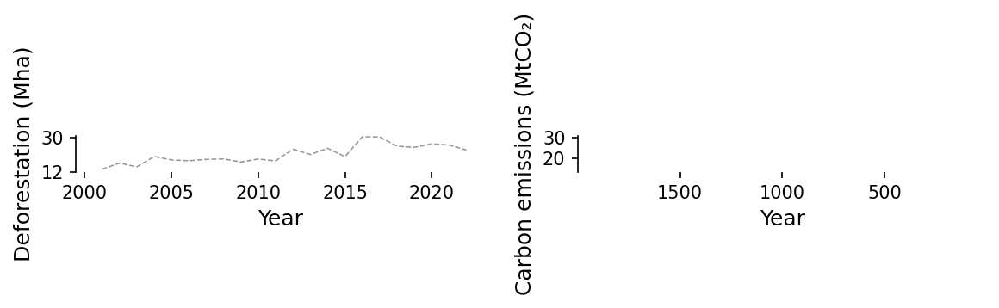

In [79]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 1.2), dpi=150)
ax[0].plot(Total_tree_cover_loss.groupby('Year').sum().reset_index()['Year'], 
           Total_tree_cover_loss.groupby('Year').sum().reset_index()['umd_tree_cover_loss__ha']/10**6, lw = 0.75, 
           ls = '--', color = '#969696')

# Set up the legend for both plots
for i in range(2):
    ax[i].spines[['right', 'top', 'bottom']].set_visible(False)
    #ax[i].set_xticks(fontsize = 12)
    ax[i].set_xlabel('Year', fontsize = 12)
    ax[i].set_xlim(1999.5,)
    ax[i].set_ylim(13,31)
    ax[i].tick_params(which='both', labelsize=10)

ax[0].set_yticks([12, 30])
ax[0].set_ylabel('Deforestation (Mha)', fontsize = 12)
ax[1].set_ylabel('Carbon emissions (MtCO₂)', fontsize = 12)
# Show the plot
plt.tight_layout()

plt.show()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure_5_a1.svg')

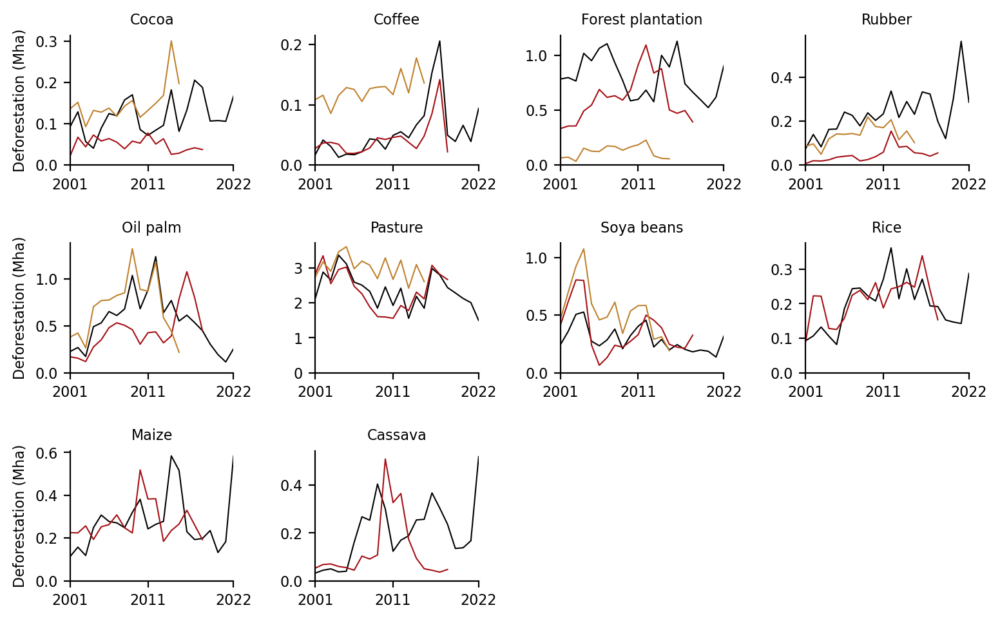

In [80]:
# Define the subplots
fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(9, 5.5), dpi=200,
                            gridspec_kw={'hspace': 0.6, 'wspace': 0.5})
plt.rc('font', size=15.5)

ax = ax.flatten()  # Flatten the array for easy iteration
i = 0; j = 0
for index, Commodity in enumerate(['Cocoa beans', 'Coffee, green', 'Forest plantation', 'Natural rubber in primary forms', 'Oil palm fruit',  'Pasture', 'Soya beans',
                                   'Rice', 'Maize (corn)', 'Cassava, fresh']):
    
    Singh_et_al_selected = Singh_et_al.groupby(['Commodity group','Commodity', 'Year']).sum().reset_index()
    if Commodity in ['Forest plantation', 'Pasture']:
        Singh_et_al_selected = Singh_et_al_selected.groupby(['Commodity group', 'Year']).sum().reset_index()
        Singh_et_al_selected = Singh_et_al_selected.loc[Singh_et_al_selected['Commodity group'] == Commodity]
    else:
        Singh_et_al_selected = Singh_et_al_selected.loc[Singh_et_al_selected['Commodity'] == Commodity]
    ax[index].plot(Singh_et_al_selected['Year'], Singh_et_al_selected['Deforestation attribution, unamortized (ha)']/10**6,
               lw = 0.75, color = 'black')
    
    Pendrill_attribution_selected = Pendrill_attribution.groupby(['Commodity group','Commodity', 'Year']).sum().reset_index()
    if Commodity in ['Forest plantation', 'Pasture']:
        Pendrill_attribution_selected = Pendrill_attribution_selected.groupby(['Commodity group', 'Year']).sum().reset_index()
        Pendrill_attribution_selected = Pendrill_attribution_selected.loc[Pendrill_attribution_selected['Commodity group'] == Commodity]
    else:
        Pendrill_attribution_selected = Pendrill_attribution_selected.loc[Pendrill_attribution_selected['Commodity'] == Commodity]
    ax[index].plot(Pendrill_attribution_selected['Year'], Pendrill_attribution_selected['Deforestation attribution, unamortized (ha)']/10**6,
               lw = 0.75, color = '#a50f15', ls = '-')
    if Commodity not in ['Rice', 'Maize (corn)', 'Cassava, fresh']:
        ax[index].plot(WRI['Year'], WRI[Commodity]/10**6, lw = 0.75, color = '#bf812d')
    
    ax[index].spines[['right', 'top']].set_visible(False)
    ax[index].set_ylim(0,)
    ax[index].set_xlim(2001,2022)
    ax[index].set_xticks([2001, 2011, 2022])
    ax[index].tick_params(which='both', labelsize=8)

for index, Commodity in enumerate(['Cocoa', 'Coffee', 'Forest plantation', 'Rubber', 'Oil palm',  'Pasture', 'Soya beans', 'Rice', 'Maize', 'Cassava']):
    ax[index].set_title(Commodity, fontsize = 8)

[fig.delaxes(ax) for ax in ax.flatten() if not ax.has_data()]
ax[0].set_ylabel('Deforestation (Mha)', fontsize = 8)
ax[4].set_ylabel('Deforestation (Mha)', fontsize = 8)
ax[8].set_ylabel('Deforestation (Mha)', fontsize = 8)
plt.tight_layout()
fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.0 (2001-2022)/Figures/Figure_5_cl.svg')

In [81]:
# Custom function to calculate the weighted mean
def weighted_mean(group):
    quality_index = group['Quality Index']
    weights = group['Deforestation attribution, unamortized (ha)']
    try:
        return (quality_index * weights).sum() / weights.sum()
    except ZeroDivisionError:
        return np.nan

In [82]:
Singh_et_al.groupby(['Producer country']).apply(
    lambda group: pd.Series({
        'Deforestation attribution, unamortized (ha)': group['Deforestation attribution, unamortized (ha)'].sum(),
        'Deforestation emissions excl. peat drainage, unamortized (MtCO2)': group['Deforestation emissions excl. peat drainage, unamortized (MtCO2)'].sum(),
        'Peatland drainage emissions (MtCO2)': group['Peatland drainage emissions (MtCO2)'].sum(),
        'Quality Index': weighted_mean(group)})
    ).reset_index()

,Producer country,"Deforestation attribution, unamortized (ha)","Deforestation emissions excl. peat drainage, unamortized (MtCO2)",Peatland drainage emissions (MtCO2),Quality Index
0,Afghanistan,4.420508e+02,0.211168,0.004044,0.433700
1,Albania,1.104088e+04,0.791445,0.001302,0.278445
2,Algeria,7.477619e+03,1.952677,0.025528,0.443342
3,Angola,1.229576e+06,704.970744,2.203112,0.311879
4,Antigua and Barbuda,4.039836e+02,0.160959,0.002888,0.326261
...,...,...,...,...,...
171,Venezuela,8.308020e+05,361.374180,6.235285,0.312426
172,Vietnam,2.124754e+06,753.146017,10.760202,0.394757
173,Yemen,2.246056e-01,0.000083,0.000000,0.364977
174,Zambia,7.190740e+05,487.253578,0.493663,0.352211


In [22]:
Year = '(2001-2022)'
Singh_et_al = pd.read_excel(f'{home_folder}{Simulation_version}/Generated_results/DeDuCE_Deforestation_attribution_v{Dataset_version}.{GEE_data_version}.{Python_script_version} {Year}.xlsx', sheet_name = 'Deforestation attribution')

In [74]:
Brazil = Singh_et_al.loc[Singh_et_al['Producer country'] == 'Brazil']
Brazil = Brazil[['Year', 'Commodity group', 'Deforestation attribution, unamortized (ha)']]
Brazil = Brazil.groupby(['Year','Commodity group']).sum().reset_index()

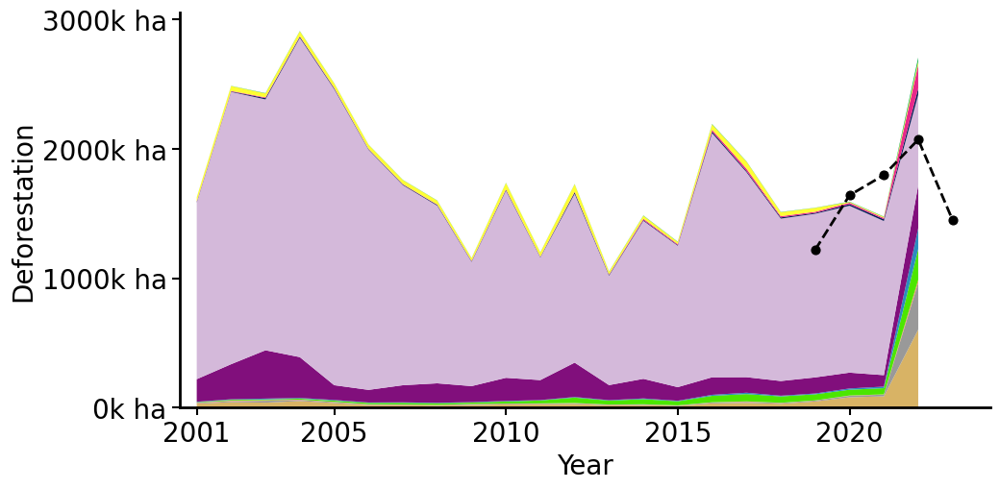

In [138]:
# Pivot the DataFrame to get years as columns and commodity groups as rows
pivot_df = Brazil.pivot(index='Commodity group', columns='Year', values='Deforestation attribution, unamortized (ha)')
color_map = dict(zip(Commodity_group_color['Commodity group'], Commodity_group_color['Color']))
colors = [color_map[group] for group in pivot_df.index]
# Plotting
plt.figure(figsize=(10.5, 5.2))
plt.stackplot(pivot_df.columns, pivot_df.values, labels=pivot_df.index, baseline='zero', colors=colors)
plt.xlabel('Year', fontsize = 20)
plt.ylabel('Deforestation', fontsize = 20)
plt.legend(loc='upper left')
plt.plot([2019, 2020, 2021, 2022, 2023], [1219446.11,1640871.344,1796924.094,2071418.74,1449143.848], color = 'black', lw = 2, ls = '--')
plt.scatter([2019, 2020, 2021, 2022, 2023], [1219446.11,1640871.344,1796924.094,2071418.74,1449143.848], color = 'black', s = 40)

# Define the formatting function
def millions_formatter(x, pos):
    return '{:.0f}k ha'.format(x / 1000)
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))
plt.gca().spines[['right', 'top']].set_visible(False)
plt.tick_params(which='both', labelsize=20)
plt.xlim(2000.5,)
plt.xticks([2001, 2005, 2010, 2015, 2020])
plt.yticks([0, 10**6, 2*10**6, 3*10**6])
plt.legend().remove()

plt.tick_params(axis='both', which='major', labelsize=20, width=1.5, length=6)
plt.gca().spines['left'].set_linewidth(2)  # Top border
plt.gca().spines['bottom'].set_linewidth(2)  # Bottom border
plt.tight_layout()
plt.show()